# 1 Outcome

In [16]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
#---------------------------------------------------------------------------JOINT PLOTS.  ONE PLOT PER  TARGETED PROPERTY AND POLICY-----------------------------------------

# ============================================================
# CONFIG
# ============================================================
seeds = range(5)

DATASETS = ["jarvis18", "jarvis22", "mp18", "mp21"]
TARGETS = ["bandgap", "bulk_modulus", "e_form"]

# Where your CSVs live
ROOT_RANDOM = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\random"
ROOT_QBC    = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\QBC"
ROOT_QBCDIV = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\QBC_DIVERSITY"

# Output base
OUT_DIR = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT"

# ============================================================
# Metrics
# ============================================================
metrics_internal = {
    "rmse_bandgap": "Bandgap (eV)",
    "rmse_bulk_modulus": "Bulk Modulus (GPa)",
    "rmse_eform": r"Formation Energy (eV atom$^{-1}$)",
}

# Column maps
COLMAP_RANDOM_QBC = {
    "rmse_bandgap": "rmse_bandgap",
    "rmse_bulk_modulus": "rmse_bulk_modulus",
    "rmse_eform": "rmse_eform",
}
COLMAP_QBCDIV = {
    "rmse_bandgap": "rmse_bandgap",
    "rmse_bulk_modulus": "rmse_bulk_modulus",
    "rmse_eform": "rmse_e_form",  # key difference
}

# ============================================================
# Filename conventions
# ============================================================
def random_csv_name(dataset: str, seed: int) -> str:
    return f"{dataset}_all_random_rf{seed}.csv"

def qbc_csv_name(dataset: str, target: str) -> str:
    return f"{dataset}_{target}_QBC_rf.csv"

def qbcdiv_csv_name(dataset: str, target: str, seed: int) -> str:
    return f"{dataset}_{target}_QBCdiversity_rf{seed}.csv"

def target_label(target: str) -> str:
    if target == "bandgap":
        return "Bandgap"
    if target == "bulk_modulus":
        return "Bulk Modulus"
    if target == "e_form":
        return "Formation Energy"
    return target

# ============================================================
# IO helpers
# ============================================================
def read_run_csv(path: str, colmap: dict) -> pd.DataFrame:
    df = pd.read_csv(path)

    if "train_ratio" not in df.columns:
        raise ValueError(f"Missing 'train_ratio' in {path}")

    for internal_name, file_col in colmap.items():
        if file_col not in df.columns:
            raise ValueError(f"Missing '{file_col}' (mapped to {internal_name}) in {path}")

    out = pd.DataFrame({"train_ratio": df["train_ratio"].values})
    for internal_name, file_col in colmap.items():
        out[internal_name] = df[file_col].values
    return out

def aggregate_over_seeds(paths: list, colmap: dict) -> pd.DataFrame:
    per_seed = []
    for seed, p in paths:
        tmp = read_run_csv(p, colmap)
        tmp["seed"] = seed
        per_seed.append(tmp)

    data = pd.concat(per_seed, ignore_index=True)

    agg = (
        data.groupby("train_ratio")[list(metrics_internal.keys())]
        .agg(["mean", "std"])
        .reset_index()
        .sort_values("train_ratio")
    )
    return agg

# ============================================================
# Plotting: 3 metrics in ONE single image per target
# ============================================================
def plot_all_metrics_for_dataset_target(
    dataset: str,
    target: str,
    agg_by_run: dict,
    dataset_out_dir: str,
) -> None:
    metric_cols = list(metrics_internal.keys())
    panel_labels = ["a)", "b)", "c)"]

    fig, axes = plt.subplots(1, 3, figsize=(21, 10), sharex=True)

    for i, (ax, metric_col) in enumerate(zip(axes, metric_cols)):
        for run_name, agg in agg_by_run.items():
            x_percent = agg["train_ratio"].to_numpy(dtype=float) * 100.0
            mean = agg[(metric_col, "mean")].to_numpy(dtype=float)
            std = agg[(metric_col, "std")].to_numpy(dtype=float)

            ax.plot(x_percent, mean, linewidth=2, label=run_name)
            ax.fill_between(x_percent, mean - std, mean + std, alpha=0.18)

        ax.set_xlabel("Training data (%)", fontsize=25)
        ax.set_ylabel(f"RMSE {metrics_internal[metric_col]}", fontsize=25)

        ax.set_title(
            f"{panel_labels[i]}",
            fontsize=25,
            fontweight="bold",
            loc="left"
        )

        xticks = np.arange(10, 101, 10)
        ax.set_xticks(xticks)
        ax.tick_params(axis="x", labelrotation=45, labelsize=20)
        ax.tick_params(axis="y", labelsize=20)

        ax.margins(x=0)
        ax.grid(alpha=0.3)

    fig.suptitle(
        f"{dataset.upper()} — Target: {target_label(target)}",
        fontsize=30,
        fontweight="bold",
        y=0.925,
    )

    # One legend below all subplots
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles,
        labels,
        loc="lower center",
        ncol=3,
        fontsize=25,
        frameon=False,
        bbox_to_anchor=(0.5, -0.02)
    )

    # Leave room at the bottom for the legend
    fig.tight_layout(rect=[0, 0.05, 1, 0.93])

    out_path = os.path.join(
        dataset_out_dir,
        f"{dataset}_target_{target}__all_rmse.png"
    )
    fig.savefig(out_path, dpi=100, bbox_inches="tight")
    plt.close(fig)

# ============================================================
# Main loop
# For each dataset + target: ONE figure containing 3 subplots
# ============================================================
os.makedirs(OUT_DIR, exist_ok=True)

for dataset in DATASETS:
    dataset_out_dir = os.path.join(OUT_DIR, dataset)
    os.makedirs(dataset_out_dir, exist_ok=True)

    for target in TARGETS:
        runs = {
            "Random sampling": {
                "paths": [
                    (seed, os.path.join(ROOT_RANDOM, dataset, "all", str(seed), random_csv_name(dataset, seed)))
                    for seed in seeds
                ],
                "colmap": COLMAP_RANDOM_QBC,
            },
            f"QBC target: {target_label(target)}": {
                "paths": [
                    (seed, os.path.join(ROOT_QBC, dataset, target, str(seed), qbc_csv_name(dataset, target)))
                    for seed in seeds
                ],
                "colmap": COLMAP_RANDOM_QBC,
            },
            f"QBC+Diversity target: {target_label(target)}": {
                "paths": [
                    (seed, os.path.join(ROOT_QBCDIV, dataset, target, str(seed), qbcdiv_csv_name(dataset, target, seed)))
                    for seed in seeds
                ],
                "colmap": COLMAP_QBCDIV,
            },
        }

        agg_by_run = {}
        for run_name, info in runs.items():
            missing = [p for (_, p) in info["paths"] if not os.path.exists(p)]
            if missing:
                preview = "\n".join(missing[:8])
                raise FileNotFoundError(
                    f"[{dataset} | target={target}] Missing {len(missing)} file(s) for run '{run_name}'.\n"
                    f"First missing paths:\n{preview}"
                )
            agg_by_run[run_name] = aggregate_over_seeds(info["paths"], info["colmap"])

        plot_all_metrics_for_dataset_target(
            dataset=dataset,
            target=target,
            agg_by_run=agg_by_run,
            dataset_out_dir=dataset_out_dir,
        )

print(f"Done. Saved combined plots to:\n{OUT_DIR}")

Done. Saved combined plots to:
C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT


In [6]:
#--------------------------------------------------------------------------------------------------------------------------PLOTS WITH XGBOOSTS-----------------------------------------------------------------------------------------------------------------------
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ============================================================
# CONFIG
# ============================================================
seeds = range(5)

DATASETS = ["jarvis18", "jarvis22", "mp18", "mp21"]
TARGETS = ["bandgap", "bulk_modulus", "e_form"]

# Where your CSVs live
ROOT_RANDOM = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\random"
ROOT_QBC    = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\QBC"
ROOT_QBCDIV = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\QBC_DIVERSITY"

# Output base
OUT_DIR = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT_XGBOOST"

# ============================================================
# Metrics
# ============================================================
metrics_internal = {
    "rmse_bandgap": "Bandgap (eV)",
    "rmse_bulk_modulus": "Bulk Modulus (GPa)",
    "rmse_eform": r"Formation Energy (eV atom$^{-1}$)",
}

# Column maps
COLMAP_RANDOM_QBC = {
    "rmse_bandgap": "rmse_bandgap",
    "rmse_bulk_modulus": "rmse_bulk_modulus",
    "rmse_eform": "rmse_eform",
}

COLMAP_QBCDIV = {
    "rmse_bandgap": "rmse_bandgap",
    "rmse_bulk_modulus": "rmse_bulk_modulus",
    "rmse_eform": "rmse_e_form",
}

# ============================================================
# Filename conventions for XGBoost
# Example:
# mp18_e_form_QBCdiversity_xgb3.CSV
# ============================================================
def random_csv_name(dataset: str, seed: int) -> str:
    return f"{dataset}_all_random_xgb{seed}.CSV"

def qbc_csv_name(dataset: str, target: str, seed: int) -> str:
    return f"{dataset}_{target}_QBC_xgb.CSV"

def qbcdiv_csv_name(dataset: str, target: str, seed: int) -> str:
    return f"{dataset}_{target}_QBCdiversity_xgb{seed}.CSV"


def target_label(target: str) -> str:
    if target == "bandgap":
        return "Bandgap"
    if target == "bulk_modulus":
        return "Bulk Modulus"
    if target == "e_form":
        return "Formation Energy"
    return target

# ============================================================
# IO helpers
# ============================================================
def read_run_csv(path: str, colmap: dict) -> pd.DataFrame:
    df = pd.read_csv(path)

    if "train_ratio" not in df.columns:
        raise ValueError(f"Missing 'train_ratio' in {path}")

    for internal_name, file_col in colmap.items():
        if file_col not in df.columns:
            raise ValueError(
                f"Missing '{file_col}' mapped to '{internal_name}' in {path}"
            )

    out = pd.DataFrame({"train_ratio": df["train_ratio"].values})

    for internal_name, file_col in colmap.items():
        out[internal_name] = df[file_col].values

    return out

def aggregate_over_seeds(paths: list, colmap: dict) -> pd.DataFrame:
    per_seed = []

    for seed, p in paths:
        tmp = read_run_csv(p, colmap)
        tmp["seed"] = seed
        per_seed.append(tmp)

    data = pd.concat(per_seed, ignore_index=True)

    agg = (
        data.groupby("train_ratio")[list(metrics_internal.keys())]
        .agg(["mean", "std"])
        .reset_index()
        .sort_values("train_ratio")
    )

    return agg

# ============================================================
# Plotting
# ============================================================
def plot_all_metrics_for_dataset_target(
    dataset: str,
    target: str,
    agg_by_run: dict,
    dataset_out_dir: str,
) -> None:

    metric_cols = list(metrics_internal.keys())
    panel_labels = ["a)", "b)", "c)"]

    fig, axes = plt.subplots(1, 3, figsize=(21, 10), sharex=True)

    for i, (ax, metric_col) in enumerate(zip(axes, metric_cols)):

        for run_name, agg in agg_by_run.items():
            x_percent = agg["train_ratio"].to_numpy(dtype=float) * 100.0
            mean = agg[(metric_col, "mean")].to_numpy(dtype=float)
            std = agg[(metric_col, "std")].to_numpy(dtype=float)

            ax.plot(x_percent, mean, linewidth=2, label=run_name)
            ax.fill_between(x_percent, mean - std, mean + std, alpha=0.18)

        ax.set_xlabel("Training data (%)", fontsize=25)
        ax.set_ylabel(f"RMSE {metrics_internal[metric_col]}", fontsize=25)

        ax.set_title(
            panel_labels[i],
            fontsize=25,
            fontweight="bold",
            loc="left"
        )

        xticks = np.arange(10, 101, 10)
        ax.set_xticks(xticks)

        ax.tick_params(axis="x", labelrotation=45, labelsize=20)
        ax.tick_params(axis="y", labelsize=20)

        ax.margins(x=0)
        ax.grid(alpha=0.3)

    fig.suptitle(
        f"{dataset.upper()} — Target: {target_label(target)}",
        fontsize=30,
        fontweight="bold",
        y=0.925,
    )

    handles, labels = axes[0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        loc="lower center",
        ncol=3,
        fontsize=25,
        frameon=False,
        bbox_to_anchor=(0.5, -0.02)
    )

    fig.tight_layout(rect=[0, 0.05, 1, 0.93])

    out_path = os.path.join(
        dataset_out_dir,
        f"{dataset}_target_{target}__all_rmse_xgb.png"
    )

    fig.savefig(out_path, dpi=100, bbox_inches="tight")
    plt.close(fig)

# ============================================================
# Main loop
# ============================================================
os.makedirs(OUT_DIR, exist_ok=True)

for dataset in DATASETS:

    dataset_out_dir = os.path.join(OUT_DIR, dataset)
    os.makedirs(dataset_out_dir, exist_ok=True)

    for target in TARGETS:

        runs = {
            "Random sampling": {
                "paths": [
                    (
                        seed,
                        os.path.join(
                            ROOT_RANDOM,
                            dataset,
                            "all",
                            str(seed),
                            random_csv_name(dataset, seed)
                        )
                    )
                    for seed in seeds
                ],
                "colmap": COLMAP_RANDOM_QBC,
            },

            f"QBC target: {target_label(target)}": {
                "paths": [
                    (
                        seed,
                        os.path.join(
                            ROOT_QBC,
                            dataset,
                            target,
                            str(seed),
                            qbc_csv_name(dataset, target, seed)
                        )
                    )
                    for seed in seeds
                ],
                "colmap": COLMAP_RANDOM_QBC,
            },

            f"QBC+Diversity target: {target_label(target)}": {
                "paths": [
                    (
                        seed,
                        os.path.join(
                            ROOT_QBCDIV,
                            dataset,
                            target,
                            str(seed),
                            qbcdiv_csv_name(dataset, target, seed)
                        )
                    )
                    for seed in seeds
                ],
                "colmap": COLMAP_QBCDIV,
            },
        }

        agg_by_run = {}

        for run_name, info in runs.items():

            missing = [p for (_, p) in info["paths"] if not os.path.exists(p)]

            if missing:
                preview = "\n".join(missing[:8])
                raise FileNotFoundError(
                    f"[{dataset} | target={target}] Missing {len(missing)} file(s) "
                    f"for run '{run_name}'.\n"
                    f"First missing paths:\n{preview}"
                )

            agg_by_run[run_name] = aggregate_over_seeds(
                info["paths"],
                info["colmap"]
            )

        plot_all_metrics_for_dataset_target(
            dataset=dataset,
            target=target,
            agg_by_run=agg_by_run,
            dataset_out_dir=dataset_out_dir,
        )

print(f"Done. Saved XGBoost combined plots to:\n{OUT_DIR}")

Done. Saved XGBoost combined plots to:
C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT_XGBOOST


# Two outcomes - Bandgap Bulk Modulus

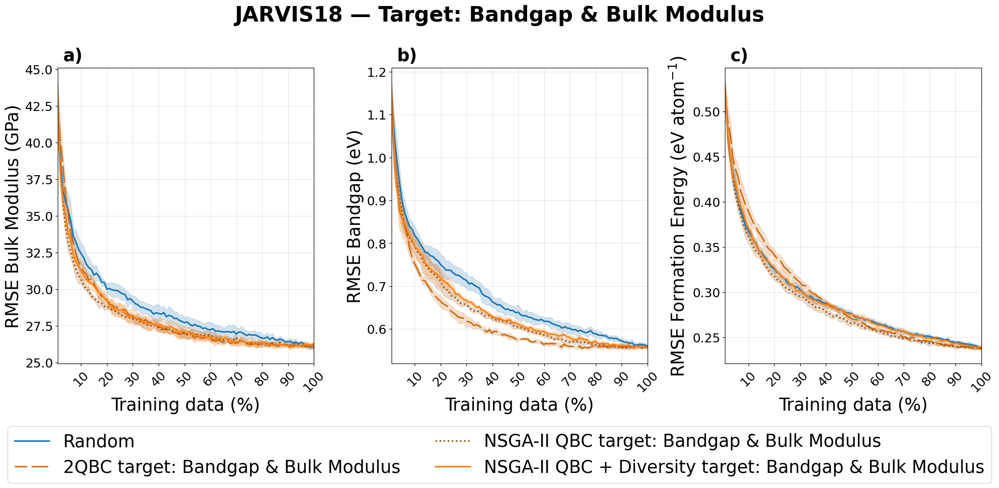

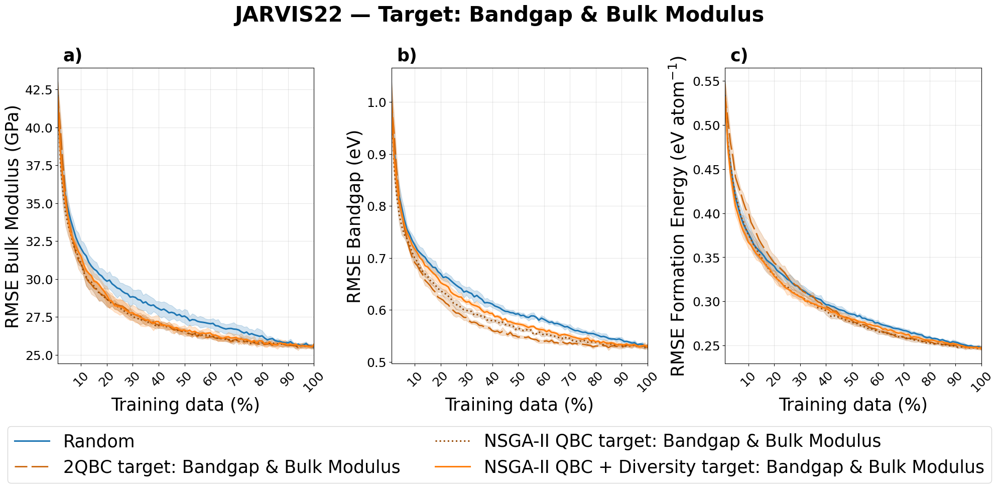

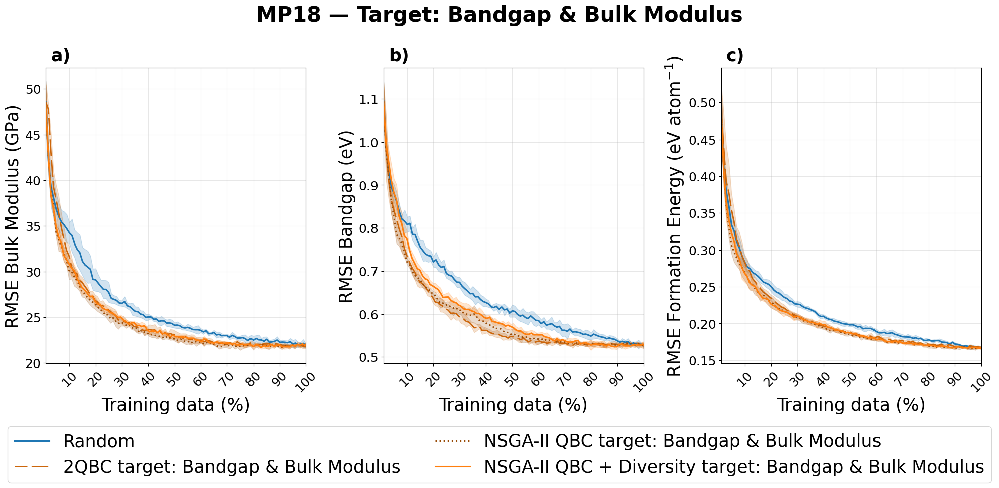

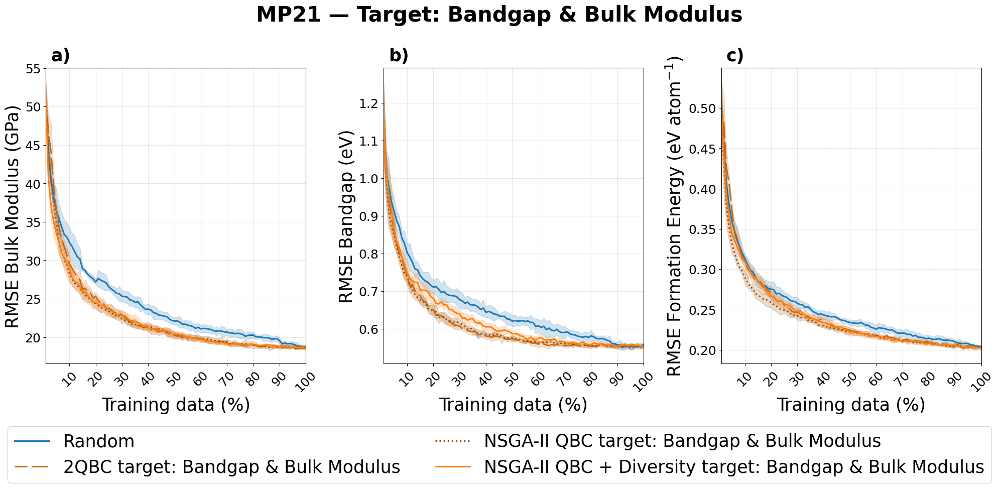

In [9]:
import os
import re
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# -------------------------------------------------
# Output directory
# -------------------------------------------------
output_dir = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT"
os.makedirs(output_dir, exist_ok=True)

# -------------------------------------------------
# Helpers
# -------------------------------------------------
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

def darken(color, factor):
    rgb = np.array(mcolors.to_rgb(color))
    return tuple(np.clip(rgb * factor, 0, 1))

# -------------------------------------------------
# Base colors per family
# -------------------------------------------------
BASE_FAMILY_COLOR = {
    "random": "C0",
    "bandgap_bulk": "C1",
    "bandgap_eform": "C2",
    "eform_bulk": "C3",
}

def policy_family(pol_name: str) -> str:
    if "bg_bm" in pol_name:
        return "bandgap_bulk"
    if "bg_ef" in pol_name:
        return "bandgap_eform"
    if "ef_bm" in pol_name or "eform_bulk" in pol_name:
        return "eform_bulk"
    if "random" in pol_name:
        return "random"
    return pol_name

def policy_color(pol):
    fam = policy_family(pol["name"])
    base = BASE_FAMILY_COLOR.get(fam, "C7")

    if fam == "random":
        return base
    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return base
    if pol.get("is_qbc_not_nsga", False):
        return darken(base, 0.80)
    return darken(base, 0.60)

def nsga_linestyle(pol) -> str:
    if pol["name"] == "random":
        return "-"
    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return "-"
    return ":"

# -------------------------------------------------
# Datasets to plot
# -------------------------------------------------
DATASETS = ["jarvis18", "jarvis22", "mp18", "mp21"]

# -------------------------------------------------
# Seeds
# -------------------------------------------------
seeds = range(5)

# -------------------------------------------------
# Base root
# -------------------------------------------------
ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto"
    r"\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition"
)

# -------------------------------------------------
# X-axis ticks every 10%
# -------------------------------------------------
TICK_PCT = np.arange(10, 101, 10, dtype=float)

# -------------------------------------------------
# Policies
# -------------------------------------------------
policies = [
    {
        "name": "random",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\random\{dataset}\all",
        "filename_tpl": "{dataset}_all_random_rf{seed}.csv",
        "filename_has_seed": True,
        "label": "Random",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "qbc_bg_bm",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_MultiObj2Outcomes\{dataset}\bandgap_bulkmodulus",
        "filename_tpl": "{dataset}_bandgap_bulkmodulusMultiObjective_OptDiffModelsOnly2Var_rf.csv",
        "filename_has_seed": False,
        "label": "2QBC target: Bandgap & Bulk Modulus",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": True,
    },
    {
        "name": "bg_bm_nsga_qbc_only",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsOnlyQBC\{dataset}\bandgap_bulkmodulus",
        "filename_tpl": "{dataset}_bandgap_bulkmodulusgrowing_EA_2obj_qbc_only_rf{seed}.csv",
        "filename_has_seed": True,
        "label": "NSGA-II QBC target: Bandgap & Bulk Modulus ",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "bg_bm_nsga_div",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsDiversity\{dataset}\bandgap_bulkmodulus",
        "filename_tpl": "{dataset}_bandgap_bulkmodulusgrowing_EA_2obj_qbc_Diversity_rf{seed}.csv",
        "filename_has_seed": True,
        "label": "NSGA-II QBC + Diversity target: Bandgap & Bulk Modulus",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    }
]

QBC_LONG_DASH = (3, (12, 3))

# -------------------------------------------------
# Path resolver
# -------------------------------------------------
def candidate_paths(pol, base_dir, seed, fname):
    stem = os.path.splitext(fname)[0]
    flat = os.path.join(base_dir, str(seed), fname)
    nested = os.path.join(base_dir, str(seed), stem, fname)

    if pol.get("try_both_layouts", False):
        if pol.get("inside_subfolder_same_as_stem", False):
            return [nested, flat]
        return [flat, nested]

    return [nested] if pol.get("inside_subfolder_same_as_stem", False) else [flat]

# -------------------------------------------------
# Plot helper for each subplot
# -------------------------------------------------
def plot_metric_on_ax(ax, data, metric, ylabel, panel_title, panel_letter):
    any_plotted = False

    for pol in policies:
        sub = data[data["policy"] == pol["name"]]
        if sub.empty or metric not in sub.columns:
            continue

        grouped = sub.groupby("train_pct")[metric]
        mean = grouped.mean()
        std = grouped.std().fillna(0)

        color = policy_color(pol)

        if pol.get("is_qbc_not_nsga", False):
            linestyle = QBC_LONG_DASH
            linewidth = 2.0
        else:
            linestyle = nsga_linestyle(pol)
            linewidth = 2.2

        x_plot = mean.index.values

        ax.plot(
            x_plot,
            mean.values,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=pol["label"],
        )

        ax.fill_between(
            x_plot,
            mean.values - std.values,
            mean.values + std.values,
            color=color,
            alpha=0.20,
        )

        any_plotted = True

    if not any_plotted:
        ax.set_visible(False)
        return [], []

    ax.set_xticks(TICK_PCT)
    ax.set_xlim(1, 100)
    ax.margins(x=0)
    ax.tick_params(axis="x", labelrotation=45, labelsize=18)
    ax.tick_params(axis="y", labelsize=18)
    ax.set_xlabel("Training data (%)", fontsize=25)
    ax.set_ylabel(ylabel, fontsize=25)
    #ax.set_title(panel_title, fontsize=20, fontweight="bold")
    ax.grid(alpha=0.3)

    # panel label: a), b), c)
    ax.text(
        0.02, 1.07, panel_letter,
        transform=ax.transAxes,
        fontsize=25,
        fontweight="bold",
        va="top",
        ha="left"
    )

    handles, labels = ax.get_legend_handles_labels()
    return handles, labels

# -------------------------------------------------
# Combined figure per dataset
# -------------------------------------------------
def plot_all_metrics_one_figure(data, dataset):
    fig, axes = plt.subplots(1, 3, figsize=(20, 10))

    fig.suptitle(
        f"{dataset.upper()} — Target: Bandgap & Bulk Modulus",
        fontsize=30,
        fontweight="bold",
        y=0.95
    )

    all_handles = []
    all_labels = []

    metric_specs = [
        ("rmse_bulk_modulus", "RMSE Bulk Modulus (GPa)", "Bulk Modulus", "a)"),
        ("rmse_bandgap", "RMSE Bandgap (eV)", "Bandgap", "b)"),
        ("rmse_eform_unified", r"RMSE Formation Energy (eV atom$^{-1}$)", "Formation Energy", "c)"),
    ]

    for ax, (metric, ylabel, panel_title, panel_letter) in zip(axes, metric_specs):
        handles, labels = plot_metric_on_ax(ax, data, metric, ylabel, panel_title, panel_letter)
        for h, l in zip(handles, labels):
            if l not in all_labels:
                all_handles.append(h)
                all_labels.append(l)

    if all_handles:
        fig.legend(
            all_handles,
            all_labels,
            loc="lower center",
            bbox_to_anchor=(0.5, -0.02),
            ncol=2,
            fontsize=25,
            frameon=True
        )

    plt.tight_layout(rect=[0, 0.12, 1, 0.95])

    filename = f"{sanitize_filename(dataset.upper() + '_RMSE_All_Metrics_bandgap_bulkmodulus')}.png"
    save_path = os.path.join(output_dir, filename)
    plt.savefig(save_path, dpi=100, bbox_inches="tight", pad_inches=0.03)
    plt.show()
    plt.close()

# -------------------------------------------------
# Main loop
# -------------------------------------------------
for dataset in DATASETS:
    all_data = []
    missing = []

    for pol in policies:
        base_dir = pol["base_dir_tpl"].format(dataset=dataset)

        for seed in seeds:
            if pol["filename_has_seed"]:
                fname = pol["filename_tpl"].format(dataset=dataset, seed=seed)
            else:
                fname = pol["filename_tpl"].format(dataset=dataset)

            found_path = None
            for path in candidate_paths(pol, base_dir, seed, fname):
                if os.path.exists(path):
                    found_path = path
                    break

            if found_path is None:
                missing.append((dataset, pol["name"], seed, candidate_paths(pol, base_dir, seed, fname)[0]))
                continue

            df = pd.read_csv(found_path)
            if "train_ratio" not in df.columns:
                raise ValueError(f"'train_ratio' not found in: {found_path}")

            df["seed"] = seed
            df["policy"] = pol["name"]
            df["train_pct"] = df["train_ratio"] * 100.0
            all_data.append(df)

    if not all_data:
        print(f"\n[WARNING] No data loaded for dataset={dataset}. Check your paths.\n")
        if missing:
            print("First few missing paths:")
            for ds, polname, seed, path in missing[:10]:
                print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")
        continue

    data = pd.concat(all_data, ignore_index=True)

    if missing:
        print(f"\n[WARNING] Some files were not found for dataset={dataset}:")
        for ds, polname, seed, path in missing[:20]:
            print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")
        if len(missing) > 20:
            print(f"  ... and {len(missing) - 20} more missing files.\n")

    # unify formation energy RMSE
    data["rmse_eform_unified"] = np.nan
    if "rmse_eform" in data.columns:
        m = data["rmse_eform"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_eform"]
    if "rmse_e_form" in data.columns:
        m = data["rmse_eform_unified"].isna() & data["rmse_e_form"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_e_form"]

    plot_all_metrics_one_figure(data, dataset)

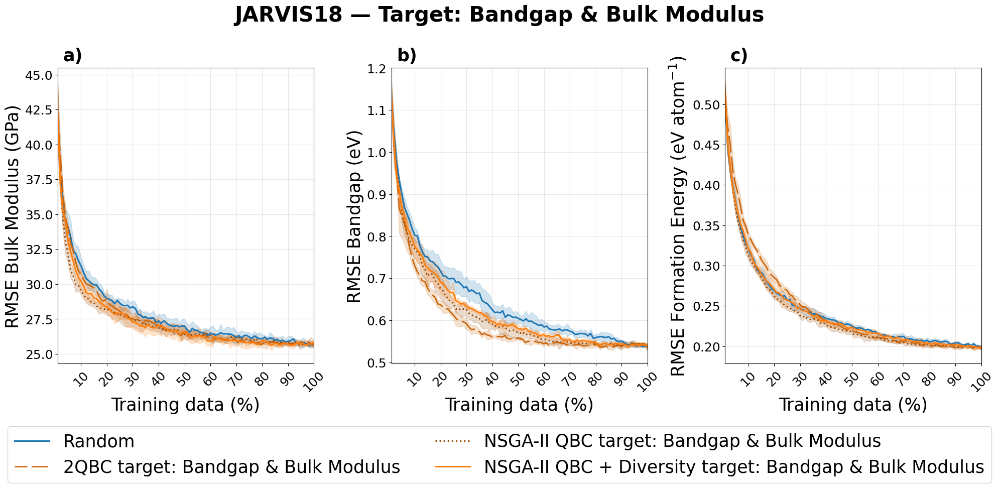

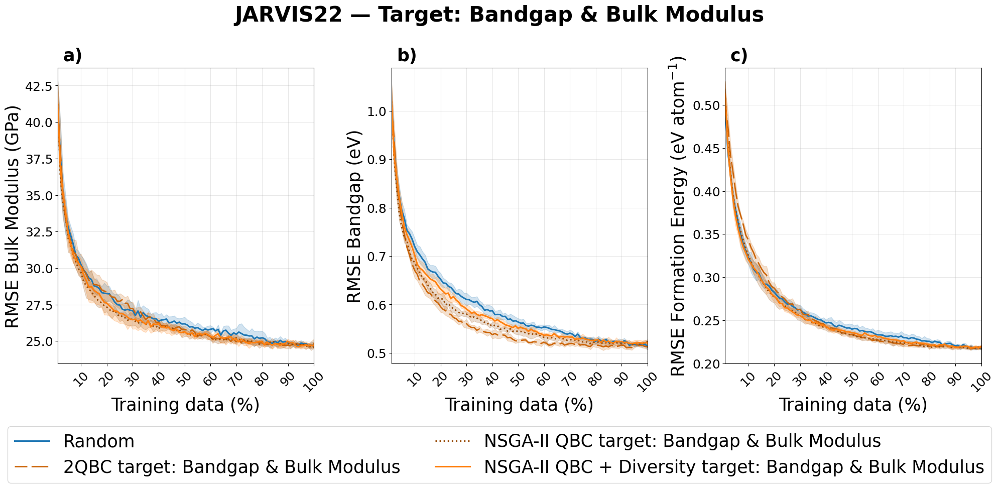

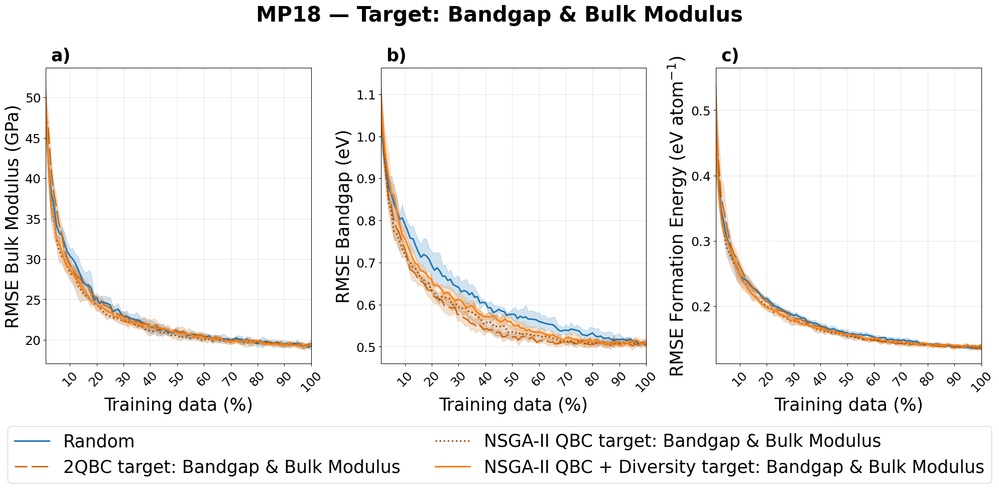

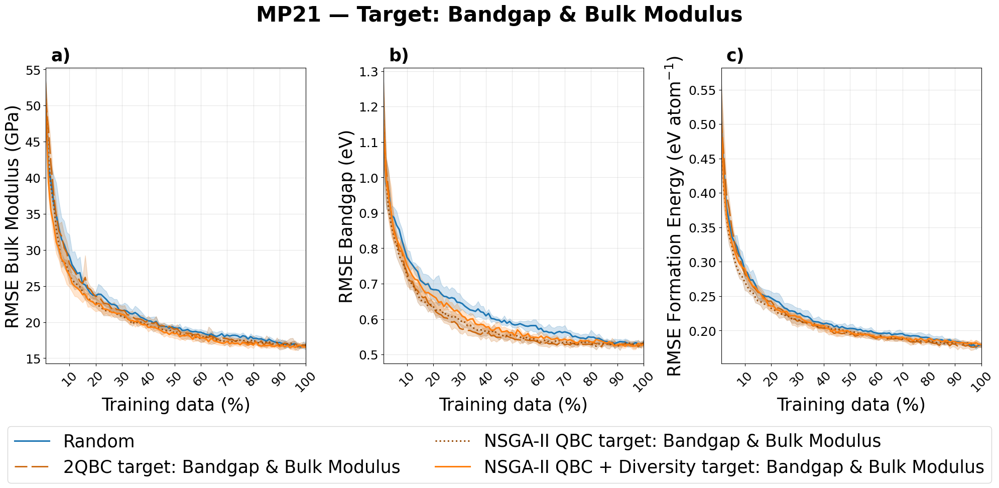

Done. Saved XGBoost plots to:
C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT_XGBOOST


In [11]:
import os
import re
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# -------------------------------------------------
# Output directory
# -------------------------------------------------
output_dir = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT_XGBOOST"
os.makedirs(output_dir, exist_ok=True)

# -------------------------------------------------
# Helpers
# -------------------------------------------------
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

def darken(color, factor):
    rgb = np.array(mcolors.to_rgb(color))
    return tuple(np.clip(rgb * factor, 0, 1))

# -------------------------------------------------
# Base colors per family
# -------------------------------------------------
BASE_FAMILY_COLOR = {
    "random": "C0",
    "bandgap_bulk": "C1",
    "bandgap_eform": "C2",
    "eform_bulk": "C3",
}

def policy_family(pol_name: str) -> str:
    if "bg_bm" in pol_name:
        return "bandgap_bulk"
    if "bg_ef" in pol_name:
        return "bandgap_eform"
    if "ef_bm" in pol_name or "eform_bulk" in pol_name:
        return "eform_bulk"
    if "random" in pol_name:
        return "random"
    return pol_name

def policy_color(pol):
    fam = policy_family(pol["name"])
    base = BASE_FAMILY_COLOR.get(fam, "C7")

    if fam == "random":
        return base
    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return base
    if pol.get("is_qbc_not_nsga", False):
        return darken(base, 0.80)
    return darken(base, 0.60)

def nsga_linestyle(pol) -> str:
    if pol["name"] == "random":
        return "-"
    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return "-"
    return ":"

# -------------------------------------------------
# Datasets to plot
# -------------------------------------------------
DATASETS = ["jarvis18", "jarvis22", "mp18", "mp21"]

# -------------------------------------------------
# Seeds
# -------------------------------------------------
seeds = range(5)

# -------------------------------------------------
# Base root
# -------------------------------------------------
ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto"
    r"\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition"
)

# -------------------------------------------------
# X-axis ticks every 10%
# -------------------------------------------------
TICK_PCT = np.arange(10, 101, 10, dtype=float)

# -------------------------------------------------
# Policies - XGBOOST VERSION
# -------------------------------------------------
policies = [
    {
        "name": "random",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\random\{dataset}\all",
        "filename_tpl": "{dataset}_all_random_xgb{seed}.CSV",
        "filename_has_seed": True,
        "label": "Random",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "qbc_bg_bm",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_MultiObj2Outcomes\{dataset}\bandgap_bulkmodulus",
        "filename_tpl": "{dataset}_bandgap_bulkmodulusMultiObjective_OptDiffModelsOnly2Var_xgb.CSV",
        "filename_has_seed": False,
        "label": "2QBC target: Bandgap & Bulk Modulus",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": True,
    },
    {
        "name": "bg_bm_nsga_qbc_only",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsOnlyQBC\{dataset}\bandgap_bulkmodulus",
        "filename_tpl": "{dataset}_bandgap_bulkmodulusgrowing_EA_2obj_qbc_only_xgb{seed}.CSV",
        "filename_has_seed": True,
        "label": "NSGA-II QBC target: Bandgap & Bulk Modulus ",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "bg_bm_nsga_div",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsDiversity\{dataset}\bandgap_bulkmodulus",
        "filename_tpl": "{dataset}_bandgap_bulkmodulusgrowing_EA_2obj_qbc_Diversity_xgb{seed}.CSV",
        "filename_has_seed": True,
        "label": "NSGA-II QBC + Diversity target: Bandgap & Bulk Modulus",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    }
]

QBC_LONG_DASH = (3, (12, 3))

# -------------------------------------------------
# Path resolver
# -------------------------------------------------
def candidate_paths(pol, base_dir, seed, fname):
    stem = os.path.splitext(fname)[0]

    flat = os.path.join(base_dir, str(seed), fname)
    nested = os.path.join(base_dir, str(seed), stem, fname)

    if pol.get("try_both_layouts", False):
        if pol.get("inside_subfolder_same_as_stem", False):
            return [nested, flat]
        return [flat, nested]

    return [nested] if pol.get("inside_subfolder_same_as_stem", False) else [flat]

# -------------------------------------------------
# Plot helper for each subplot
# -------------------------------------------------
def plot_metric_on_ax(ax, data, metric, ylabel, panel_title, panel_letter):
    any_plotted = False

    for pol in policies:
        sub = data[data["policy"] == pol["name"]]

        if sub.empty or metric not in sub.columns:
            continue

        grouped = sub.groupby("train_pct")[metric]
        mean = grouped.mean()
        std = grouped.std().fillna(0)

        color = policy_color(pol)

        if pol.get("is_qbc_not_nsga", False):
            linestyle = QBC_LONG_DASH
            linewidth = 2.0
        else:
            linestyle = nsga_linestyle(pol)
            linewidth = 2.2

        x_plot = mean.index.values

        ax.plot(
            x_plot,
            mean.values,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=pol["label"],
        )

        ax.fill_between(
            x_plot,
            mean.values - std.values,
            mean.values + std.values,
            color=color,
            alpha=0.20,
        )

        any_plotted = True

    if not any_plotted:
        ax.set_visible(False)
        return [], []

    ax.set_xticks(TICK_PCT)
    ax.set_xlim(1, 100)
    ax.margins(x=0)
    ax.tick_params(axis="x", labelrotation=45, labelsize=18)
    ax.tick_params(axis="y", labelsize=18)
    ax.set_xlabel("Training data (%)", fontsize=25)
    ax.set_ylabel(ylabel, fontsize=25)
    ax.grid(alpha=0.3)

    ax.text(
        0.02, 1.07, panel_letter,
        transform=ax.transAxes,
        fontsize=25,
        fontweight="bold",
        va="top",
        ha="left"
    )

    handles, labels = ax.get_legend_handles_labels()
    return handles, labels

# -------------------------------------------------
# Combined figure per dataset
# -------------------------------------------------
def plot_all_metrics_one_figure(data, dataset):
    fig, axes = plt.subplots(1, 3, figsize=(20, 10))

    fig.suptitle(
        f"{dataset.upper()} — Target: Bandgap & Bulk Modulus",
        fontsize=30,
        fontweight="bold",
        y=0.95
    )

    all_handles = []
    all_labels = []

    metric_specs = [
        ("rmse_bulk_modulus", "RMSE Bulk Modulus (GPa)", "Bulk Modulus", "a)"),
        ("rmse_bandgap", "RMSE Bandgap (eV)", "Bandgap", "b)"),
        ("rmse_eform_unified", r"RMSE Formation Energy (eV atom$^{-1}$)", "Formation Energy", "c)"),
    ]

    for ax, (metric, ylabel, panel_title, panel_letter) in zip(axes, metric_specs):
        handles, labels = plot_metric_on_ax(
            ax,
            data,
            metric,
            ylabel,
            panel_title,
            panel_letter
        )

        for h, l in zip(handles, labels):
            if l not in all_labels:
                all_handles.append(h)
                all_labels.append(l)

    if all_handles:
        fig.legend(
            all_handles,
            all_labels,
            loc="lower center",
            bbox_to_anchor=(0.5, -0.02),
            ncol=2,
            fontsize=25,
            frameon=True
        )

    plt.tight_layout(rect=[0, 0.12, 1, 0.95])

    filename = f"{sanitize_filename(dataset.upper() + '_RMSE_All_Metrics_bandgap_bulkmodulus_XGBOOST')}.png"
    save_path = os.path.join(output_dir, filename)

    plt.savefig(save_path, dpi=100, bbox_inches="tight", pad_inches=0.03)
    plt.show()
    plt.close()

# -------------------------------------------------
# Main loop
# -------------------------------------------------
for dataset in DATASETS:
    all_data = []
    missing = []

    for pol in policies:
        base_dir = pol["base_dir_tpl"].format(dataset=dataset)

        for seed in seeds:
            if pol["filename_has_seed"]:
                fname = pol["filename_tpl"].format(dataset=dataset, seed=seed)
            else:
                fname = pol["filename_tpl"].format(dataset=dataset)

            found_path = None

            for path in candidate_paths(pol, base_dir, seed, fname):
                if os.path.exists(path):
                    found_path = path
                    break

            if found_path is None:
                missing.append(
                    (
                        dataset,
                        pol["name"],
                        seed,
                        candidate_paths(pol, base_dir, seed, fname)[0]
                    )
                )
                continue

            df = pd.read_csv(found_path)

            if "train_ratio" not in df.columns:
                raise ValueError(f"'train_ratio' not found in: {found_path}")

            df["seed"] = seed
            df["policy"] = pol["name"]
            df["train_pct"] = df["train_ratio"] * 100.0

            all_data.append(df)

    if not all_data:
        print(f"\n[WARNING] No data loaded for dataset={dataset}. Check your paths.\n")

        if missing:
            print("First few missing paths:")
            for ds, polname, seed, path in missing[:10]:
                print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")

        continue

    data = pd.concat(all_data, ignore_index=True)

    if missing:
        print(f"\n[WARNING] Some files were not found for dataset={dataset}:")
        for ds, polname, seed, path in missing[:20]:
            print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")

        if len(missing) > 20:
            print(f"  ... and {len(missing) - 20} more missing files.\n")

    # -------------------------------------------------
    # Unify formation energy RMSE column
    # Some files use rmse_eform, others use rmse_e_form
    # -------------------------------------------------
    data["rmse_eform_unified"] = np.nan

    if "rmse_eform" in data.columns:
        m = data["rmse_eform"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_eform"]

    if "rmse_e_form" in data.columns:
        m = data["rmse_eform_unified"].isna() & data["rmse_e_form"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_e_form"]

    plot_all_metrics_one_figure(data, dataset)

print(f"Done. Saved XGBoost plots to:\n{output_dir}")

# Two outcomes - Bandgap Formation Energy


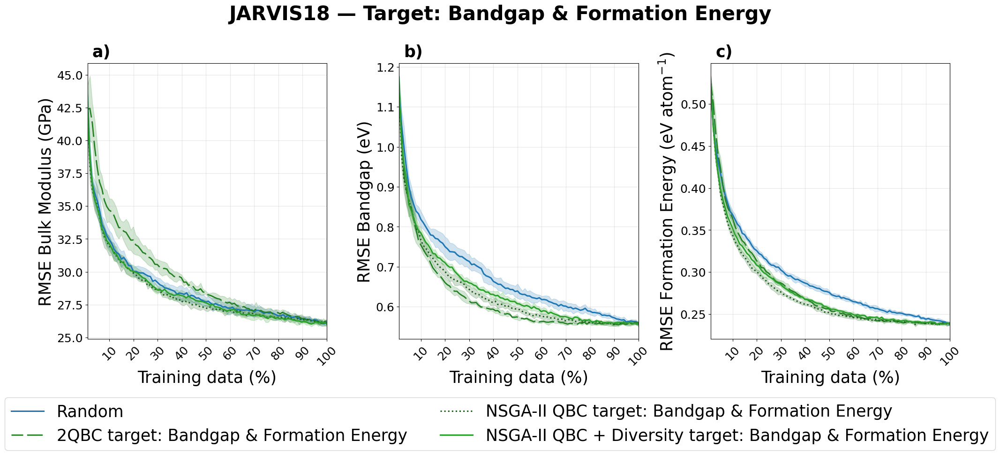

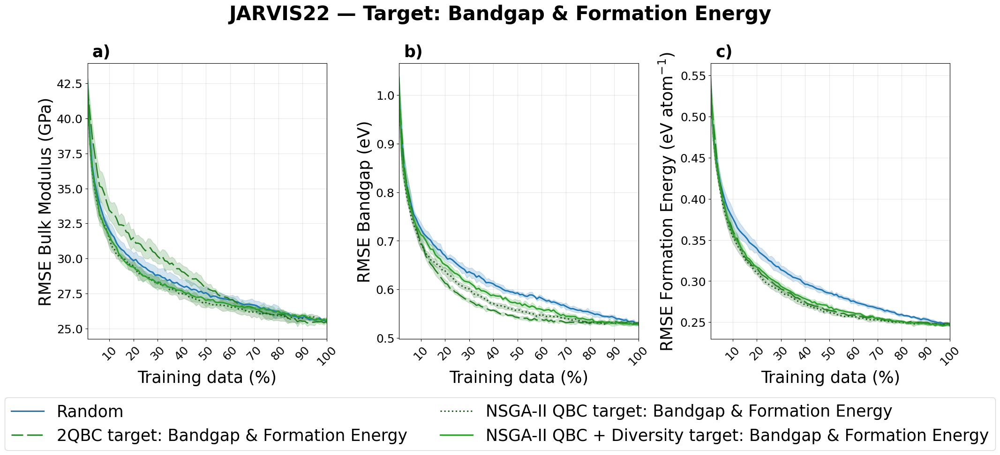

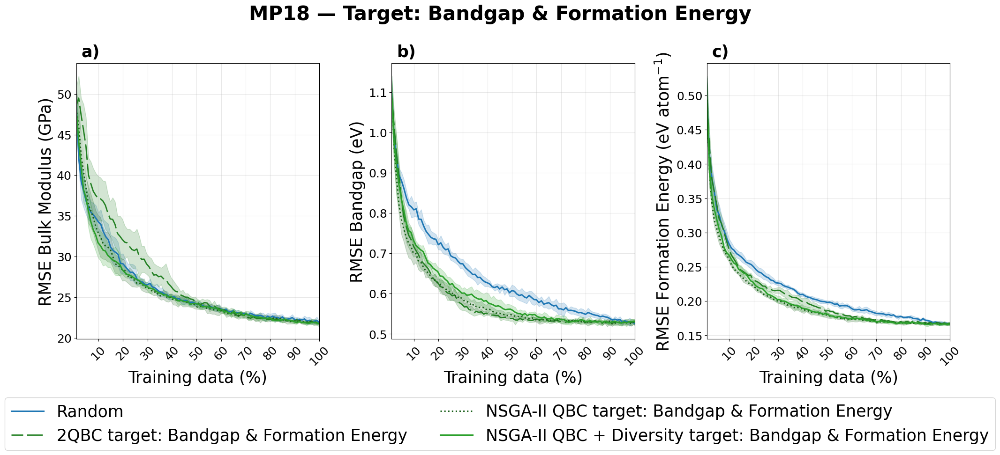

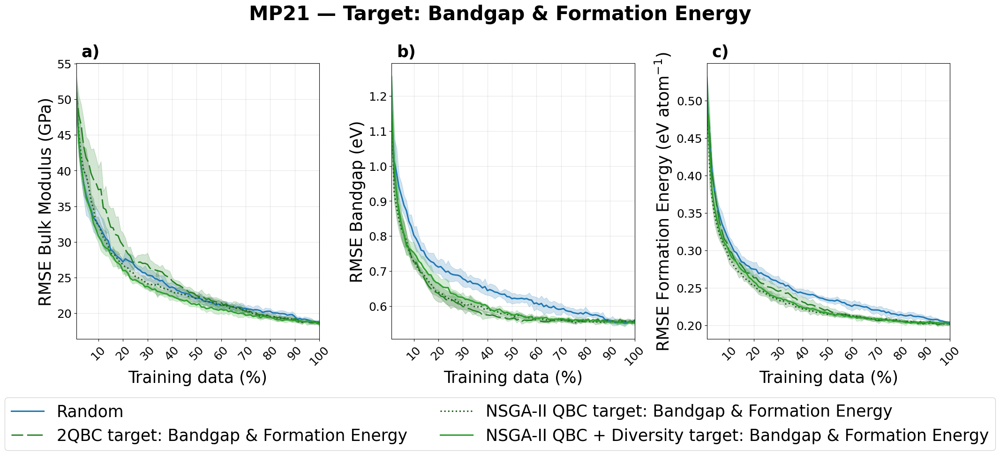

In [12]:
import os
import re
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# -------------------------------------------------
# Output directory
# -------------------------------------------------
output_dir = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT"
os.makedirs(output_dir, exist_ok=True)

# -------------------------------------------------
# Helpers
# -------------------------------------------------
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

def darken(color, factor):
    rgb = np.array(mcolors.to_rgb(color))
    return tuple(np.clip(rgb * factor, 0, 1))

# -------------------------------------------------
# Base colors per family
# -------------------------------------------------
BASE_FAMILY_COLOR = {
    "random": "C0",
    "bandgap_bulk": "C1",
    "bandgap_eform": "C2",
    "eform_bulk": "C3",
}

def policy_family(pol_name: str) -> str:
    if "bg_bm" in pol_name:
        return "bandgap_bulk"
    if "bg_ef" in pol_name:
        return "bandgap_eform"
    if "ef_bm" in pol_name or "eform_bulk" in pol_name:
        return "eform_bulk"
    if "random" in pol_name:
        return "random"
    return pol_name

def policy_color(pol):
    fam = policy_family(pol["name"])
    base = BASE_FAMILY_COLOR.get(fam, "C7")

    if fam == "random":
        return base
    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return base
    if pol.get("is_qbc_not_nsga", False):
        return darken(base, 0.80)
    return darken(base, 0.60)

def nsga_linestyle(pol) -> str:
    if pol["name"] == "random":
        return "-"
    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return "-"
    return ":"

# -------------------------------------------------
# Datasets to plot
# -------------------------------------------------
DATASETS = ["jarvis18", "jarvis22", "mp18", "mp21"]

# -------------------------------------------------
# Seeds
# -------------------------------------------------
seeds = range(5)

# -------------------------------------------------
# Base root
# -------------------------------------------------
ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto"
    r"\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition"
)

# -------------------------------------------------
# X-axis ticks every 10%
# -------------------------------------------------
TICK_PCT = np.arange(10, 101, 10, dtype=float)

# -------------------------------------------------
# Policies
# -------------------------------------------------
policies = [
    {
        "name": "random",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\random\{dataset}\all",
        "filename_tpl": "{dataset}_all_random_rf{seed}.csv",
        "filename_has_seed": True,
        "label": "Random",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "qbc_bg_ef",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_MultiObj2Outcomes\{dataset}\bandgap_eform",
        "filename_tpl": "{dataset}_bandgap_eformMultiObjective_OptDiffModelsOnly2Var_rf.csv",
        "filename_has_seed": False,
        "label": "2QBC target: Bandgap & Formation Energy",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": True,
    },
    {
        "name": "bg_ef_nsga_qbc_only",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsOnlyQBC\{dataset}\bandgap_eform",
        "filename_tpl": "{dataset}_bandgap_eformgrowing_EA_2obj_qbc_only_rf{seed}.csv",
        "filename_has_seed": True,
        "label": "NSGA-II QBC target: Bandgap & Formation Energy",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": True,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "bg_ef_nsga_div",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsDiversity\{dataset}\bandgap_eform",
        "filename_tpl": "{dataset}_bandgap_eformgrowing_EA_2obj_qbc_Diversity_rf{seed}.csv",
        "filename_has_seed": True,
        "label": "NSGA-II QBC + Diversity target: Bandgap & Formation Energy",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    }
]

QBC_LONG_DASH = (3, (12, 3))

# -------------------------------------------------
# Path resolver
# -------------------------------------------------
def candidate_paths(pol, base_dir, seed, fname):
    stem = os.path.splitext(fname)[0]
    flat = os.path.join(base_dir, str(seed), fname)
    nested = os.path.join(base_dir, str(seed), stem, fname)

    if pol.get("try_both_layouts", False):
        if pol.get("inside_subfolder_same_as_stem", False):
            return [nested, flat]
        return [flat, nested]

    return [nested] if pol.get("inside_subfolder_same_as_stem", False) else [flat]

# -------------------------------------------------
# Plot helper for each subplot
# -------------------------------------------------
def plot_metric_on_ax(ax, data, metric, ylabel, panel_title, panel_letter):
    any_plotted = False

    for pol in policies:
        sub = data[data["policy"] == pol["name"]]
        if sub.empty or metric not in sub.columns:
            continue

        grouped = sub.groupby("train_pct")[metric]
        mean = grouped.mean()
        std = grouped.std().fillna(0)

        color = policy_color(pol)

        if pol.get("is_qbc_not_nsga", False):
            linestyle = QBC_LONG_DASH
            linewidth = 2.0
        else:
            linestyle = nsga_linestyle(pol)
            linewidth = 2.2

        x_plot = mean.index.values

        ax.plot(
            x_plot,
            mean.values,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=pol["label"],
        )

        ax.fill_between(
            x_plot,
            mean.values - std.values,
            mean.values + std.values,
            color=color,
            alpha=0.20,
        )

        any_plotted = True

    if not any_plotted:
        ax.set_visible(False)
        return [], []

    ax.set_xticks(TICK_PCT)
    ax.set_xlim(1, 100)
    ax.margins(x=0)
    ax.tick_params(axis="x", labelrotation=45, labelsize=18)
    ax.tick_params(axis="y", labelsize=18)
    ax.set_xlabel("Training data (%)", fontsize=25)
    ax.set_ylabel(ylabel, fontsize=25)
    # ax.set_title(panel_title, fontsize=20, fontweight="bold")
    ax.grid(alpha=0.3)

    ax.text(
        0.02, 1.07, panel_letter,
        transform=ax.transAxes,
        fontsize=25,
        fontweight="bold",
        va="top",
        ha="left"
    )

    handles, labels = ax.get_legend_handles_labels()
    return handles, labels

# -------------------------------------------------
# Combined figure per dataset
# -------------------------------------------------
def plot_all_metrics_one_figure(data, dataset):
    fig, axes = plt.subplots(1, 3, figsize=(20, 10))

    fig.suptitle(
        f"{dataset.upper()} — Target: Bandgap & Formation Energy",
        fontsize=30,
        fontweight="bold",
        y=0.95
    )

    all_handles = []
    all_labels = []

    metric_specs = [
        ("rmse_bulk_modulus", "RMSE Bulk Modulus (GPa)", "Bulk Modulus", "a)"),
        ("rmse_bandgap", "RMSE Bandgap (eV)", "Bandgap", "b)"),
        ("rmse_eform_unified", r"RMSE Formation Energy (eV atom$^{-1}$)", "Formation Energy", "c)"),
    ]

    for ax, (metric, ylabel, panel_title, panel_letter) in zip(axes, metric_specs):
        handles, labels = plot_metric_on_ax(ax, data, metric, ylabel, panel_title, panel_letter)
        for h, l in zip(handles, labels):
            if l not in all_labels:
                all_handles.append(h)
                all_labels.append(l)

    if all_handles:
        fig.legend(
            all_handles,
            all_labels,
            loc="lower center",
            bbox_to_anchor=(0.5, -0.02),
            ncol=2,
            fontsize=25,
            frameon=True
        )

    plt.tight_layout(rect=[0, 0.12, 1, 0.95])

    filename = f"{sanitize_filename(dataset.upper() + '_RMSE_All_Metrics_bandgap_eform')}.png"
    save_path = os.path.join(output_dir, filename)
    plt.savefig(save_path, dpi=100, bbox_inches="tight", pad_inches=0.03)
    plt.show()
    plt.close()

# -------------------------------------------------
# Main loop
# -------------------------------------------------
for dataset in DATASETS:
    all_data = []
    missing = []

    for pol in policies:
        base_dir = pol["base_dir_tpl"].format(dataset=dataset)

        for seed in seeds:
            if pol["filename_has_seed"]:
                fname = pol["filename_tpl"].format(dataset=dataset, seed=seed)
            else:
                fname = pol["filename_tpl"].format(dataset=dataset)

            found_path = None
            for path in candidate_paths(pol, base_dir, seed, fname):
                if os.path.exists(path):
                    found_path = path
                    break

            if found_path is None:
                missing.append((dataset, pol["name"], seed, candidate_paths(pol, base_dir, seed, fname)[0]))
                continue

            df = pd.read_csv(found_path)
            if "train_ratio" not in df.columns:
                raise ValueError(f"'train_ratio' not found in: {found_path}")

            df["seed"] = seed
            df["policy"] = pol["name"]
            df["train_pct"] = df["train_ratio"] * 100.0
            all_data.append(df)

    if not all_data:
        print(f"\n[WARNING] No data loaded for dataset={dataset}. Check your paths.\n")
        if missing:
            print("First few missing paths:")
            for ds, polname, seed, path in missing[:10]:
                print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")
        continue

    data = pd.concat(all_data, ignore_index=True)

    if missing:
        print(f"\n[WARNING] Some files were not found for dataset={dataset}:")
        for ds, polname, seed, path in missing[:20]:
            print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")
        if len(missing) > 20:
            print(f"  ... and {len(missing) - 20} more missing files.\n")

    # unify formation energy RMSE
    data["rmse_eform_unified"] = np.nan
    if "rmse_eform" in data.columns:
        m = data["rmse_eform"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_eform"]
    if "rmse_e_form" in data.columns:
        m = data["rmse_eform_unified"].isna() & data["rmse_e_form"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_e_form"]

    plot_all_metrics_one_figure(data, dataset)

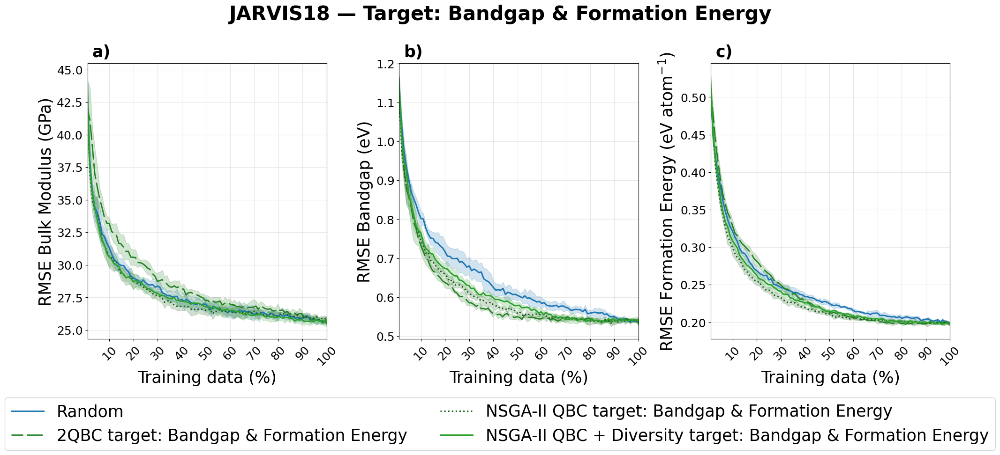

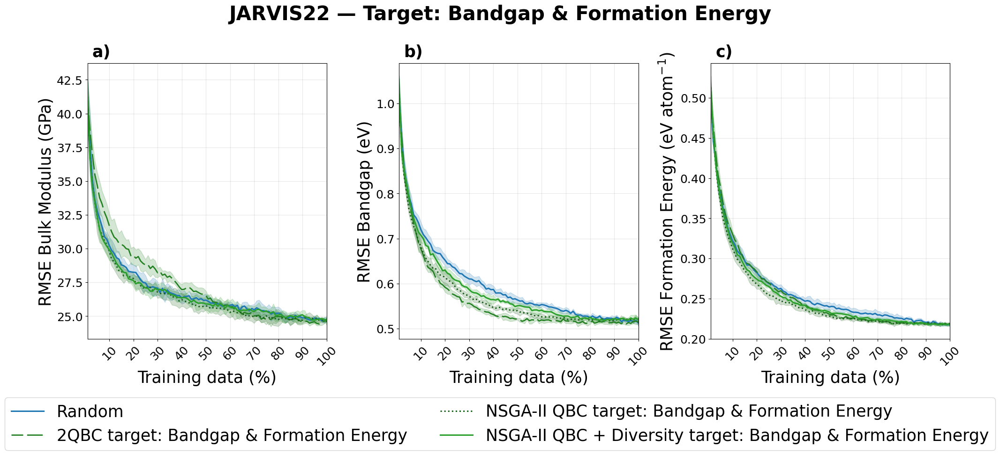

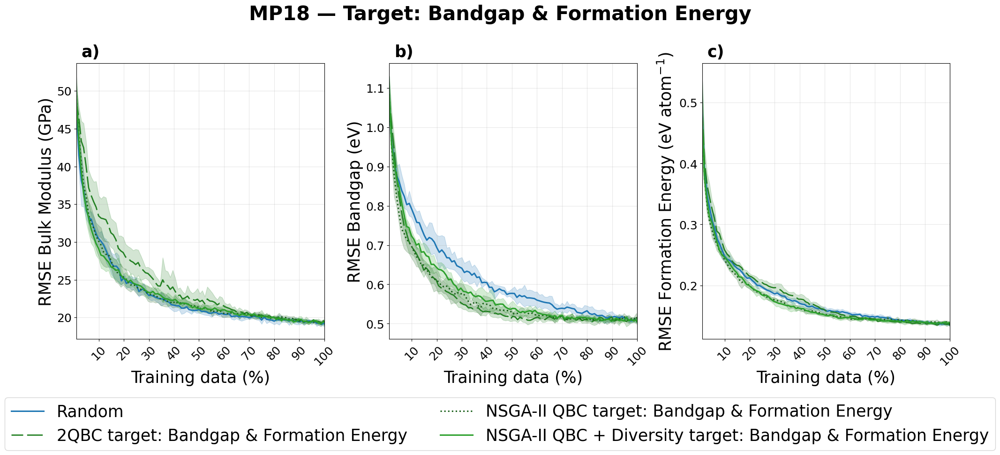

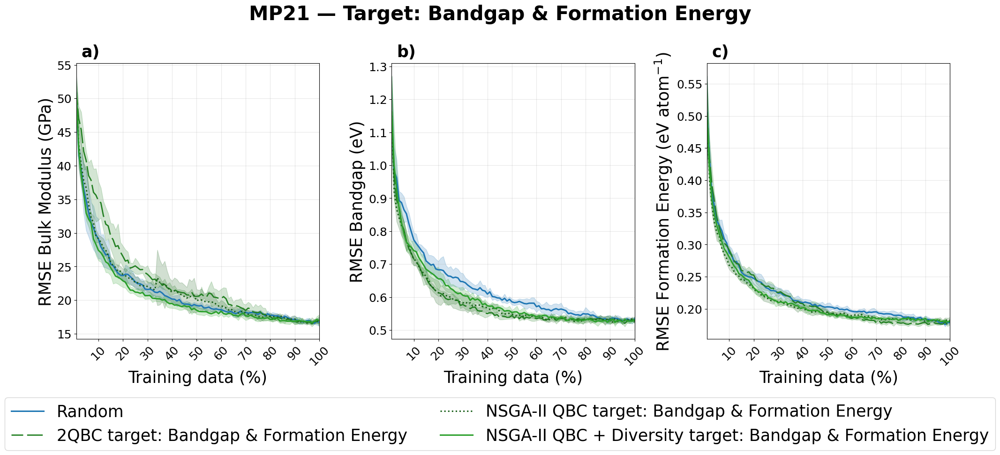

Done. Saved XGBoost plots to:
C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT_XGBOOST


In [13]:
import os
import re
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# -------------------------------------------------
# Output directory
# -------------------------------------------------
output_dir = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT_XGBOOST"
os.makedirs(output_dir, exist_ok=True)

# -------------------------------------------------
# Helpers
# -------------------------------------------------
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

def darken(color, factor):
    rgb = np.array(mcolors.to_rgb(color))
    return tuple(np.clip(rgb * factor, 0, 1))

# -------------------------------------------------
# Base colors per family
# -------------------------------------------------
BASE_FAMILY_COLOR = {
    "random": "C0",
    "bandgap_bulk": "C1",
    "bandgap_eform": "C2",
    "eform_bulk": "C3",
}

def policy_family(pol_name: str) -> str:
    if "bg_bm" in pol_name:
        return "bandgap_bulk"
    if "bg_ef" in pol_name:
        return "bandgap_eform"
    if "ef_bm" in pol_name or "eform_bulk" in pol_name:
        return "eform_bulk"
    if "random" in pol_name:
        return "random"
    return pol_name

def policy_color(pol):
    fam = policy_family(pol["name"])
    base = BASE_FAMILY_COLOR.get(fam, "C7")

    if fam == "random":
        return base

    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return base

    if pol.get("is_qbc_not_nsga", False):
        return darken(base, 0.80)

    return darken(base, 0.60)

def nsga_linestyle(pol) -> str:
    if pol["name"] == "random":
        return "-"
    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return "-"
    return ":"

# -------------------------------------------------
# Datasets and seeds
# -------------------------------------------------
DATASETS = ["jarvis18", "jarvis22", "mp18", "mp21"]
seeds = range(5)

# -------------------------------------------------
# Base root
# -------------------------------------------------
ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto"
    r"\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition"
)

# -------------------------------------------------
# X-axis ticks every 10%
# -------------------------------------------------
TICK_PCT = np.arange(10, 101, 10, dtype=float)

# -------------------------------------------------
# Policies - XGBoost version
# -------------------------------------------------
policies = [
    {
        "name": "random",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\random\{dataset}\all",
        "filename_tpl": "{dataset}_all_random_xgb{seed}.CSV",
        "filename_has_seed": True,
        "label": "Random",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "qbc_bg_ef",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_MultiObj2Outcomes\{dataset}\bandgap_eform",
        "filename_tpl": "{dataset}_bandgap_eformMultiObjective_OptDiffModelsOnly2Var_xgb.CSV",
        "filename_has_seed": False,
        "label": "2QBC target: Bandgap & Formation Energy",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": True,
    },
    {
        "name": "bg_ef_nsga_qbc_only",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsOnlyQBC\{dataset}\bandgap_eform",
        "filename_tpl": "{dataset}_bandgap_eformgrowing_EA_2obj_qbc_only_xgb{seed}.CSV",
        "filename_has_seed": True,
        "label": "NSGA-II QBC target: Bandgap & Formation Energy",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": True,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "bg_ef_nsga_div",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsDiversity\{dataset}\bandgap_eform",
        "filename_tpl": "{dataset}_bandgap_eformgrowing_EA_2obj_qbc_Diversity_xgb{seed}.CSV",
        "filename_has_seed": True,
        "label": "NSGA-II QBC + Diversity target: Bandgap & Formation Energy",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    }
]

QBC_LONG_DASH = (3, (12, 3))

# -------------------------------------------------
# Path resolver
# -------------------------------------------------
def candidate_paths(pol, base_dir, seed, fname):
    stem = os.path.splitext(fname)[0]

    flat = os.path.join(base_dir, str(seed), fname)
    nested = os.path.join(base_dir, str(seed), stem, fname)

    if pol.get("try_both_layouts", False):
        if pol.get("inside_subfolder_same_as_stem", False):
            return [nested, flat]
        return [flat, nested]

    return [nested] if pol.get("inside_subfolder_same_as_stem", False) else [flat]

# -------------------------------------------------
# Plot helper for each subplot
# -------------------------------------------------
def plot_metric_on_ax(ax, data, metric, ylabel, panel_title, panel_letter):
    any_plotted = False

    for pol in policies:
        sub = data[data["policy"] == pol["name"]]

        if sub.empty or metric not in sub.columns:
            continue

        grouped = sub.groupby("train_pct")[metric]
        mean = grouped.mean()
        std = grouped.std().fillna(0)

        color = policy_color(pol)

        if pol.get("is_qbc_not_nsga", False):
            linestyle = QBC_LONG_DASH
            linewidth = 2.0
        else:
            linestyle = nsga_linestyle(pol)
            linewidth = 2.2

        x_plot = mean.index.values

        ax.plot(
            x_plot,
            mean.values,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=pol["label"],
        )

        ax.fill_between(
            x_plot,
            mean.values - std.values,
            mean.values + std.values,
            color=color,
            alpha=0.20,
        )

        any_plotted = True

    if not any_plotted:
        ax.set_visible(False)
        return [], []

    ax.set_xticks(TICK_PCT)
    ax.set_xlim(1, 100)
    ax.margins(x=0)

    ax.tick_params(axis="x", labelrotation=45, labelsize=18)
    ax.tick_params(axis="y", labelsize=18)

    ax.set_xlabel("Training data (%)", fontsize=25)
    ax.set_ylabel(ylabel, fontsize=25)

    ax.grid(alpha=0.3)

    ax.text(
        0.02,
        1.07,
        panel_letter,
        transform=ax.transAxes,
        fontsize=25,
        fontweight="bold",
        va="top",
        ha="left",
    )

    handles, labels = ax.get_legend_handles_labels()
    return handles, labels

# -------------------------------------------------
# Combined figure per dataset
# -------------------------------------------------
def plot_all_metrics_one_figure(data, dataset):
    fig, axes = plt.subplots(1, 3, figsize=(20, 10))

    fig.suptitle(
        f"{dataset.upper()} — Target: Bandgap & Formation Energy",
        fontsize=30,
        fontweight="bold",
        y=0.95,
    )

    all_handles = []
    all_labels = []

    metric_specs = [
        ("rmse_bulk_modulus", "RMSE Bulk Modulus (GPa)", "Bulk Modulus", "a)"),
        ("rmse_bandgap", "RMSE Bandgap (eV)", "Bandgap", "b)"),
        ("rmse_eform_unified", r"RMSE Formation Energy (eV atom$^{-1}$)", "Formation Energy", "c)"),
    ]

    for ax, (metric, ylabel, panel_title, panel_letter) in zip(axes, metric_specs):
        handles, labels = plot_metric_on_ax(
            ax,
            data,
            metric,
            ylabel,
            panel_title,
            panel_letter
        )

        for h, l in zip(handles, labels):
            if l not in all_labels:
                all_handles.append(h)
                all_labels.append(l)

    if all_handles:
        fig.legend(
            all_handles,
            all_labels,
            loc="lower center",
            bbox_to_anchor=(0.5, -0.02),
            ncol=2,
            fontsize=25,
            frameon=True,
        )

    plt.tight_layout(rect=[0, 0.12, 1, 0.95])

    filename = f"{sanitize_filename(dataset.upper() + '_RMSE_All_Metrics_bandgap_eform_XGBOOST')}.png"
    save_path = os.path.join(output_dir, filename)

    plt.savefig(save_path, dpi=100, bbox_inches="tight", pad_inches=0.03)
    plt.show()
    plt.close()

# -------------------------------------------------
# Main loop
# -------------------------------------------------
for dataset in DATASETS:
    all_data = []
    missing = []

    for pol in policies:
        base_dir = pol["base_dir_tpl"].format(dataset=dataset)

        for seed in seeds:
            if pol["filename_has_seed"]:
                fname = pol["filename_tpl"].format(dataset=dataset, seed=seed)
            else:
                fname = pol["filename_tpl"].format(dataset=dataset)

            found_path = None

            for path in candidate_paths(pol, base_dir, seed, fname):
                if os.path.exists(path):
                    found_path = path
                    break

            if found_path is None:
                missing.append(
                    (
                        dataset,
                        pol["name"],
                        seed,
                        candidate_paths(pol, base_dir, seed, fname)[0],
                    )
                )
                continue

            df = pd.read_csv(found_path)

            if "train_ratio" not in df.columns:
                raise ValueError(f"'train_ratio' not found in: {found_path}")

            df["seed"] = seed
            df["policy"] = pol["name"]
            df["train_pct"] = df["train_ratio"] * 100.0

            all_data.append(df)

    if not all_data:
        print(f"\n[WARNING] No data loaded for dataset={dataset}. Check your paths.\n")

        if missing:
            print("First few missing paths:")
            for ds, polname, seed, path in missing[:10]:
                print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")

        continue

    data = pd.concat(all_data, ignore_index=True)

    if missing:
        print(f"\n[WARNING] Some files were not found for dataset={dataset}:")
        for ds, polname, seed, path in missing[:20]:
            print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")

        if len(missing) > 20:
            print(f"  ... and {len(missing) - 20} more missing files.\n")

    # -------------------------------------------------
    # Unify formation energy RMSE column
    # Some files use rmse_eform, others use rmse_e_form
    # -------------------------------------------------
    data["rmse_eform_unified"] = np.nan

    if "rmse_eform" in data.columns:
        m = data["rmse_eform"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_eform"]

    if "rmse_e_form" in data.columns:
        m = data["rmse_eform_unified"].isna() & data["rmse_e_form"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_e_form"]

    plot_all_metrics_one_figure(data, dataset)

print(f"Done. Saved XGBoost plots to:\n{output_dir}")

# Two outcomes -Formation Energy Bulk Modulus


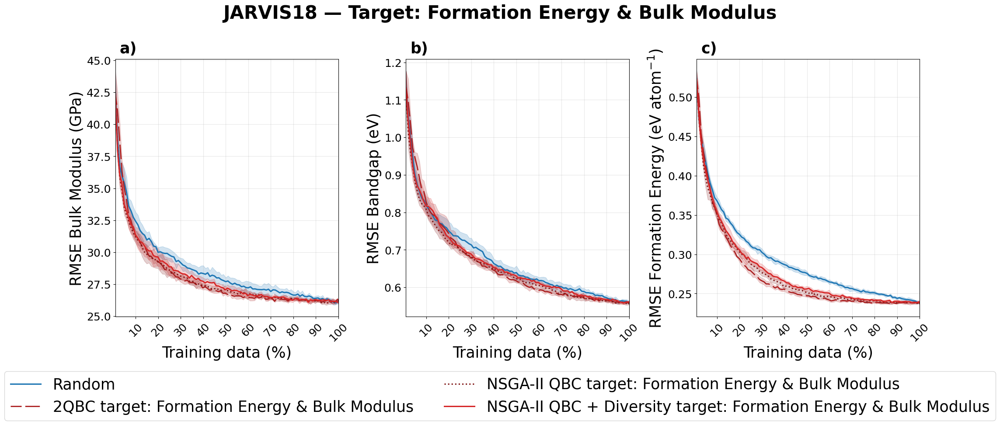

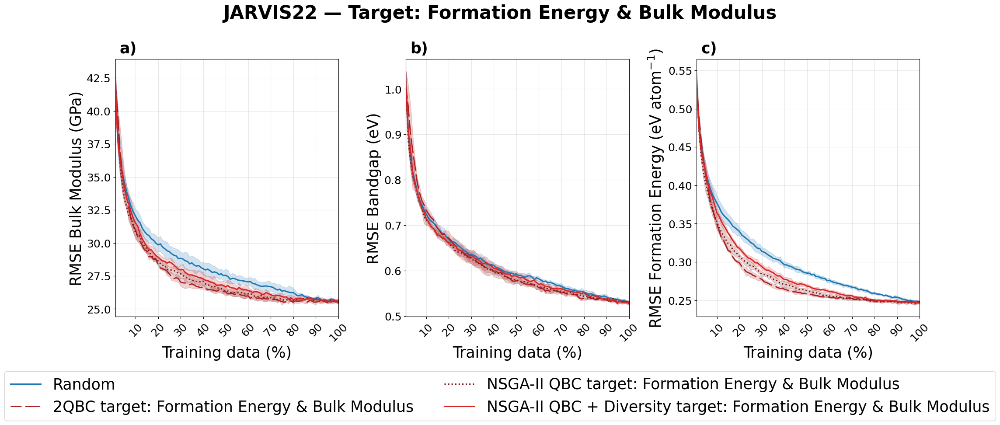

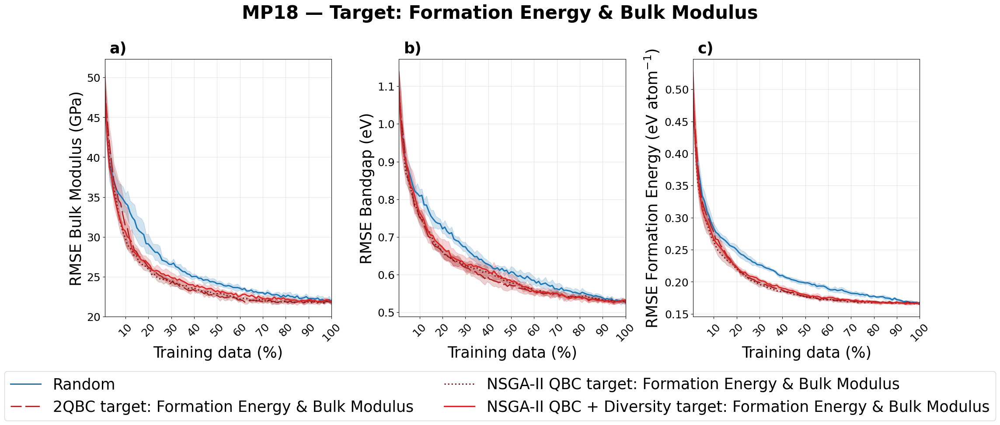

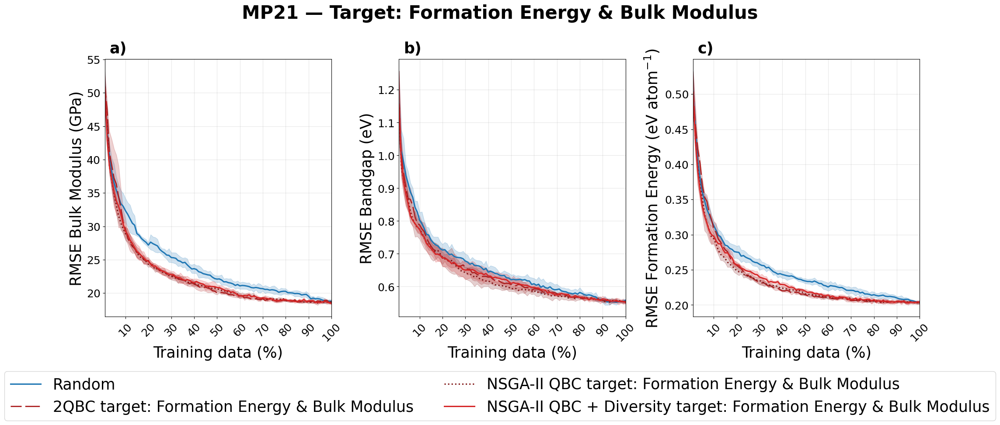

In [14]:
import os
import re
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# -------------------------------------------------
# Output directory
# -------------------------------------------------
output_dir = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT"
os.makedirs(output_dir, exist_ok=True)

# -------------------------------------------------
# Helpers
# -------------------------------------------------
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

def darken(color, factor):
    rgb = np.array(mcolors.to_rgb(color))
    return tuple(np.clip(rgb * factor, 0, 1))

# -------------------------------------------------
# Base colors per family
# -------------------------------------------------
BASE_FAMILY_COLOR = {
    "random": "C0",
    "bandgap_bulk": "C1",
    "bandgap_eform": "C2",
    "eform_bulk": "C3",
}

def policy_family(pol_name: str) -> str:
    if "bg_bm" in pol_name:
        return "bandgap_bulk"
    if "bg_ef" in pol_name:
        return "bandgap_eform"
    if "ef_bm" in pol_name or "eform_bulk" in pol_name:
        return "eform_bulk"
    if "random" in pol_name:
        return "random"
    return pol_name

def policy_color(pol):
    fam = policy_family(pol["name"])
    base = BASE_FAMILY_COLOR.get(fam, "C7")

    if fam == "random":
        return base
    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return base
    if pol.get("is_qbc_not_nsga", False):
        return darken(base, 0.80)
    return darken(base, 0.60)

def nsga_linestyle(pol) -> str:
    if pol["name"] == "random":
        return "-"
    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return "-"
    return ":"

# -------------------------------------------------
# Datasets to plot
# -------------------------------------------------
DATASETS = ["jarvis18", "jarvis22", "mp18", "mp21"]

# -------------------------------------------------
# Seeds
# -------------------------------------------------
seeds = range(5)

# -------------------------------------------------
# Base root
# -------------------------------------------------
ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto"
    r"\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition"
)

# -------------------------------------------------
# X-axis ticks every 10%
# -------------------------------------------------
TICK_PCT = np.arange(10, 101, 10, dtype=float)

# -------------------------------------------------
# Policies
# -------------------------------------------------
policies = [
    {
        "name": "random",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\random\{dataset}\all",
        "filename_tpl": "{dataset}_all_random_rf{seed}.csv",
        "filename_has_seed": True,
        "label": "Random",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "qbc_ef_bm",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_MultiObj2Outcomes\{dataset}\eform_bulk_modulus",
        "filename_tpl": "{dataset}_eform_bulk_modulusMultiObjective_OptDiffModelsOnly2Var_rf.csv",
        "filename_has_seed": False,
        "label": "2QBC target: Formation Energy & Bulk Modulus",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": True,
    },
    {
        "name": "ef_bm_nsga_qbc_only",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsOnlyQBC\{dataset}\eform_bulk_modulus",
        "filename_tpl": "{dataset}_eform_bulk_modulusgrowing_EA_2obj_qbc_only_rf{seed}.csv",
        "filename_has_seed": True,
        "label": "NSGA-II QBC target: Formation Energy & Bulk Modulus",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "ef_bm_nsga_div",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsDiversity\{dataset}\eform_bulk_modulus",
        "filename_tpl": "{dataset}_eform_bulk_modulusgrowing_EA_2obj_qbc_Diversity_rf{seed}.csv",
        "filename_has_seed": True,
        "label": "NSGA-II QBC + Diversity target: Formation Energy & Bulk Modulus",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
]

QBC_LONG_DASH = (3, (12, 3))

# -------------------------------------------------
# Path resolver
# -------------------------------------------------
def candidate_paths(pol, base_dir, seed, fname):
    stem = os.path.splitext(fname)[0]
    flat = os.path.join(base_dir, str(seed), fname)
    nested = os.path.join(base_dir, str(seed), stem, fname)

    if pol.get("try_both_layouts", False):
        if pol.get("inside_subfolder_same_as_stem", False):
            return [nested, flat]
        return [flat, nested]

    return [nested] if pol.get("inside_subfolder_same_as_stem", False) else [flat]

# -------------------------------------------------
# Plot helper for each subplot
# -------------------------------------------------
def plot_metric_on_ax(ax, data, metric, ylabel, panel_title, panel_letter):
    any_plotted = False

    for pol in policies:
        sub = data[data["policy"] == pol["name"]]
        if sub.empty or metric not in sub.columns:
            continue

        grouped = sub.groupby("train_pct")[metric]
        mean = grouped.mean()
        std = grouped.std().fillna(0)

        color = policy_color(pol)

        if pol.get("is_qbc_not_nsga", False):
            linestyle = QBC_LONG_DASH
            linewidth = 2.0
        else:
            linestyle = nsga_linestyle(pol)
            linewidth = 2.2

        x_plot = mean.index.values

        ax.plot(
            x_plot,
            mean.values,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=pol["label"],
        )

        ax.fill_between(
            x_plot,
            mean.values - std.values,
            mean.values + std.values,
            color=color,
            alpha=0.20,
        )

        any_plotted = True

    if not any_plotted:
        ax.set_visible(False)
        return [], []

    ax.set_xticks(TICK_PCT)
    ax.set_xlim(1, 100)
    ax.margins(x=0)
    ax.tick_params(axis="x", labelrotation=45, labelsize=18)
    ax.tick_params(axis="y", labelsize=18)
    ax.set_xlabel("Training data (%)", fontsize=25)
    ax.set_ylabel(ylabel, fontsize=25)
    ax.grid(alpha=0.3)

    ax.text(
        0.02, 1.07, panel_letter,
        transform=ax.transAxes,
        fontsize=25,
        fontweight="bold",
        va="top",
        ha="left"
    )

    handles, labels = ax.get_legend_handles_labels()
    return handles, labels

# -------------------------------------------------
# Combined figure per dataset
# -------------------------------------------------
def plot_all_metrics_one_figure(data, dataset):
    fig, axes = plt.subplots(1, 3, figsize=(20, 10))

    fig.suptitle(
        f"{dataset.upper()} — Target: Formation Energy & Bulk Modulus",
        fontsize=30,
        fontweight="bold",
        y=0.95
    )

    all_handles = []
    all_labels = []

    metric_specs = [
        ("rmse_bulk_modulus", "RMSE Bulk Modulus (GPa)", "Bulk Modulus", "a)"),
        ("rmse_bandgap", "RMSE Bandgap (eV)", "Bandgap", "b)"),
        ("rmse_eform_unified", r"RMSE Formation Energy (eV atom$^{-1}$)", "Formation Energy", "c)"),
    ]

    for ax, (metric, ylabel, panel_title, panel_letter) in zip(axes, metric_specs):
        handles, labels = plot_metric_on_ax(ax, data, metric, ylabel, panel_title, panel_letter)
        for h, l in zip(handles, labels):
            if l not in all_labels:
                all_handles.append(h)
                all_labels.append(l)

    if all_handles:
        fig.legend(
            all_handles,
            all_labels,
            loc="lower center",
            bbox_to_anchor=(0.5, -0.02),
            ncol=2,
            fontsize=25,
            frameon=True
        )

    plt.tight_layout(rect=[0, 0.12, 1, 0.95])
    filename = f"{sanitize_filename(dataset.upper() + '_RMSE_All_Metrics_eform_bulkmodulus')}.jpeg"
    save_path = os.path.join(output_dir, filename)

    plt.savefig(
        save_path,
        dpi=300,
        bbox_inches="tight",
        pad_inches=0.03,
        format="jpeg",
        pil_kwargs={
            "quality": 20,       # lower = smaller file; 85 is usually a good balance
            "optimize": True,
            "progressive": True
        }
    )
    plt.show()
    plt.close()

# -------------------------------------------------
# Main loop
# -------------------------------------------------
for dataset in DATASETS:
    all_data = []
    missing = []

    for pol in policies:
        base_dir = pol["base_dir_tpl"].format(dataset=dataset)

        for seed in seeds:
            if pol["filename_has_seed"]:
                fname = pol["filename_tpl"].format(dataset=dataset, seed=seed)
            else:
                fname = pol["filename_tpl"].format(dataset=dataset)

            found_path = None
            for path in candidate_paths(pol, base_dir, seed, fname):
                if os.path.exists(path):
                    found_path = path
                    break

            if found_path is None:
                missing.append((dataset, pol["name"], seed, candidate_paths(pol, base_dir, seed, fname)[0]))
                continue

            df = pd.read_csv(found_path)
            if "train_ratio" not in df.columns:
                raise ValueError(f"'train_ratio' not found in: {found_path}")

            df["seed"] = seed
            df["policy"] = pol["name"]
            df["train_pct"] = df["train_ratio"] * 100.0
            all_data.append(df)

    if not all_data:
        print(f"\n[WARNING] No data loaded for dataset={dataset}. Check your paths.\n")
        if missing:
            print("First few missing paths:")
            for ds, polname, seed, path in missing[:10]:
                print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")
        continue

    data = pd.concat(all_data, ignore_index=True)

    if missing:
        print(f"\n[WARNING] Some files were not found for dataset={dataset}:")
        for ds, polname, seed, path in missing[:20]:
            print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")
        if len(missing) > 20:
            print(f"  ... and {len(missing) - 20} more missing files.\n")

    # unify formation energy RMSE
    data["rmse_eform_unified"] = np.nan
    if "rmse_eform" in data.columns:
        m = data["rmse_eform"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_eform"]
    if "rmse_e_form" in data.columns:
        m = data["rmse_eform_unified"].isna() & data["rmse_e_form"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_e_form"]

    plot_all_metrics_one_figure(data, dataset)

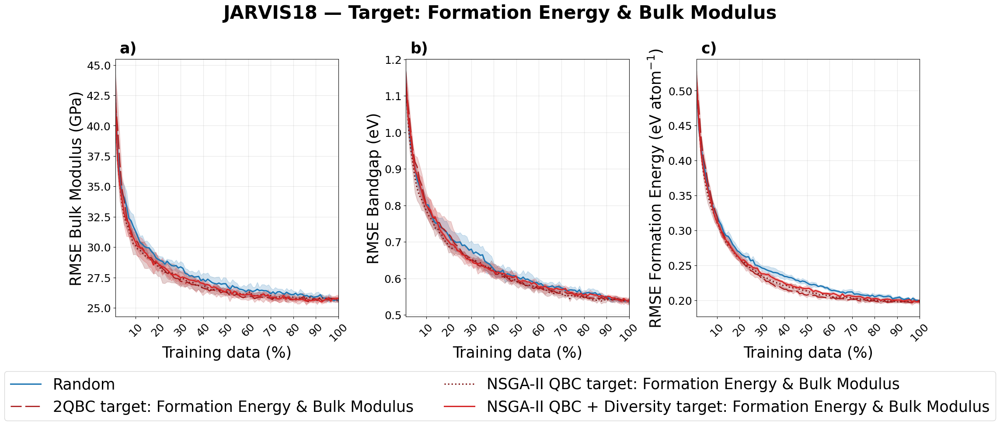

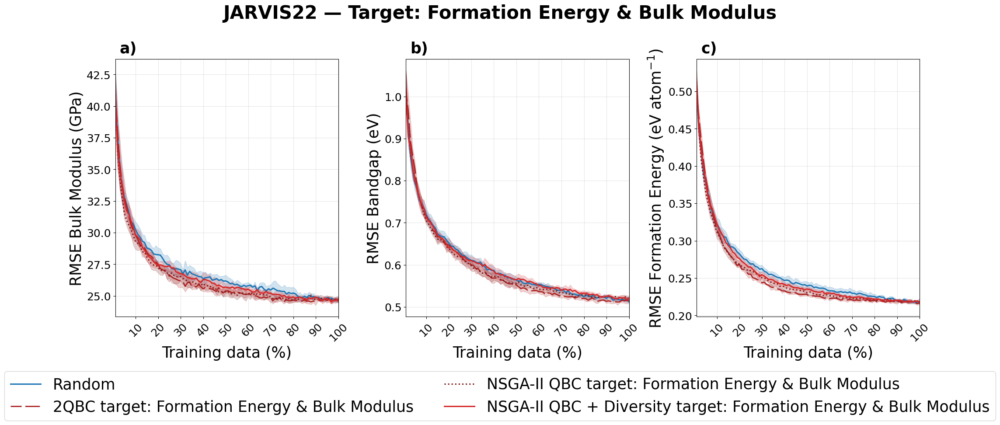

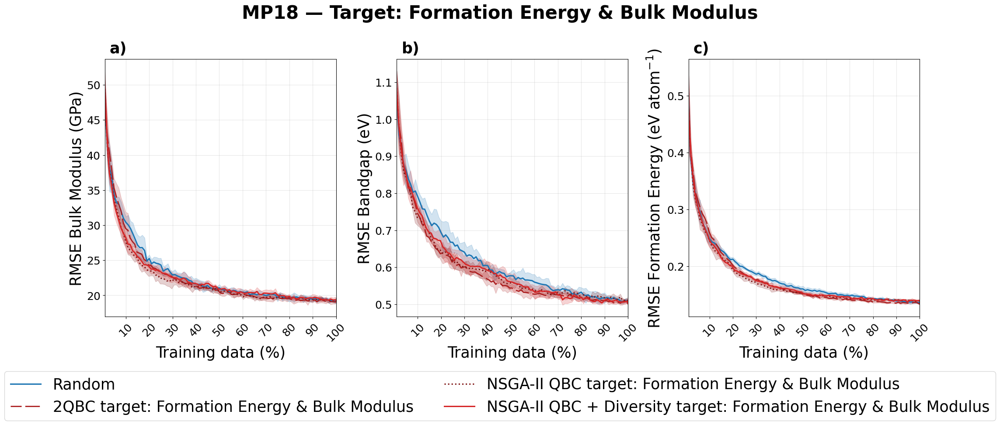

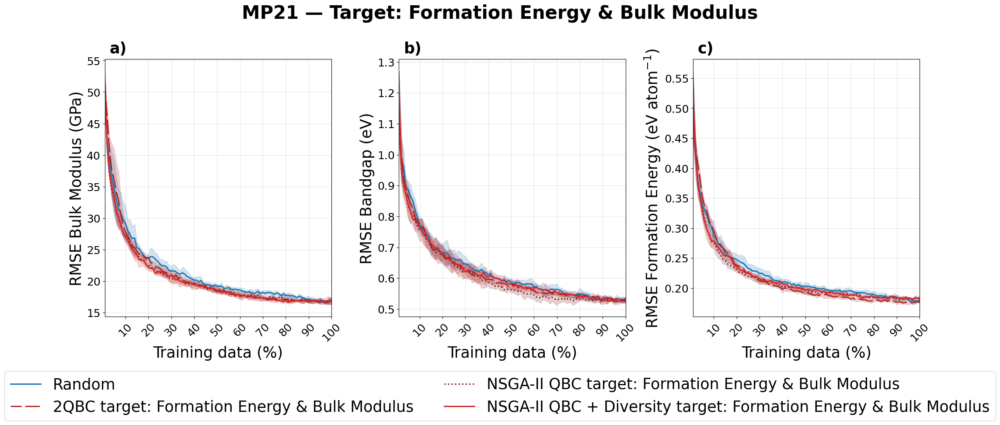

Done. Saved XGBoost plots to:
C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT_XGBOOST


In [15]:
#--------------------------------------------------------------------XGBOOST-----------------------------


import os
import re
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# -------------------------------------------------
# Output directory
# -------------------------------------------------
output_dir = r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\Plots_DFT_XGBOOST"
os.makedirs(output_dir, exist_ok=True)

# -------------------------------------------------
# Helpers
# -------------------------------------------------
def sanitize_filename(s):
    s = unicodedata.normalize("NFKD", s)
    s = s.encode("ascii", "ignore").decode("ascii")
    s = s.replace(" ", "_")
    s = re.sub(r"[^A-Za-z0-9_\-]", "", s)
    s = re.sub(r"_+", "_", s)
    return s.strip("_")

def darken(color, factor):
    rgb = np.array(mcolors.to_rgb(color))
    return tuple(np.clip(rgb * factor, 0, 1))

# -------------------------------------------------
# Base colors per family
# -------------------------------------------------
BASE_FAMILY_COLOR = {
    "random": "C0",
    "bandgap_bulk": "C1",
    "bandgap_eform": "C2",
    "eform_bulk": "C3",
}

def policy_family(pol_name: str) -> str:
    if "bg_bm" in pol_name:
        return "bandgap_bulk"
    if "bg_ef" in pol_name:
        return "bandgap_eform"
    if "ef_bm" in pol_name or "eform_bulk" in pol_name:
        return "eform_bulk"
    if "random" in pol_name:
        return "random"
    return pol_name

def policy_color(pol):
    fam = policy_family(pol["name"])
    base = BASE_FAMILY_COLOR.get(fam, "C7")

    if fam == "random":
        return base

    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return base

    if pol.get("is_qbc_not_nsga", False):
        return darken(base, 0.80)

    return darken(base, 0.60)

def nsga_linestyle(pol) -> str:
    if pol["name"] == "random":
        return "-"
    if "diversity" in pol["label"].lower() or "div" in pol["name"].lower():
        return "-"
    return ":"

# -------------------------------------------------
# Datasets and seeds
# -------------------------------------------------
DATASETS = ["jarvis18", "jarvis22", "mp18", "mp21"]
seeds = range(5)

# -------------------------------------------------
# Base root
# -------------------------------------------------
ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto"
    r"\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition"
)

# -------------------------------------------------
# X-axis ticks every 10%
# -------------------------------------------------
TICK_PCT = np.arange(10, 101, 10, dtype=float)

# -------------------------------------------------
# Policies - XGBoost version
# -------------------------------------------------
policies = [
    {
        "name": "random",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\random\{dataset}\all",
        "filename_tpl": "{dataset}_all_random_xgb{seed}.CSV",
        "filename_has_seed": True,
        "label": "Random",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "qbc_ef_bm",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_MultiObj2Outcomes\{dataset}\eform_bulk_modulus",
        "filename_tpl": "{dataset}_eform_bulk_modulusMultiObjective_OptDiffModelsOnly2Var_xgb.CSV",
        "filename_has_seed": False,
        "label": "2QBC target: Formation Energy & Bulk Modulus",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": True,
    },
    {
        "name": "ef_bm_nsga_qbc_only",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsOnlyQBC\{dataset}\eform_bulk_modulus",
        "filename_tpl": "{dataset}_eform_bulk_modulusgrowing_EA_2obj_qbc_only_xgb{seed}.CSV",
        "filename_has_seed": True,
        "label": "NSGA-II QBC target: Formation Energy & Bulk Modulus",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
    {
        "name": "ef_bm_nsga_div",
        "base_dir_tpl": ROOT + r"\NewAlg_DFT2\al\grow_2TargetsDiversity\{dataset}\eform_bulk_modulus",
        "filename_tpl": "{dataset}_eform_bulk_modulusgrowing_EA_2obj_qbc_Diversity_xgb{seed}.CSV",
        "filename_has_seed": True,
        "label": "NSGA-II QBC + Diversity target: Formation Energy & Bulk Modulus",
        "try_both_layouts": True,
        "inside_subfolder_same_as_stem": False,
        "is_qbc_not_nsga": False,
    },
]

QBC_LONG_DASH = (3, (12, 3))

# -------------------------------------------------
# Path resolver
# -------------------------------------------------
def candidate_paths(pol, base_dir, seed, fname):
    stem = os.path.splitext(fname)[0]

    flat = os.path.join(base_dir, str(seed), fname)
    nested = os.path.join(base_dir, str(seed), stem, fname)

    if pol.get("try_both_layouts", False):
        if pol.get("inside_subfolder_same_as_stem", False):
            return [nested, flat]
        return [flat, nested]

    return [nested] if pol.get("inside_subfolder_same_as_stem", False) else [flat]

# -------------------------------------------------
# Plot helper for each subplot
# -------------------------------------------------
def plot_metric_on_ax(ax, data, metric, ylabel, panel_title, panel_letter):
    any_plotted = False

    for pol in policies:
        sub = data[data["policy"] == pol["name"]]

        if sub.empty or metric not in sub.columns:
            continue

        grouped = sub.groupby("train_pct")[metric]
        mean = grouped.mean()
        std = grouped.std().fillna(0)

        color = policy_color(pol)

        if pol.get("is_qbc_not_nsga", False):
            linestyle = QBC_LONG_DASH
            linewidth = 2.0
        else:
            linestyle = nsga_linestyle(pol)
            linewidth = 2.2

        x_plot = mean.index.values

        ax.plot(
            x_plot,
            mean.values,
            color=color,
            linestyle=linestyle,
            linewidth=linewidth,
            label=pol["label"],
        )

        ax.fill_between(
            x_plot,
            mean.values - std.values,
            mean.values + std.values,
            color=color,
            alpha=0.20,
        )

        any_plotted = True

    if not any_plotted:
        ax.set_visible(False)
        return [], []

    ax.set_xticks(TICK_PCT)
    ax.set_xlim(1, 100)
    ax.margins(x=0)

    ax.tick_params(axis="x", labelrotation=45, labelsize=18)
    ax.tick_params(axis="y", labelsize=18)

    ax.set_xlabel("Training data (%)", fontsize=25)
    ax.set_ylabel(ylabel, fontsize=25)
    ax.grid(alpha=0.3)

    ax.text(
        0.02,
        1.07,
        panel_letter,
        transform=ax.transAxes,
        fontsize=25,
        fontweight="bold",
        va="top",
        ha="left",
    )

    handles, labels = ax.get_legend_handles_labels()
    return handles, labels

# -------------------------------------------------
# Combined figure per dataset
# -------------------------------------------------
def plot_all_metrics_one_figure(data, dataset):
    fig, axes = plt.subplots(1, 3, figsize=(20, 10))

    fig.suptitle(
        f"{dataset.upper()} — Target: Formation Energy & Bulk Modulus",
        fontsize=30,
        fontweight="bold",
        y=0.95,
    )

    all_handles = []
    all_labels = []

    metric_specs = [
        ("rmse_bulk_modulus", "RMSE Bulk Modulus (GPa)", "Bulk Modulus", "a)"),
        ("rmse_bandgap", "RMSE Bandgap (eV)", "Bandgap", "b)"),
        ("rmse_eform_unified", r"RMSE Formation Energy (eV atom$^{-1}$)", "Formation Energy", "c)"),
    ]

    for ax, (metric, ylabel, panel_title, panel_letter) in zip(axes, metric_specs):
        handles, labels = plot_metric_on_ax(
            ax,
            data,
            metric,
            ylabel,
            panel_title,
            panel_letter,
        )

        for h, l in zip(handles, labels):
            if l not in all_labels:
                all_handles.append(h)
                all_labels.append(l)

    if all_handles:
        fig.legend(
            all_handles,
            all_labels,
            loc="lower center",
            bbox_to_anchor=(0.5, -0.02),
            ncol=2,
            fontsize=25,
            frameon=True,
        )

    plt.tight_layout(rect=[0, 0.12, 1, 0.95])

    filename = f"{sanitize_filename(dataset.upper() + '_RMSE_All_Metrics_eform_bulkmodulus_XGBOOST')}.png"
    save_path = os.path.join(output_dir, filename)

    plt.savefig(save_path, dpi=100, bbox_inches="tight", pad_inches=0.03)
    plt.show()
    plt.close()

# -------------------------------------------------
# Main loop
# -------------------------------------------------
for dataset in DATASETS:
    all_data = []
    missing = []

    for pol in policies:
        base_dir = pol["base_dir_tpl"].format(dataset=dataset)

        for seed in seeds:
            if pol["filename_has_seed"]:
                fname = pol["filename_tpl"].format(dataset=dataset, seed=seed)
            else:
                fname = pol["filename_tpl"].format(dataset=dataset)

            found_path = None

            for path in candidate_paths(pol, base_dir, seed, fname):
                if os.path.exists(path):
                    found_path = path
                    break

            if found_path is None:
                missing.append(
                    (
                        dataset,
                        pol["name"],
                        seed,
                        candidate_paths(pol, base_dir, seed, fname)[0],
                    )
                )
                continue

            df = pd.read_csv(found_path)

            if "train_ratio" not in df.columns:
                raise ValueError(f"'train_ratio' not found in: {found_path}")

            df["seed"] = seed
            df["policy"] = pol["name"]
            df["train_pct"] = df["train_ratio"] * 100.0

            all_data.append(df)

    if not all_data:
        print(f"\n[WARNING] No data loaded for dataset={dataset}. Check your paths.\n")

        if missing:
            print("First few missing paths:")
            for ds, polname, seed, path in missing[:10]:
                print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")

        continue

    data = pd.concat(all_data, ignore_index=True)

    if missing:
        print(f"\n[WARNING] Some files were not found for dataset={dataset}:")
        for ds, polname, seed, path in missing[:20]:
            print(f"  - dataset={ds}, policy={polname}, seed={seed}: {path}")

        if len(missing) > 20:
            print(f"  ... and {len(missing) - 20} more missing files.\n")

    # -------------------------------------------------
    # Unify formation energy RMSE column
    # Some files use rmse_eform, others use rmse_e_form
    # -------------------------------------------------
    data["rmse_eform_unified"] = np.nan

    if "rmse_eform" in data.columns:
        m = data["rmse_eform"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_eform"]

    if "rmse_e_form" in data.columns:
        m = data["rmse_eform_unified"].isna() & data["rmse_e_form"].notna()
        data.loc[m, "rmse_eform_unified"] = data.loc[m, "rmse_e_form"]

    plot_all_metrics_one_figure(data, dataset)

print(f"Done. Saved XGBoost plots to:\n{output_dir}")

# PCA MANIFOLD COVERAGE

## 1 Outcome

In [15]:
#!/usr/bin/env python3
"""
DFT PCA coverage plots (QBC vs QBC_DIVERSITY) — UPDATED

NEW FIX:
- For QBC_DIVERSITY cases, the property folder/name is 'e_form' (NOT 'eform').
- For QBC cases, the property folder/name stays 'eform'.

Pool definition:
- For each (dataset, prop, seed, policy), pool = df_raw.loc[ALL indices in that policy indices file]
- Split pool -> trainval/test (90/10)
- PCA computed on trainval only, using last 273 columns
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# =========================
# HIGHLIGHT CONFIG
# =========================
NEW_COLOR = "purple"
NEW_ALPHA = 0.7
BASELINE_ALREADY_COLLECTED_K = 69


# ============================================================
# OUTPUT
# ============================================================
BASE_OUT_DIR = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273"
)

PCTS = [10, 20, 30, 40, 50, 60, 70, 80, 90, 95]


# ============================================================
# SPLIT CONFIG
# ============================================================
TEST_SIZE = 0.10
SPLIT_RANDOM_STATE = 42
SPLIT_SHUFFLE = True


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0
PCA_N_COMPONENTS_3D = 3
PCA_USE_LAST_N_COLS = 273


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 25
SCATTER_S_SEL = 25
ALL_ALPHA = 0.25
SEL_ALPHA = 0.45
EDGE_COLOR = "black"
EDGE_LW_ALL = 0.45
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True
DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.40


# ============================================================
# JITTER CONFIG
# ============================================================
JITTER_FRAC = 0.01
JITTER_RANDOM_STATE = 0


# ============================================================
# DATASETS + PATHS
# ============================================================
RAW_DATASET_PATHS: Dict[str, str] = {
    "mp21": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv",
    "mp18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp18.csv",
    "jarvis18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis18.csv",
    "jarvis22": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis22.csv",  # as you specified
}

QBC_DIVERSITY_ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\QBC_DIVERSITY"
)

QBC_ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ALL_ORDERED_REVISED4\al\QBC"
)

SEEDS = range(5)

# Canonical property names you want to iterate over (logical targets)
PROPS_CANON = ["bandgap", "bulk_modulus", "eform"]

# Policy-specific folder mapping:
# - QBC uses 'eform'
# - QBC_DIVERSITY uses 'e_form'
def prop_for_policy(prop_canon: str, policy: str) -> str:
    if  prop_canon == "eform":
        return "e_form"
    return prop_canon


# ============================================================
# HELPERS
# ============================================================
def load_raw_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def load_train_indices_flexible(path_no_ext_or_with_ext: str) -> np.ndarray:
    candidates = [path_no_ext_or_with_ext]
    p = Path(path_no_ext_or_with_ext)
    if p.suffix == "":
        candidates += [str(p.with_suffix(".csv")), str(p.with_suffix(".txt"))]

    found = None
    for c in candidates:
        if Path(c).exists():
            found = c
            break

    if found is None:
        raise FileNotFoundError(f"Could not find indices file. Tried: {candidates}")

    found_path = Path(found)
    if found_path.suffix.lower() == ".csv":
        df = pd.read_csv(found)
        if "trainIndices" not in df.columns:
            raise ValueError(f"'trainIndices' not found in CSV: {found}")
        return df["trainIndices"].dropna().astype(int).to_numpy()

    # txt
    lines = found_path.read_text().strip().splitlines()
    vals = []
    for ln in lines:
        s = ln.strip()
        if not s:
            continue
        vals.append(int(s))
    return np.asarray(vals, dtype=int)


def make_pool_df_from_indices(df_raw: pd.DataFrame, indices: np.ndarray) -> pd.DataFrame:
    idx = pd.Index(indices.astype(int), dtype=int)
    n_raw = len(df_raw)
    bad = idx[(idx < 0) | (idx >= n_raw)]
    if len(bad) > 0:
        raise ValueError(f"Indices contain out-of-range rows (n_raw={n_raw}). Example bad indices: {bad[:20].tolist()}")

    df_pool = df_raw.loc[idx].copy()
    df_pool = df_pool.reset_index(drop=True)
    return df_pool


def split_trainval_test(df_pool: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    df_trainval, df_test = train_test_split(
        df_pool,
        test_size=TEST_SIZE,
        random_state=SPLIT_RANDOM_STATE,
        shuffle=SPLIT_SHUFFLE,
    )
    df_trainval = df_trainval.reset_index(drop=True)
    df_test = df_test.reset_index(drop=True)
    return df_trainval, df_test


def trainval_features_and_orig_rows_lastN(df_trainval: pd.DataFrame, last_n: int) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()
    cols = [c for c in df_trainval.columns if c != "__orig_row"]

    if len(cols) < last_n:
        raise ValueError(f"Requested last_n={last_n} columns, but trainval has only {len(cols)} columns (excluding __orig_row).")

    last_cols = cols[-last_n:]
    feat_df = df_trainval[last_cols].copy()
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric PCA feature columns found in the last N columns.")
    return feat_df, orig_rows


def compute_pca_3d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)
    n_comp = int(min(PCA_N_COMPONENTS_3D, X.shape[1], X.shape[0]))
    if n_comp < 3:
        raise ValueError(
            f"Need at least 3 components for 3D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )
    pca = PCA(n_components=3, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, dataset: str, prop: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {dataset} | {prop} | {policy} {pct}% (k={k}): no missing (w.r.t. trainval).")
        Path(out_txt).write_text("")
        return
    print(f"[WARN] {dataset} | {prop} | {policy} {pct}% (k={k}): {len(missing)} indices NOT in df_trainval (dropped by split)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def _marginal_hist_density_1d(
    ax_hist: plt.Axes,
    x_all: np.ndarray,
    x_sel: np.ndarray,
    label: str,
    sel_color,
    show_legend: bool = False
) -> None:
    rng = _safe_range(x_all) if FIX_HIST_RANGE else None
    ax_hist.hist(x_all, bins=HIST_BINS, range=rng, alpha=0.35)
    ax_hist.hist(x_sel, bins=HIST_BINS, range=rng, alpha=0.60)
    if sel_color is not None:
        for p in ax_hist.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)
    ax_hist.set_ylabel("Count")
    ax_hist.set_title(label, fontsize=10)
    ax_hist.grid(alpha=0.2)

    ax_d = ax_hist.twinx()
    c_all, d_all = _hist_density_curve(x_all, HIST_BINS, rng)
    c_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, rng)
    ax_d.plot(c_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA, label="Pool")
    ax_d.plot(c_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA, label="Selected")
    if sel_color is not None:
        ax_d.lines[-1].set_color(sel_color)
    ax_d.set_ylabel("Density")
    ax_d.grid(False)
    if show_legend:
        ax_d.legend(loc="upper right", fontsize=8)


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    rng = np.random.default_rng(JITTER_RANDOM_STATE)
    for col in ["PC1", "PC2", "PC3"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))
        scale = (span * JITTER_FRAC) if span > 0 else JITTER_FRAC
        emb_df[col + "_j"] = x + rng.normal(0.0, scale, size=len(x))
    return emb_df


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    trainval_orig_set: Set[int],
    pcts: List[int],
    n_trainval: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:
    prev_present_by_pct: Dict[int, np.ndarray] = {}
    baseline_present, _ = policy_first_k_orig_indices_in_trainval(policy_order, trainval_orig_set, baseline_k)
    for idx, pct in enumerate(pcts):
        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue
        prev_pct = pcts[idx - 1]
        prev_k = int(np.ceil((prev_pct / 100.0) * n_trainval))
        prev_present, _ = policy_first_k_orig_indices_in_trainval(policy_order, trainval_orig_set, prev_k)
        prev_present_by_pct[pct] = prev_present
    return prev_present_by_pct


def plot_policy_2d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    pct: int,
    k: int,
    title_policy: str,
    dataset: str,
    prop: str,
    out_path: str,
) -> None:
    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))
    new_set = cur_set - prev_set
    old_set = prev_set

    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()
    sel_mask_all = emb_df["__orig_row"].isin(list(cur_set)).to_numpy()

    x_all = emb_df["PC1"].to_numpy()
    y_all = emb_df["PC2"].to_numpy()
    z_all = emb_df["PC3"].to_numpy()

    x_sel_all = emb_df.loc[sel_mask_all, "PC1"].to_numpy()
    y_sel_all = emb_df.loc[sel_mask_all, "PC2"].to_numpy()
    z_sel_all = emb_df.loc[sel_mask_all, "PC3"].to_numpy()

    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()
    z_all_j = emb_df["PC3_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()
    z_old_j = emb_df.loc[old_mask, "PC3_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()
    z_new_j = emb_df.loc[new_mask, "PC3_j"].to_numpy()

    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(nrows=3, ncols=2, width_ratios=[4.8, 2.2], height_ratios=[1, 1, 1], hspace=0.30, wspace=0.25)

    ax_sc1 = fig.add_subplot(gs[0, 0])
    ax_sc2 = fig.add_subplot(gs[1, 0])
    ax_sc3 = fig.add_subplot(gs[2, 0])

    ax_sc1.scatter(x_all_j, y_all_j, s=SCATTER_S_ALL, alpha=ALL_ALPHA, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_ALL, label="All Pool")
    if x_old_j.size > 0:
        ax_sc1.scatter(x_old_j, y_old_j, s=SCATTER_S_SEL, alpha=SEL_ALPHA, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL, label="Previously collected")
    if x_new_j.size > 0:
        ax_sc1.scatter(x_new_j, y_new_j, s=SCATTER_S_SEL, alpha=NEW_ALPHA, c=NEW_COLOR, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL, label=rf"$\mathrm{{New}}\;{pct}\%$")
    ax_sc1.set_xlabel("PC1", labelpad=-5)
    ax_sc1.set_ylabel("PC2", labelpad=-5)
    ax_sc1.set_title("PC1 vs PC2")
    ax_sc1.grid(alpha=0.2)
    ax_sc1.legend()

    ax_sc2.scatter(y_all_j, z_all_j, s=SCATTER_S_ALL, alpha=ALL_ALPHA, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_ALL)
    if y_old_j.size > 0:
        ax_sc2.scatter(y_old_j, z_old_j, s=SCATTER_S_SEL, alpha=SEL_ALPHA, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL)
    if y_new_j.size > 0:
        ax_sc2.scatter(y_new_j, z_new_j, s=SCATTER_S_SEL, alpha=NEW_ALPHA, c=NEW_COLOR, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL)
    ax_sc2.set_xlabel("PC2", labelpad=-5)
    ax_sc2.set_ylabel("PC3", labelpad=-5)
    ax_sc2.set_title("PC2 vs PC3")
    ax_sc2.grid(alpha=0.2)

    ax_sc3.scatter(x_all_j, z_all_j, s=SCATTER_S_ALL, alpha=ALL_ALPHA, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_ALL)
    if x_old_j.size > 0:
        ax_sc3.scatter(x_old_j, z_old_j, s=SCATTER_S_SEL, alpha=SEL_ALPHA, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL)
    if x_new_j.size > 0:
        ax_sc3.scatter(x_new_j, z_new_j, s=SCATTER_S_SEL, alpha=NEW_ALPHA, c=NEW_COLOR, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL)
    ax_sc3.set_xlabel("PC1", labelpad=-5)
    ax_sc3.set_ylabel("PC3", labelpad=-5)
    ax_sc3.set_title("PC1 vs PC3")
    ax_sc3.grid(alpha=0.2)

    dummy = ax_sc1.scatter([], [], s=1)
    sel_color = dummy.get_facecolors()[0] if len(dummy.get_facecolors()) else None
    dummy.remove()

    ax_m1 = fig.add_subplot(gs[0, 1])
    ax_m2 = fig.add_subplot(gs[1, 1])
    ax_m3 = fig.add_subplot(gs[2, 1])

    _marginal_hist_density_1d(ax_m1, x_all, x_sel_all, "Marginal: PC1", sel_color, show_legend=True)
    _marginal_hist_density_1d(ax_m2, y_all, y_sel_all, "Marginal: PC2", sel_color, show_legend=False)
    _marginal_hist_density_1d(ax_m3, z_all, z_sel_all, "Marginal: PC3", sel_color, show_legend=False)

    fig.suptitle(f"{dataset} | {prop} | {title_policy} — PCA coverage {pct}% (k={k})", fontsize=14, y=0.98)
    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


def qbc_diversity_indices_path(dataset: str, prop_policy: str, seed: int) -> str:
    # prop_policy is already mapped (e.g., e_form)
    return os.path.join(
        QBC_DIVERSITY_ROOT,
        dataset,
        prop_policy,
        str(seed),
        f"{dataset}_{prop_policy}_QBCdiversity{seed}_trainIndices.csv",
    )


def qbc_indices_path(dataset: str, prop_policy: str, seed: int) -> str:
    # prop_policy is canonical for QBC (eform)
    return os.path.join(
        QBC_ROOT,
        dataset,
        prop_policy,
        str(seed),
        f"{dataset}_{prop_policy}_QBC_trainIndices",
    )


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    for dataset, raw_path in RAW_DATASET_PATHS.items():
        print("=" * 100)
        print(f"[DATASET] {dataset}")
        print(f"  RAW: {raw_path}")

        df_raw = load_raw_data_with_orig_row(raw_path)

        dataset_out_dir = os.path.join(BASE_OUT_DIR, dataset)
        os.makedirs(dataset_out_dir, exist_ok=True)

        for prop_canon in PROPS_CANON:
            prop_out_dir = os.path.join(dataset_out_dir, prop_canon)
            os.makedirs(prop_out_dir, exist_ok=True)

            for seed in SEEDS:
                seed_out_dir = os.path.join(prop_out_dir, f"seed_{seed}")
                os.makedirs(seed_out_dir, exist_ok=True)

                # Map property folder names per policy
                prop_qbc = prop_for_policy(prop_canon, "QBC")
                prop_qd = prop_for_policy(prop_canon, "QBC_DIVERSITY")  # e_form when canon=eform

                # Load index orders
                qbc_path = qbc_indices_path(dataset, prop_qbc, seed)
                qd_path = qbc_diversity_indices_path(dataset, prop_qd, seed)

                qbc_order = load_train_indices_flexible(qbc_path)
                qd_order = load_train_indices_flexible(qd_path)

                # ---------- QBC pool/pca ----------
                df_pool_qbc = make_pool_df_from_indices(df_raw, qbc_order)
                #NO SPLIT  df_trainval_qbc, _ = split_trainval_test(df_pool_qbc)
                df_trainval_qbc=df_pool_qbc
                feat_qbc, trainval_orig_rows_qbc = trainval_features_and_orig_rows_lastN(df_trainval_qbc, PCA_USE_LAST_N_COLS)
                trainval_set_qbc = set(trainval_orig_rows_qbc.tolist())

                Z_qbc = compute_pca_3d_from_features(feat_qbc)
                emb_qbc = pd.DataFrame(Z_qbc, columns=["PC1", "PC2", "PC3"])
                emb_qbc["__orig_row"] = trainval_orig_rows_qbc
                emb_qbc = add_fixed_jitter_columns(emb_qbc)

                n_trainval_qbc = len(df_trainval_qbc)
                qbc_prev_by_pct = compute_prev_present_map_with_first_baseline(qbc_order, trainval_set_qbc, PCTS, n_trainval_qbc, BASELINE_ALREADY_COLLECTED_K)

                # ---------- QBC_DIVERSITY pool/pca ----------
                df_pool_qd = make_pool_df_from_indices(df_raw, qd_order)
                #NO SPLIT 
                #df_trainval_qd, _ = split_trainval_test(df_pool_qd)
                df_trainval_qd=df_pool_qd
                feat_qd, trainval_orig_rows_qd = trainval_features_and_orig_rows_lastN(df_trainval_qd, PCA_USE_LAST_N_COLS)
                trainval_set_qd = set(trainval_orig_rows_qd.tolist())

                Z_qd = compute_pca_3d_from_features(feat_qd)
                emb_qd = pd.DataFrame(Z_qd, columns=["PC1", "PC2", "PC3"])
                emb_qd["__orig_row"] = trainval_orig_rows_qd
                emb_qd = add_fixed_jitter_columns(emb_qd)

                n_trainval_qd = len(df_trainval_qd)
                qd_prev_by_pct = compute_prev_present_map_with_first_baseline(qd_order, trainval_set_qd, PCTS, n_trainval_qd, BASELINE_ALREADY_COLLECTED_K)

                # ---------- Plot ----------
                for pct in PCTS:
                    # QBC
                    k_qbc = int(np.ceil((pct / 100.0) * n_trainval_qbc))
                    qbc_present, qbc_missing = policy_first_k_orig_indices_in_trainval(qbc_order, trainval_set_qbc, k_qbc)
                    qbc_prev = qbc_prev_by_pct.get(pct, np.array([], dtype=int))

                    qbc_plot = os.path.join(seed_out_dir, f"QBC_{dataset}_{prop_canon}_poolFromIndices_pca_{pct}pct.png")
                    qbc_txt = os.path.join(seed_out_dir, f"QBC_{dataset}_{prop_canon}_missing_wrt_trainval_{pct}pct.txt")
                    report_missing("QBC", dataset, prop_canon, pct, k_qbc, qbc_missing, qbc_txt)
                    plot_policy_2d_with_marginals_hist_and_density(
                        emb_qbc, qbc_present, qbc_prev, pct, k_qbc,
                        title_policy="QBC",
                        dataset=dataset,
                        prop=prop_canon,
                        out_path=qbc_plot,
                    )
                    print(f"[OK] Saved plot: {qbc_plot}")

                    # QBC_DIVERSITY
                    k_qd = int(np.ceil((pct / 100.0) * n_trainval_qd))
                    qd_present, qd_missing = policy_first_k_orig_indices_in_trainval(qd_order, trainval_set_qd, k_qd)
                    qd_prev = qd_prev_by_pct.get(pct, np.array([], dtype=int))

                    qd_plot = os.path.join(seed_out_dir, f"QBC_DIVERSITY_{dataset}_{prop_canon}_poolFromIndices_pca_{pct}pct.png")
                    qd_txt = os.path.join(seed_out_dir, f"QBC_DIVERSITY_{dataset}_{prop_canon}_missing_wrt_trainval_{pct}pct.txt")
                    report_missing("QBC_DIVERSITY", dataset, prop_canon, pct, k_qd, qd_missing, qd_txt)
                    plot_policy_2d_with_marginals_hist_and_density(
                        emb_qd, qd_present, qd_prev, pct, k_qd,
                        title_policy="QBC + Diversity",
                        dataset=dataset,
                        prop=prop_canon,
                        out_path=qd_plot,
                    )
                    print(f"[OK] Saved plot: {qd_plot}")

                    print("-" * 80)


if __name__ == "__main__":
    main()

[DATASET] mp21
  RAW: C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv
[OK] mp21 | bandgap | QBC 10% (k=640): no missing (w.r.t. trainval).


C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_0\QBC_mp21_bandgap_poolFromIndices_pca_10pct.png
[OK] mp21 | bandgap | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_0\QBC_DIVERSITY_mp21_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bandgap | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_0\QBC_mp21_bandgap_poolFromIndices_pca_20pct.png
[OK] mp21 | bandgap

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_1\QBC_mp21_bandgap_poolFromIndices_pca_10pct.png
[OK] mp21 | bandgap | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_1\QBC_DIVERSITY_mp21_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bandgap | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_1\QBC_mp21_bandgap_poolFromIndices_pca_20pct.png
[OK] mp21 | bandgap

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_2\QBC_mp21_bandgap_poolFromIndices_pca_10pct.png
[OK] mp21 | bandgap | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_2\QBC_DIVERSITY_mp21_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bandgap | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_2\QBC_mp21_bandgap_poolFromIndices_pca_20pct.png
[OK] mp21 | bandgap

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_3\QBC_mp21_bandgap_poolFromIndices_pca_10pct.png
[OK] mp21 | bandgap | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_3\QBC_DIVERSITY_mp21_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bandgap | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_3\QBC_mp21_bandgap_poolFromIndices_pca_20pct.png
[OK] mp21 | bandgap

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_4\QBC_mp21_bandgap_poolFromIndices_pca_10pct.png
[OK] mp21 | bandgap | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_4\QBC_DIVERSITY_mp21_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bandgap | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bandgap\seed_4\QBC_mp21_bandgap_poolFromIndices_pca_20pct.png
[OK] mp21 | bandgap

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_0\QBC_mp21_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] mp21 | bulk_modulus | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_0\QBC_DIVERSITY_mp21_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bulk_modulus | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_0\QBC_mp21_bulk_modulus_poolFromI

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_1\QBC_mp21_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] mp21 | bulk_modulus | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_1\QBC_DIVERSITY_mp21_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bulk_modulus | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_1\QBC_mp21_bulk_modulus_poolFromI

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_2\QBC_mp21_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] mp21 | bulk_modulus | QBC_DIVERSITY 10% (k=295): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_2\QBC_DIVERSITY_mp21_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bulk_modulus | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_2\QBC_mp21_bulk_modulus_poolFromI

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_3\QBC_mp21_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] mp21 | bulk_modulus | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_3\QBC_DIVERSITY_mp21_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bulk_modulus | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_3\QBC_mp21_bulk_modulus_poolFromI

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_4\QBC_mp21_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] mp21 | bulk_modulus | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_4\QBC_DIVERSITY_mp21_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bulk_modulus | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\bulk_modulus\seed_4\QBC_mp21_bulk_modulus_poolFromI

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_0\QBC_mp21_eform_poolFromIndices_pca_10pct.png
[OK] mp21 | eform | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_0\QBC_DIVERSITY_mp21_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | eform | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_0\QBC_mp21_eform_poolFromIndices_pca_20pct.png
[OK] mp21 | eform | QBC_DIVERSITY 2

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_1\QBC_mp21_eform_poolFromIndices_pca_10pct.png
[OK] mp21 | eform | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_1\QBC_DIVERSITY_mp21_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | eform | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_1\QBC_mp21_eform_poolFromIndices_pca_20pct.png
[OK] mp21 | eform | QBC_DIVERSITY 2

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_2\QBC_mp21_eform_poolFromIndices_pca_10pct.png
[OK] mp21 | eform | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_2\QBC_DIVERSITY_mp21_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | eform | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_2\QBC_mp21_eform_poolFromIndices_pca_20pct.png
[OK] mp21 | eform | QBC_DIVERSITY 2

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_3\QBC_mp21_eform_poolFromIndices_pca_10pct.png
[OK] mp21 | eform | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_3\QBC_DIVERSITY_mp21_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | eform | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_3\QBC_mp21_eform_poolFromIndices_pca_20pct.png
[OK] mp21 | eform | QBC_DIVERSITY 2

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_4\QBC_mp21_eform_poolFromIndices_pca_10pct.png
[OK] mp21 | eform | QBC_DIVERSITY 10% (k=640): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_4\QBC_DIVERSITY_mp21_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp21 | eform | QBC 20% (k=1280): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp21\eform\seed_4\QBC_mp21_eform_poolFromIndices_pca_20pct.png
[OK] mp21 | eform | QBC_DIVERSITY 2

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_0\QBC_mp18_bandgap_poolFromIndices_pca_10pct.png
[OK] mp18 | bandgap | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_0\QBC_DIVERSITY_mp18_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | bandgap | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_0\QBC_mp18_bandgap_poolFromIndices_pca_20pct.png
[OK] mp18 | bandgap

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_1\QBC_mp18_bandgap_poolFromIndices_pca_10pct.png
[OK] mp18 | bandgap | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_1\QBC_DIVERSITY_mp18_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | bandgap | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_1\QBC_mp18_bandgap_poolFromIndices_pca_20pct.png
[OK] mp18 | bandgap

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_2\QBC_mp18_bandgap_poolFromIndices_pca_10pct.png
[OK] mp18 | bandgap | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_2\QBC_DIVERSITY_mp18_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | bandgap | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_2\QBC_mp18_bandgap_poolFromIndices_pca_20pct.png
[OK] mp18 | bandgap

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_3\QBC_mp18_bandgap_poolFromIndices_pca_10pct.png
[OK] mp18 | bandgap | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_3\QBC_DIVERSITY_mp18_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | bandgap | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_3\QBC_mp18_bandgap_poolFromIndices_pca_20pct.png
[OK] mp18 | bandgap

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_4\QBC_mp18_bandgap_poolFromIndices_pca_10pct.png
[OK] mp18 | bandgap | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_4\QBC_DIVERSITY_mp18_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | bandgap | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bandgap\seed_4\QBC_mp18_bandgap_poolFromIndices_pca_20pct.png
[OK] mp18 | bandgap

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_0\QBC_mp18_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] mp18 | bulk_modulus | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_0\QBC_DIVERSITY_mp18_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | bulk_modulus | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_0\QBC_mp18_bulk_modulus_poolFromI

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_1\QBC_mp18_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] mp18 | bulk_modulus | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_1\QBC_DIVERSITY_mp18_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | bulk_modulus | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_1\QBC_mp18_bulk_modulus_poolFromI

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_2\QBC_mp18_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] mp18 | bulk_modulus | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_2\QBC_DIVERSITY_mp18_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | bulk_modulus | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_2\QBC_mp18_bulk_modulus_poolFromI

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_3\QBC_mp18_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] mp18 | bulk_modulus | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_3\QBC_DIVERSITY_mp18_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | bulk_modulus | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_3\QBC_mp18_bulk_modulus_poolFromI

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_4\QBC_mp18_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] mp18 | bulk_modulus | QBC_DIVERSITY 10% (k=360): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_4\QBC_DIVERSITY_mp18_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | bulk_modulus | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\bulk_modulus\seed_4\QBC_mp18_bulk_modulus_poolFromI

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_0\QBC_mp18_eform_poolFromIndices_pca_10pct.png
[OK] mp18 | eform | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_0\QBC_DIVERSITY_mp18_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | eform | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_0\QBC_mp18_eform_poolFromIndices_pca_20pct.png
[OK] mp18 | eform | QBC_DIVERSITY 2

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_1\QBC_mp18_eform_poolFromIndices_pca_10pct.png
[OK] mp18 | eform | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_1\QBC_DIVERSITY_mp18_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | eform | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_1\QBC_mp18_eform_poolFromIndices_pca_20pct.png
[OK] mp18 | eform | QBC_DIVERSITY 2

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_2\QBC_mp18_eform_poolFromIndices_pca_10pct.png
[OK] mp18 | eform | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_2\QBC_DIVERSITY_mp18_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | eform | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_2\QBC_mp18_eform_poolFromIndices_pca_20pct.png
[OK] mp18 | eform | QBC_DIVERSITY 2

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_3\QBC_mp18_eform_poolFromIndices_pca_10pct.png
[OK] mp18 | eform | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_3\QBC_DIVERSITY_mp18_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | eform | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_3\QBC_mp18_eform_poolFromIndices_pca_20pct.png
[OK] mp18 | eform | QBC_DIVERSITY 2

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_4\QBC_mp18_eform_poolFromIndices_pca_10pct.png
[OK] mp18 | eform | QBC_DIVERSITY 10% (k=629): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_4\QBC_DIVERSITY_mp18_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] mp18 | eform | QBC 20% (k=1257): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\mp18\eform\seed_4\QBC_mp18_eform_poolFromIndices_pca_20pct.png
[OK] mp18 | eform | QBC_DIVERSITY 2

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_0\QBC_jarvis18_bandgap_poolFromIndices_pca_10pct.png
[OK] jarvis18 | bandgap | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_0\QBC_DIVERSITY_jarvis18_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | bandgap | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_0\QBC_jarvis18_bandgap_poolFromIndices_

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_1\QBC_jarvis18_bandgap_poolFromIndices_pca_10pct.png
[OK] jarvis18 | bandgap | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_1\QBC_DIVERSITY_jarvis18_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | bandgap | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_1\QBC_jarvis18_bandgap_poolFromIndices_

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_2\QBC_jarvis18_bandgap_poolFromIndices_pca_10pct.png
[OK] jarvis18 | bandgap | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_2\QBC_DIVERSITY_jarvis18_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | bandgap | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_2\QBC_jarvis18_bandgap_poolFromIndices_

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_3\QBC_jarvis18_bandgap_poolFromIndices_pca_10pct.png
[OK] jarvis18 | bandgap | QBC_DIVERSITY 10% (k=1479): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_3\QBC_DIVERSITY_jarvis18_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | bandgap | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_3\QBC_jarvis18_bandgap_poolFromIndices_

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_4\QBC_jarvis18_bandgap_poolFromIndices_pca_10pct.png
[OK] jarvis18 | bandgap | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_4\QBC_DIVERSITY_jarvis18_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | bandgap | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bandgap\seed_4\QBC_jarvis18_bandgap_poolFromIndices_

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_0\QBC_jarvis18_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] jarvis18 | bulk_modulus | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_0\QBC_DIVERSITY_jarvis18_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | bulk_modulus | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_0\QB

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_1\QBC_jarvis18_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] jarvis18 | bulk_modulus | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_1\QBC_DIVERSITY_jarvis18_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | bulk_modulus | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_1\QB

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_2\QBC_jarvis18_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] jarvis18 | bulk_modulus | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_2\QBC_DIVERSITY_jarvis18_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | bulk_modulus | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_2\QB

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_3\QBC_jarvis18_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] jarvis18 | bulk_modulus | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_3\QBC_DIVERSITY_jarvis18_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | bulk_modulus | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_3\QB

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_4\QBC_jarvis18_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] jarvis18 | bulk_modulus | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_4\QBC_DIVERSITY_jarvis18_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | bulk_modulus | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\bulk_modulus\seed_4\QB

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_0\QBC_jarvis18_eform_poolFromIndices_pca_10pct.png
[OK] jarvis18 | eform | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_0\QBC_DIVERSITY_jarvis18_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | eform | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_0\QBC_jarvis18_eform_poolFromIndices_pca_20pct.png
[O

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_1\QBC_jarvis18_eform_poolFromIndices_pca_10pct.png
[OK] jarvis18 | eform | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_1\QBC_DIVERSITY_jarvis18_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | eform | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_1\QBC_jarvis18_eform_poolFromIndices_pca_20pct.png
[O

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_2\QBC_jarvis18_eform_poolFromIndices_pca_10pct.png
[OK] jarvis18 | eform | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_2\QBC_DIVERSITY_jarvis18_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | eform | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_2\QBC_jarvis18_eform_poolFromIndices_pca_20pct.png
[O

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_3\QBC_jarvis18_eform_poolFromIndices_pca_10pct.png
[OK] jarvis18 | eform | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_3\QBC_DIVERSITY_jarvis18_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | eform | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_3\QBC_jarvis18_eform_poolFromIndices_pca_20pct.png
[O

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_4\QBC_jarvis18_eform_poolFromIndices_pca_10pct.png
[OK] jarvis18 | eform | QBC_DIVERSITY 10% (k=1707): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_4\QBC_DIVERSITY_jarvis18_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis18 | eform | QBC 20% (k=3414): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis18\eform\seed_4\QBC_jarvis18_eform_poolFromIndices_pca_20pct.png
[O

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_0\QBC_jarvis22_bandgap_poolFromIndices_pca_10pct.png
[OK] jarvis22 | bandgap | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_0\QBC_DIVERSITY_jarvis22_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | bandgap | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_0\QBC_jarvis22_bandgap_poolFromIndices_

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_1\QBC_jarvis22_bandgap_poolFromIndices_pca_10pct.png
[OK] jarvis22 | bandgap | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_1\QBC_DIVERSITY_jarvis22_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | bandgap | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_1\QBC_jarvis22_bandgap_poolFromIndices_

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_2\QBC_jarvis22_bandgap_poolFromIndices_pca_10pct.png
[OK] jarvis22 | bandgap | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_2\QBC_DIVERSITY_jarvis22_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | bandgap | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_2\QBC_jarvis22_bandgap_poolFromIndices_

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_3\QBC_jarvis22_bandgap_poolFromIndices_pca_10pct.png
[OK] jarvis22 | bandgap | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_3\QBC_DIVERSITY_jarvis22_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | bandgap | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_3\QBC_jarvis22_bandgap_poolFromIndices_

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_4\QBC_jarvis22_bandgap_poolFromIndices_pca_10pct.png
[OK] jarvis22 | bandgap | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_4\QBC_DIVERSITY_jarvis22_bandgap_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | bandgap | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bandgap\seed_4\QBC_jarvis22_bandgap_poolFromIndices_

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_0\QBC_jarvis22_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] jarvis22 | bulk_modulus | QBC_DIVERSITY 10% (k=1266): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_0\QBC_DIVERSITY_jarvis22_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | bulk_modulus | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_0\QB

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_1\QBC_jarvis22_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] jarvis22 | bulk_modulus | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_1\QBC_DIVERSITY_jarvis22_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | bulk_modulus | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_1\QB

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_2\QBC_jarvis22_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] jarvis22 | bulk_modulus | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_2\QBC_DIVERSITY_jarvis22_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | bulk_modulus | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_2\QB

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_3\QBC_jarvis22_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] jarvis22 | bulk_modulus | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_3\QBC_DIVERSITY_jarvis22_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | bulk_modulus | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_3\QB

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_4\QBC_jarvis22_bulk_modulus_poolFromIndices_pca_10pct.png
[OK] jarvis22 | bulk_modulus | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_4\QBC_DIVERSITY_jarvis22_bulk_modulus_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | bulk_modulus | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\bulk_modulus\seed_4\QB

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_0\QBC_jarvis22_eform_poolFromIndices_pca_10pct.png
[OK] jarvis22 | eform | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_0\QBC_DIVERSITY_jarvis22_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | eform | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_0\QBC_jarvis22_eform_poolFromIndices_pca_20pct.png
[O

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_1\QBC_jarvis22_eform_poolFromIndices_pca_10pct.png
[OK] jarvis22 | eform | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_1\QBC_DIVERSITY_jarvis22_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | eform | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_1\QBC_jarvis22_eform_poolFromIndices_pca_20pct.png
[O

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_2\QBC_jarvis22_eform_poolFromIndices_pca_10pct.png
[OK] jarvis22 | eform | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_2\QBC_DIVERSITY_jarvis22_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | eform | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_2\QBC_jarvis22_eform_poolFromIndices_pca_20pct.png
[O

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_3\QBC_jarvis22_eform_poolFromIndices_pca_10pct.png
[OK] jarvis22 | eform | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_3\QBC_DIVERSITY_jarvis22_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | eform | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_3\QBC_jarvis22_eform_poolFromIndices_pca_20pct.png
[O

C:\Users\rafae\AppData\Local\Temp\ipykernel_4168\2075099292.py:411: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_4\QBC_jarvis22_eform_poolFromIndices_pca_10pct.png
[OK] jarvis22 | eform | QBC_DIVERSITY 10% (k=2113): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_4\QBC_DIVERSITY_jarvis22_eform_poolFromIndices_pca_10pct.png
--------------------------------------------------------------------------------
[OK] jarvis22 | eform | QBC 20% (k=4225): no missing (w.r.t. trainval).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_trainval_POOLfromIndices_last273\jarvis22\eform\seed_4\QBC_jarvis22_eform_poolFromIndices_pca_20pct.png
[O

In [ ]:
#!/usr/bin/env python3
"""
DFT PCA coverage plots (QBC vs QBC_DIVERSITY) — MODIFIED

Changes made:
- Only PC1 and PC2 are plotted.
- For each (dataset, property, seed, pct), a single figure is saved with:
    1) QBC PCA scatter (PC1 vs PC2)
    2) QBC + Diversity PCA scatter (PC1 vs PC2)
    3) PC1 distribution panel comparing:
         - Complete pool
         - QBC selected
         - QBC + Diversity selected
       using BOTH histograms and density curves.
- "New points" legend label now includes the percentage increment, e.g.:
      New points (+5.0%)
"""

from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib as mpl


# =========================
# HIGHLIGHT CONFIG
# =========================
NEW_COLOR = "purple"
NEW_ALPHA = 0.7
BASELINE_ALREADY_COLLECTED_K = 69


# ============================================================
# OUTPUT
# ============================================================
BASE_OUT_DIR = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_QBC_vs_QBCDiversity_PC1dist"
)

PCTS = [20,40,60,80,100]


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0
PCA_N_COMPONENTS_2D = 2
PCA_USE_LAST_N_COLS = 273


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 25
SCATTER_S_SEL = 25
ALL_ALPHA = 0.20
SEL_ALPHA = 0.40
EDGE_COLOR = "black"
EDGE_LW_ALL = 0.35
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True
DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.50

# histogram styling
POOL_HIST_ALPHA = 0.22
QBC_HIST_ALPHA = 0.30
QD_HIST_ALPHA = 0.30


# ============================================================
# JITTER CONFIG
# ============================================================
JITTER_FRAC = 0.01
JITTER_RANDOM_STATE = 0


# ============================================================
# DATASETS + PATHS
# ============================================================
RAW_DATASET_PATHS: Dict[str, str] = {
    "mp21": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv",
    "mp18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp18.csv",
    "jarvis18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis18.csv",
    "jarvis22": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis22.csv",
}

QBC_DIVERSITY_ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\QBC_DIVERSITY"
)

QBC_ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ALL_ORDERED_REVISED4\al\QBC"
)

SEEDS = range(5)
PROPS_CANON = ["bandgap", "bulk_modulus", "eform"]


def prop_for_policy(prop_canon: str, policy: str) -> str:
    if  prop_canon == "eform":
        return "e_form"
    return prop_canon


# ============================================================
# HELPERS
# ============================================================
def load_raw_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def load_train_indices_flexible(path_no_ext_or_with_ext: str) -> np.ndarray:
    candidates = [path_no_ext_or_with_ext]
    p = Path(path_no_ext_or_with_ext)
    if p.suffix == "":
        candidates += [str(p.with_suffix(".csv")), str(p.with_suffix(".txt"))]

    found = None
    for c in candidates:
        if Path(c).exists():
            found = c
            break

    if found is None:
        raise FileNotFoundError(f"Could not find indices file. Tried: {candidates}")

    found_path = Path(found)
    if found_path.suffix.lower() == ".csv":
        df = pd.read_csv(found)
        if "trainIndices" not in df.columns:
            raise ValueError(f"'trainIndices' not found in CSV: {found}")
        return df["trainIndices"].dropna().astype(int).to_numpy()

    lines = found_path.read_text().strip().splitlines()
    vals = []
    for ln in lines:
        s = ln.strip()
        if not s:
            continue
        vals.append(int(s))
    return np.asarray(vals, dtype=int)


def make_pool_df_from_indices(df_raw: pd.DataFrame, indices: np.ndarray) -> pd.DataFrame:
    idx = pd.Index(indices.astype(int), dtype=int)
    n_raw = len(df_raw)
    bad = idx[(idx < 0) | (idx >= n_raw)]
    if len(bad) > 0:
        raise ValueError(
            f"Indices contain out-of-range rows (n_raw={n_raw}). "
            f"Example bad indices: {bad[:20].tolist()}"
        )

    df_pool = df_raw.loc[idx].copy()
    df_pool = df_pool.reset_index(drop=True)
    return df_pool


def trainval_features_and_orig_rows_lastN(
    df_trainval: pd.DataFrame, last_n: int
) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()
    cols = [c for c in df_trainval.columns if c != "__orig_row"]

    if len(cols) < last_n:
        raise ValueError(
            f"Requested last_n={last_n} columns, but trainval has only "
            f"{len(cols)} columns (excluding __orig_row)."
        )

    last_cols = cols[-last_n:]
    feat_df = df_trainval[last_cols].copy()
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric PCA feature columns found in the last N columns.")
    return feat_df, orig_rows


def compute_pca_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)
    n_comp = int(min(PCA_N_COMPONENTS_2D, X.shape[1], X.shape[0]))
    if n_comp < 2:
        raise ValueError(
            f"Need at least 2 components for 2D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )
    pca = PCA(n_components=2, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, dataset: str, prop: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {dataset} | {prop} | {policy} {pct}% (k={k}): no missing.")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {dataset} | {prop} | {policy} {pct}% (k={k}): {len(missing)} missing.")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    rng = np.random.default_rng(JITTER_RANDOM_STATE)
    for col in ["PC1", "PC2"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))
        scale = (span * JITTER_FRAC) if span > 0 else JITTER_FRAC
        emb_df[col + "_j"] = x + rng.normal(0.0, scale, size=len(x))
    return emb_df


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    trainval_orig_set: Set[int],
    pcts: List[int],
    n_trainval: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:
    prev_present_by_pct: Dict[int, np.ndarray] = {}
    baseline_present, _ = policy_first_k_orig_indices_in_trainval(
        policy_order, trainval_orig_set, baseline_k
    )

    for idx, pct in enumerate(pcts):
        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue

        prev_pct = pcts[idx - 1]
        prev_k = int(np.ceil((prev_pct / 100.0) * n_trainval))
        prev_present, _ = policy_first_k_orig_indices_in_trainval(
            policy_order, trainval_orig_set, prev_k
        )
        prev_present_by_pct[pct] = prev_present

    return prev_present_by_pct


def qbc_diversity_indices_path(dataset: str, prop_policy: str, seed: int) -> str:
    return os.path.join(
        QBC_DIVERSITY_ROOT,
        dataset,
        prop_policy,
        str(seed),
        f"{dataset}_{prop_policy}_QBCdiversity{seed}_trainIndices.csv",
    )


def qbc_indices_path(dataset: str, prop_policy: str, seed: int) -> str:
    return os.path.join(
        QBC_ROOT,
        dataset,
        prop_policy,
        str(seed),
        f"{dataset}_{prop_policy}_QBC_trainIndices.csv",
    )


def increment_label_from_pct(
    current_pct: int,
    previous_pct: Optional[float],
) -> str:
    if previous_pct is None:
        return "New points"

    delta = float(current_pct) - float(previous_pct)
    if delta < 0:
        delta = 0.0
    return f"New points (+{delta:.1f}%)"


def plot_single_policy_pc1_pc2(
    ax: plt.Axes,
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    title_policy: str,
    current_pct: int,
    previous_pct: Optional[float],
) -> None:
    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))
    new_set = cur_set - prev_set
    old_set = prev_set

    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()

    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()

    ax.scatter(
        x_all_j, y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All Pool",
    )

    if x_old_j.size > 0:
        ax.scatter(
            x_old_j, y_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label="Previously collected",
        )

    if x_new_j.size > 0:
        ax.scatter(
            x_new_j, y_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label=increment_label_from_pct(current_pct, previous_pct),
        )

    ax.set_xlabel("PC1",fontsize=16,fontweight="bold")
    ax.set_ylabel("PC2",fontsize=16,fontweight="bold")
    ax.set_title(title_policy,fontsize=16,fontweight="bold")
    ax.grid(alpha=0.2)
    ax.legend(fontsize=15, loc="best")


def plot_pc1_distribution_panel(
    ax: plt.Axes,
    x_pool: np.ndarray,
    x_qbc_sel: np.ndarray,
    x_qd_sel: np.ndarray,
) -> None:
    rng = _safe_range(x_pool) if FIX_HIST_RANGE else None

    # -------------------------------------------------
    # Left axis: COUNTING HISTOGRAM
    # -------------------------------------------------
    ax.hist(
        x_pool,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=POOL_HIST_ALPHA)
    ax.hist(
        x_qbc_sel,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=QBC_HIST_ALPHA )
    ax.hist(
        x_qd_sel,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=QD_HIST_ALPHA    )

    ax.set_xlabel("PC1")
    ax.set_ylabel("Count")
    ax.set_title("PC1 distribution", fontsize=16)
    ax.grid(alpha=0.2)

    # -------------------------------------------------
    # Right axis: DENSITY
    # -------------------------------------------------
    ax2 = ax.twinx()

    centers_pool, dens_pool = _hist_density_curve(x_pool, HIST_BINS, rng)
    centers_qbc, dens_qbc = _hist_density_curve(x_qbc_sel, HIST_BINS, rng)
    centers_qd, dens_qd = _hist_density_curve(x_qd_sel, HIST_BINS, rng)

    l1, = ax2.plot(
        centers_pool, dens_pool,
        linewidth=DENSITY_LINEWIDTH,
        alpha=ALL_DENSITY_ALPHA,
        label="All pool",
    )
    l2, = ax2.plot(
        centers_qbc, dens_qbc,
        linewidth=DENSITY_LINEWIDTH,
        alpha=DENSITY_ALPHA,
        label="QBC",
    )
    l3, = ax2.plot(
        centers_qd, dens_qd,
        linewidth=DENSITY_LINEWIDTH,
        alpha=DENSITY_ALPHA,
        label="QBC + Diversity",
    )

    ax2.set_ylabel("Density")

    # -------------------------------------------------
    # Combined legend from both axes
    # -------------------------------------------------
    hist_handles, hist_labels = ax.get_legend_handles_labels()
    dens_handles, dens_labels = ax2.get_legend_handles_labels()

    ax.legend(
        hist_handles + dens_handles,
        hist_labels + dens_labels,
        fontsize=13,
        loc="best",
    )

def plot_combined_qbc_qd_and_pc1_distribution(
    emb_qbc: pd.DataFrame,
    qbc_present: np.ndarray,
    qbc_prev: np.ndarray,
    emb_qd: pd.DataFrame,
    qd_present: np.ndarray,
    qd_prev: np.ndarray,
    pct: int,
    prev_pct_qbc: Optional[float],
    prev_pct_qd: Optional[float],
    k_qbc: int,
    k_qd: int,
    dataset: str,
    prop: str,
    out_path: str,
) -> None:
    qbc_sel_mask = emb_qbc["__orig_row"].isin(list(map(int, qbc_present.tolist()))).to_numpy()
    qd_sel_mask = emb_qd["__orig_row"].isin(list(map(int, qd_present.tolist()))).to_numpy()

    x_pool = emb_qbc["PC1"].to_numpy()
    x_qbc_sel = emb_qbc.loc[qbc_sel_mask, "PC1"].to_numpy()
    x_qd_sel = emb_qd.loc[qd_sel_mask, "PC1"].to_numpy()

    fig, axes = plt.subplots(1, 2, figsize=(15, 5.5), constrained_layout=True)

    plot_single_policy_pc1_pc2(
        ax=axes[0],
        emb_df=emb_qbc,
        current_present_orig=qbc_present,
        prev_present_orig=qbc_prev,
        title_policy=f"QBC",
        current_pct=pct,
        previous_pct=prev_pct_qbc,
    )

    plot_single_policy_pc1_pc2(
        ax=axes[1],
        emb_df=emb_qd,
        current_present_orig=qd_present,
        prev_present_orig=qd_prev,
        title_policy=f"QBC + Diversity ",
        current_pct=pct,
        previous_pct=prev_pct_qd,
    )
    # Remove left y-axis from second plot
    axes[1].set_ylabel("")
    axes[1].tick_params(axis='y', left=False, labelleft=False)

    #plot_pc1_distribution_panel(
    #    ax=axes[2],
    #    x_pool=x_pool,
    #    x_qbc_sel=x_qbc_sel,
    #    x_qd_sel=x_qd_sel,
    #)

    fig.suptitle(
        f"{dataset} | target {prop}| sampled {pct}%",
        fontsize=20,fontweight="bold",
        y=1.1,
    )
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    for dataset, raw_path in RAW_DATASET_PATHS.items():
        print("=" * 100)
        print(f"[DATASET] {dataset}")
        print(f"  RAW: {raw_path}")

        df_raw = load_raw_data_with_orig_row(raw_path)

        dataset_out_dir = os.path.join(BASE_OUT_DIR, dataset)
        os.makedirs(dataset_out_dir, exist_ok=True)

        for prop_canon in PROPS_CANON:
            prop_out_dir = os.path.join(dataset_out_dir, prop_canon)
            os.makedirs(prop_out_dir, exist_ok=True)

            for seed in SEEDS:
                seed_out_dir = os.path.join(prop_out_dir, f"seed_{seed}")
                os.makedirs(seed_out_dir, exist_ok=True)

                prop_qbc = prop_for_policy(prop_canon, "QBC")
                prop_qd = prop_for_policy(prop_canon, "QBC_DIVERSITY")

                qbc_path = qbc_indices_path(dataset, prop_qbc, seed)
                qd_path = qbc_diversity_indices_path(dataset, prop_qd, seed)

                qbc_order = load_train_indices_flexible(qbc_path)
                qd_order = load_train_indices_flexible(qd_path)

                # ---------- QBC ----------
                df_pool_qbc = make_pool_df_from_indices(df_raw, qbc_order)
                df_trainval_qbc = df_pool_qbc

                feat_qbc, trainval_orig_rows_qbc = trainval_features_and_orig_rows_lastN(
                    df_trainval_qbc, PCA_USE_LAST_N_COLS
                )
                trainval_set_qbc = set(trainval_orig_rows_qbc.tolist())

                Z_qbc = compute_pca_2d_from_features(feat_qbc)
                emb_qbc = pd.DataFrame(Z_qbc, columns=["PC1", "PC2"])
                emb_qbc["__orig_row"] = trainval_orig_rows_qbc
                emb_qbc = add_fixed_jitter_columns(emb_qbc)

                n_trainval_qbc = len(df_trainval_qbc)
                qbc_prev_by_pct = compute_prev_present_map_with_first_baseline(
                    qbc_order,
                    trainval_set_qbc,
                    PCTS,
                    n_trainval_qbc,
                    BASELINE_ALREADY_COLLECTED_K,
                )

                # ---------- QBC + Diversity ----------
                df_pool_qd = make_pool_df_from_indices(df_raw, qd_order)
                df_trainval_qd = df_pool_qd

                feat_qd, trainval_orig_rows_qd = trainval_features_and_orig_rows_lastN(
                    df_trainval_qd, PCA_USE_LAST_N_COLS
                )
                trainval_set_qd = set(trainval_orig_rows_qd.tolist())

                Z_qd = compute_pca_2d_from_features(feat_qd)
                emb_qd = pd.DataFrame(Z_qd, columns=["PC1", "PC2"])
                emb_qd["__orig_row"] = trainval_orig_rows_qd
                emb_qd = add_fixed_jitter_columns(emb_qd)

                n_trainval_qd = len(df_trainval_qd)
                qd_prev_by_pct = compute_prev_present_map_with_first_baseline(
                    qd_order,
                    trainval_set_qd,
                    PCTS,
                    n_trainval_qd,
                    BASELINE_ALREADY_COLLECTED_K,
                )

                # ---------- Combined plot ----------
                for i, pct in enumerate(PCTS):
                    k_qbc = int(np.ceil((pct / 100.0) * n_trainval_qbc))
                    qbc_present, qbc_missing = policy_first_k_orig_indices_in_trainval(
                        qbc_order, trainval_set_qbc, k_qbc
                    )
                    qbc_prev = qbc_prev_by_pct.get(pct, np.array([], dtype=int))

                    qbc_txt = os.path.join(
                        seed_out_dir,
                        f"QBC_{dataset}_{prop_canon}_missing_{pct}pct.txt",
                    )
                    report_missing("QBC", dataset, prop_canon, pct, k_qbc, qbc_missing, qbc_txt)

                    k_qd = int(np.ceil((pct / 100.0) * n_trainval_qd))
                    qd_present, qd_missing = policy_first_k_orig_indices_in_trainval(
                        qd_order, trainval_set_qd, k_qd
                    )
                    qd_prev = qd_prev_by_pct.get(pct, np.array([], dtype=int))

                    qd_txt = os.path.join(
                        seed_out_dir,
                        f"QBC_DIVERSITY_{dataset}_{prop_canon}_missing_{pct}pct.txt",
                    )
                    report_missing("QBC_DIVERSITY", dataset, prop_canon, pct, k_qd, qd_missing, qd_txt)

                    # previous percentage shown in legend
                    if i == 0:
                        prev_pct_qbc = 100.0 * BASELINE_ALREADY_COLLECTED_K / n_trainval_qbc
                        prev_pct_qd = 100.0 * BASELINE_ALREADY_COLLECTED_K / n_trainval_qd
                    else:
                        prev_pct_qbc = float(PCTS[i - 1])
                        prev_pct_qd = float(PCTS[i - 1])

                    combined_plot = os.path.join(
                        seed_out_dir,
                        f"COMBINED_QBC_vs_QBC_DIVERSITY_{dataset}_{prop_canon}_{pct}pct.png",
                    )

                    plot_combined_qbc_qd_and_pc1_distribution(
                        emb_qbc=emb_qbc,
                        qbc_present=qbc_present,
                        qbc_prev=qbc_prev,
                        emb_qd=emb_qd,
                        qd_present=qd_present,
                        qd_prev=qd_prev,
                        pct=pct,
                        prev_pct_qbc=prev_pct_qbc,
                        prev_pct_qd=prev_pct_qd,
                        k_qbc=k_qbc,
                        k_qd=k_qd,
                        dataset=dataset,
                        prop=prop_canon,
                        out_path=combined_plot,
                    )

                    print(f"[OK] Saved combined plot: {combined_plot}")
                    print("-" * 80)


if __name__ == "__main__":
    main()

In [2]:
from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib as mpl


# =========================
# HIGHLIGHT CONFIG
# =========================
ALL_POOL_COLOR = "#1f77b4"
PREV_COLOR = "#ff7f0e"
NEW_COLOR = "purple"

NEW_ALPHA = 0.7
BASELINE_ALREADY_COLLECTED_K = 69

# ============================================================
# FONT SIZES FOR BIG 10-PANEL FIGURE
# ============================================================
GRID_BIG_TITLE_FONTSIZE = 35
GRID_SUBPLOT_TITLE_FONTSIZE = 30
GRID_AXIS_LABEL_FONTSIZE = 25
GRID_TICK_LABEL_FONTSIZE = 25
GRID_COMMON_LEGEND_FONTSIZE = 30

# ============================================================
# FONT SIZES FOR INDIVIDUAL PLOTS
# Half of the 10-panel sizes
# ============================================================
IND_BIG_TITLE_FONTSIZE = 25
IND_SUBPLOT_TITLE_FONTSIZE = 20
IND_AXIS_LABEL_FONTSIZE = 18
IND_TICK_LABEL_FONTSIZE = 18
IND_COMMON_LEGEND_FONTSIZE = 18

# ============================================================
# OUTPUT
# ============================================================
BASE_OUT_DIR = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_QBC_vs_QBCDiversity_PC1dist"
)

PCTS = [20, 40, 60, 80, 100]


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0
PCA_N_COMPONENTS_2D = 2
PCA_USE_LAST_N_COLS = 273


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 25
SCATTER_S_SEL = 25
ALL_ALPHA = 0.20
SEL_ALPHA = 0.40
EDGE_COLOR = "black"
EDGE_LW_ALL = 0.35
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True
DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.50

# histogram styling
POOL_HIST_ALPHA = 0.22
QBC_HIST_ALPHA = 0.30
QD_HIST_ALPHA = 0.30


# ============================================================
# JITTER CONFIG
# ============================================================
JITTER_FRAC = 0.01
JITTER_RANDOM_STATE = 0


# ============================================================
# DATASETS + PATHS
# ============================================================
RAW_DATASET_PATHS: Dict[str, str] = {
    "mp21": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv",
    "mp18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp18.csv",
    "jarvis18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis18.csv",
    "jarvis22": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis22.csv",
}

QBC_DIVERSITY_ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\QBC_DIVERSITY"
)

QBC_ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ALL_ORDERED_REVISED4\al\QBC"
)

SEEDS = range(5)
PROPS_CANON = ["bandgap", "bulk_modulus", "eform"]


def prop_for_policy(prop_canon: str, policy: str) -> str:
    if prop_canon == "eform":
        return "e_form"
    return prop_canon


# ============================================================
# HELPERS
# ============================================================
def load_raw_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def load_train_indices_flexible(path_no_ext_or_with_ext: str) -> np.ndarray:
    candidates = [path_no_ext_or_with_ext]
    p = Path(path_no_ext_or_with_ext)
    if p.suffix == "":
        candidates += [str(p.with_suffix(".csv")), str(p.with_suffix(".txt"))]

    found = None
    for c in candidates:
        if Path(c).exists():
            found = c
            break

    if found is None:
        raise FileNotFoundError(f"Could not find indices file. Tried: {candidates}")

    found_path = Path(found)
    if found_path.suffix.lower() == ".csv":
        df = pd.read_csv(found)
        if "trainIndices" not in df.columns:
            raise ValueError(f"'trainIndices' not found in CSV: {found}")
        return df["trainIndices"].dropna().astype(int).to_numpy()

    lines = found_path.read_text().strip().splitlines()
    vals = []
    for ln in lines:
        s = ln.strip()
        if not s:
            continue
        vals.append(int(s))
    return np.asarray(vals, dtype=int)


def make_pool_df_from_indices(df_raw: pd.DataFrame, indices: np.ndarray) -> pd.DataFrame:
    idx = pd.Index(indices.astype(int), dtype=int)
    n_raw = len(df_raw)
    bad = idx[(idx < 0) | (idx >= n_raw)]
    if len(bad) > 0:
        raise ValueError(
            f"Indices contain out-of-range rows (n_raw={n_raw}). "
            f"Example bad indices: {bad[:20].tolist()}"
        )

    df_pool = df_raw.loc[idx].copy()
    df_pool = df_pool.reset_index(drop=True)
    return df_pool


def trainval_features_and_orig_rows_lastN(
    df_trainval: pd.DataFrame, last_n: int
) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()
    cols = [c for c in df_trainval.columns if c != "__orig_row"]

    if len(cols) < last_n:
        raise ValueError(
            f"Requested last_n={last_n} columns, but trainval has only "
            f"{len(cols)} columns (excluding __orig_row)."
        )

    last_cols = cols[-last_n:]
    feat_df = df_trainval[last_cols].copy()
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric PCA feature columns found in the last N columns.")
    return feat_df, orig_rows


def compute_pca_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)
    n_comp = int(min(PCA_N_COMPONENTS_2D, X.shape[1], X.shape[0]))
    if n_comp < 2:
        raise ValueError(
            f"Need at least 2 components for 2D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )
    pca = PCA(n_components=2, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, dataset: str, prop: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {dataset} | {prop} | {policy} {pct}% (k={k}): no missing.")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {dataset} | {prop} | {policy} {pct}% (k={k}): {len(missing)} missing.")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    rng = np.random.default_rng(JITTER_RANDOM_STATE)
    for col in ["PC1", "PC2"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))
        scale = (span * JITTER_FRAC) if span > 0 else JITTER_FRAC
        emb_df[col + "_j"] = x + rng.normal(0.0, scale, size=len(x))
    return emb_df


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    trainval_orig_set: Set[int],
    pcts: List[int],
    n_trainval: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:
    prev_present_by_pct: Dict[int, np.ndarray] = {}
    baseline_present, _ = policy_first_k_orig_indices_in_trainval(
        policy_order, trainval_orig_set, baseline_k
    )

    for idx, pct in enumerate(pcts):
        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue

        prev_pct = pcts[idx - 1]
        prev_k = int(np.ceil((prev_pct / 100.0) * n_trainval))
        prev_present, _ = policy_first_k_orig_indices_in_trainval(
            policy_order, trainval_orig_set, prev_k
        )
        prev_present_by_pct[pct] = prev_present

    return prev_present_by_pct


def qbc_diversity_indices_path(dataset: str, prop_policy: str, seed: int) -> str:
    return os.path.join(
        QBC_DIVERSITY_ROOT,
        dataset,
        prop_policy,
        str(seed),
        f"{dataset}_{prop_policy}_QBCdiversity{seed}_trainIndices.csv",
    )


def qbc_indices_path(dataset: str, prop_policy: str, seed: int) -> str:
    return os.path.join(
        QBC_ROOT,
        dataset,
        prop_policy,
        str(seed),
        f"{dataset}_{prop_policy}_QBC_trainIndices.csv",
    )


def increment_label_from_pct(
    current_pct: int,
    previous_pct: Optional[float],
) -> str:
    if previous_pct is None:
        return "New points"

    delta = float(current_pct) - float(previous_pct)
    if delta < 0:
        delta = 0.0
    return f"New points (+{delta:.1f}%)"


def plot_single_policy_pc1_pc2(
    ax: plt.Axes,
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    title_policy: str,
    current_pct: int,
    previous_pct: Optional[float],
    subplot_title_fontsize: float,
    axis_label_fontsize: float,
    tick_label_fontsize: float,
    legend_fontsize: float,
    show_xlabel: bool = True,
    show_ylabel: bool = True,
    show_legend: bool = True,
) -> None:
    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))
    new_set = cur_set - prev_set
    old_set = prev_set

    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()

    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()

    ax.scatter(
        x_all_j, y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        c=ALL_POOL_COLOR,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All Pool",
    )

    if x_old_j.size > 0:
        ax.scatter(
            x_old_j, y_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            c=PREV_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label="Previously collected",
        )

    if x_new_j.size > 0:
        ax.scatter(
            x_new_j, y_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label=increment_label_from_pct(current_pct, previous_pct),
        )

    ax.set_title(title_policy, fontsize=subplot_title_fontsize, fontweight="bold")

    if show_xlabel:
        ax.set_xlabel("PC1", fontsize=axis_label_fontsize, fontweight="bold")
    else:
        ax.set_xlabel("")

    if show_ylabel:
        ax.set_ylabel("PC2", fontsize=axis_label_fontsize, fontweight="bold")
    else:
        ax.set_ylabel("")
        ax.tick_params(axis="y", left=False, labelleft=False)

    ax.tick_params(axis="both", labelsize=tick_label_fontsize)
    ax.grid(alpha=0.2)

    if show_legend:
        ax.legend(fontsize=legend_fontsize, loc="best")


def plot_all_percentages_both_policies_grid(
    emb_qbc: pd.DataFrame,
    qbc_present_by_pct: Dict[int, np.ndarray],
    qbc_prev_by_pct: Dict[int, np.ndarray],
    emb_qd: pd.DataFrame,
    qd_present_by_pct: Dict[int, np.ndarray],
    qd_prev_by_pct: Dict[int, np.ndarray],
    pcts: List[int],
    seed: int,
    prev_pct_qbc_labels: Dict[int, Optional[float]],
    prev_pct_qd_labels: Dict[int, Optional[float]],
    dataset: str,
    prop: str,
    out_path: str,
) -> None:
    ncols = len(pcts)
    fig, axes = plt.subplots(2, ncols, figsize=(6.0 * ncols, 12.5))

    # First row: QBC
    for j, pct in enumerate(pcts):
        plot_single_policy_pc1_pc2(
            ax=axes[0, j],
            emb_df=emb_qbc,
            current_present_orig=qbc_present_by_pct[pct],
            prev_present_orig=qbc_prev_by_pct[pct],
            title_policy=f"QBC - {pct}%",
            current_pct=pct,
            previous_pct=prev_pct_qbc_labels[pct],
            subplot_title_fontsize=GRID_SUBPLOT_TITLE_FONTSIZE,
            axis_label_fontsize=GRID_AXIS_LABEL_FONTSIZE,
            tick_label_fontsize=GRID_TICK_LABEL_FONTSIZE,
            legend_fontsize=GRID_COMMON_LEGEND_FONTSIZE,
            show_xlabel=False,
            show_ylabel=(j == 0),
            show_legend=False,
        )

    # Second row: QBC + Diversity
    for j, pct in enumerate(pcts):
        plot_single_policy_pc1_pc2(
            ax=axes[1, j],
            emb_df=emb_qd,
            current_present_orig=qd_present_by_pct[pct],
            prev_present_orig=qd_prev_by_pct[pct],
            title_policy=f"QBC + Diversity - {pct}%",
            current_pct=pct,
            previous_pct=prev_pct_qd_labels[pct],
            subplot_title_fontsize=GRID_SUBPLOT_TITLE_FONTSIZE,
            axis_label_fontsize=GRID_AXIS_LABEL_FONTSIZE,
            tick_label_fontsize=GRID_TICK_LABEL_FONTSIZE,
            legend_fontsize=GRID_COMMON_LEGEND_FONTSIZE,
            show_xlabel=True,
            show_ylabel=(j == 0),
            show_legend=False,
        )

    legend_handles = [
        mpl.lines.Line2D(
            [0], [0],
            marker="o",
            linestyle="None",
            markeredgecolor=EDGE_COLOR,
            markerfacecolor=ALL_POOL_COLOR,
            alpha=ALL_ALPHA,
            markersize=12,
            label="All Pool",
        ),
        mpl.lines.Line2D(
            [0], [0],
            marker="o",
            linestyle="None",
            markeredgecolor=EDGE_COLOR,
            markerfacecolor=PREV_COLOR,
            alpha=SEL_ALPHA,
            markersize=12,
            label="Previously collected",
        ),
        mpl.lines.Line2D(
            [0], [0],
            marker="o",
            linestyle="None",
            markeredgecolor=EDGE_COLOR,
            markerfacecolor=NEW_COLOR,
            alpha=NEW_ALPHA,
            markersize=12,
            label="New points",
        ),
    ]

    fig.legend(
        handles=legend_handles,
        loc="lower center",
        ncol=3,
        fontsize=GRID_COMMON_LEGEND_FONTSIZE,
        frameon=True,
        bbox_to_anchor=(0.5, -0.03),
        columnspacing=2.0,
        handletextpad=0.8,
    )

    fig.suptitle(
        f"{dataset.upper()} | Target {prop} | Seed {seed}",
        fontsize=GRID_BIG_TITLE_FONTSIZE,
        fontweight="bold",
        y=0.98,
    )

    fig.subplots_adjust(
        left=0.07,
        right=0.98,
        top=0.90,
        bottom=0.12,
        wspace=0.20,
        hspace=0.28,
    )

    fig.savefig(out_path, dpi=80, bbox_inches="tight")
    plt.close(fig)


def plot_pc1_distribution_panel(
    ax: plt.Axes,
    x_pool: np.ndarray,
    x_qbc_sel: np.ndarray,
    x_qd_sel: np.ndarray,
) -> None:
    rng = _safe_range(x_pool) if FIX_HIST_RANGE else None

    ax.hist(
        x_pool,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=POOL_HIST_ALPHA,
    )
    ax.hist(
        x_qbc_sel,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=QBC_HIST_ALPHA,
    )
    ax.hist(
        x_qd_sel,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=QD_HIST_ALPHA,
    )

    ax.set_xlabel("PC1")
    ax.set_ylabel("Count")
    ax.set_title("PC1 distribution", fontsize=16)
    ax.grid(alpha=0.2)

    ax2 = ax.twinx()

    centers_pool, dens_pool = _hist_density_curve(x_pool, HIST_BINS, rng)
    centers_qbc, dens_qbc = _hist_density_curve(x_qbc_sel, HIST_BINS, rng)
    centers_qd, dens_qd = _hist_density_curve(x_qd_sel, HIST_BINS, rng)

    ax2.plot(
        centers_pool, dens_pool,
        linewidth=DENSITY_LINEWIDTH,
        alpha=ALL_DENSITY_ALPHA,
        label="All pool",
    )
    ax2.plot(
        centers_qbc, dens_qbc,
        linewidth=DENSITY_LINEWIDTH,
        alpha=DENSITY_ALPHA,
        label="QBC",
    )
    ax2.plot(
        centers_qd, dens_qd,
        linewidth=DENSITY_LINEWIDTH,
        alpha=DENSITY_ALPHA,
        label="QBC + Diversity",
    )

    ax2.set_ylabel("Density")

    hist_handles, hist_labels = ax.get_legend_handles_labels()
    dens_handles, dens_labels = ax2.get_legend_handles_labels()

    ax.legend(
        hist_handles + dens_handles,
        hist_labels + dens_labels,
        fontsize=15,
        loc="best",
    )


def plot_combined_qbc_qd_and_pc1_distribution(
    emb_qbc: pd.DataFrame,
    qbc_present: np.ndarray,
    qbc_prev: np.ndarray,
    emb_qd: pd.DataFrame,
    qd_present: np.ndarray,
    qd_prev: np.ndarray,
    pct: int,
    prev_pct_qbc: Optional[float],
    prev_pct_qd: Optional[float],
    k_qbc: int,
    k_qd: int,
    dataset: str,
    prop: str,
    out_path: str,
    seed:int 
) -> None:
    qbc_sel_mask = emb_qbc["__orig_row"].isin(list(map(int, qbc_present.tolist()))).to_numpy()
    qd_sel_mask = emb_qd["__orig_row"].isin(list(map(int, qd_present.tolist()))).to_numpy()

    x_pool = emb_qbc["PC1"].to_numpy()
    x_qbc_sel = emb_qbc.loc[qbc_sel_mask, "PC1"].to_numpy()
    x_qd_sel = emb_qd.loc[qd_sel_mask, "PC1"].to_numpy()

    fig, axes = plt.subplots(1, 2, figsize=(15, 5.5), constrained_layout=True)

    plot_single_policy_pc1_pc2(
        ax=axes[0],
        emb_df=emb_qbc,
        current_present_orig=qbc_present,
        prev_present_orig=qbc_prev,
        title_policy="QBC",
        current_pct=pct,
        previous_pct=prev_pct_qbc,
        subplot_title_fontsize=IND_SUBPLOT_TITLE_FONTSIZE,
        axis_label_fontsize=IND_AXIS_LABEL_FONTSIZE,
        tick_label_fontsize=IND_TICK_LABEL_FONTSIZE,
        legend_fontsize=IND_COMMON_LEGEND_FONTSIZE,
    )

    plot_single_policy_pc1_pc2(
        ax=axes[1],
        emb_df=emb_qd,
        current_present_orig=qd_present,
        prev_present_orig=qd_prev,
        title_policy="QBC + Diversity",
        current_pct=pct,
        previous_pct=prev_pct_qd,
        subplot_title_fontsize=IND_SUBPLOT_TITLE_FONTSIZE,
        axis_label_fontsize=IND_AXIS_LABEL_FONTSIZE,
        tick_label_fontsize=IND_TICK_LABEL_FONTSIZE,
        legend_fontsize=IND_COMMON_LEGEND_FONTSIZE,
    )

    axes[1].set_ylabel("")
    axes[1].tick_params(axis="y", left=False, labelleft=False)

    fig.suptitle(
        f"{dataset.upper()} | Target {prop} | Seed {seed} | Sampled {pct}%",
        fontsize=IND_BIG_TITLE_FONTSIZE,
        fontweight="bold",
        y=1.1,
    )
    fig.savefig(out_path, dpi=80, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    for dataset, raw_path in RAW_DATASET_PATHS.items():
        print("=" * 100)
        print(f"[DATASET] {dataset}")
        print(f"  RAW: {raw_path}")

        df_raw = load_raw_data_with_orig_row(raw_path)

        dataset_out_dir = os.path.join(BASE_OUT_DIR, dataset)
        os.makedirs(dataset_out_dir, exist_ok=True)

        for prop_canon in PROPS_CANON:
            prop_out_dir = os.path.join(dataset_out_dir, prop_canon)
            os.makedirs(prop_out_dir, exist_ok=True)

            for seed in SEEDS:
                seed_out_dir = os.path.join(prop_out_dir, f"seed_{seed}")
                os.makedirs(seed_out_dir, exist_ok=True)

                prop_qbc = prop_for_policy(prop_canon, "QBC")
                prop_qd = prop_for_policy(prop_canon, "QBC_DIVERSITY")

                qbc_path = qbc_indices_path(dataset, prop_qbc, seed)
                qd_path = qbc_diversity_indices_path(dataset, prop_qd, seed)

                qbc_order = load_train_indices_flexible(qbc_path)
                qd_order = load_train_indices_flexible(qd_path)

                # ---------- QBC ----------
                df_pool_qbc = make_pool_df_from_indices(df_raw, qbc_order)
                df_trainval_qbc = df_pool_qbc

                feat_qbc, trainval_orig_rows_qbc = trainval_features_and_orig_rows_lastN(
                    df_trainval_qbc, PCA_USE_LAST_N_COLS
                )
                trainval_set_qbc = set(trainval_orig_rows_qbc.tolist())

                Z_qbc = compute_pca_2d_from_features(feat_qbc)
                emb_qbc = pd.DataFrame(Z_qbc, columns=["PC1", "PC2"])
                emb_qbc["__orig_row"] = trainval_orig_rows_qbc
                emb_qbc = add_fixed_jitter_columns(emb_qbc)

                n_trainval_qbc = len(df_trainval_qbc)
                qbc_prev_by_pct = compute_prev_present_map_with_first_baseline(
                    qbc_order,
                    trainval_set_qbc,
                    PCTS,
                    n_trainval_qbc,
                    BASELINE_ALREADY_COLLECTED_K,
                )

                # ---------- QBC + Diversity ----------
                df_pool_qd = make_pool_df_from_indices(df_raw, qd_order)
                df_trainval_qd = df_pool_qd

                feat_qd, trainval_orig_rows_qd = trainval_features_and_orig_rows_lastN(
                    df_trainval_qd, PCA_USE_LAST_N_COLS
                )
                trainval_set_qd = set(trainval_orig_rows_qd.tolist())

                Z_qd = compute_pca_2d_from_features(feat_qd)
                emb_qd = pd.DataFrame(Z_qd, columns=["PC1", "PC2"])
                emb_qd["__orig_row"] = trainval_orig_rows_qd
                emb_qd = add_fixed_jitter_columns(emb_qd)

                n_trainval_qd = len(df_trainval_qd)
                qd_prev_by_pct = compute_prev_present_map_with_first_baseline(
                    qd_order,
                    trainval_set_qd,
                    PCTS,
                    n_trainval_qd,
                    BASELINE_ALREADY_COLLECTED_K,
                )

                # ---------- Store data for 10-panel figure ----------
                qbc_present_by_pct: Dict[int, np.ndarray] = {}
                qd_present_by_pct: Dict[int, np.ndarray] = {}
                prev_pct_qbc_labels: Dict[int, Optional[float]] = {}
                prev_pct_qd_labels: Dict[int, Optional[float]] = {}

                # ---------- Keep existing independent images ----------
                for i, pct in enumerate(PCTS):
                    k_qbc = int(np.ceil((pct / 100.0) * n_trainval_qbc))
                    qbc_present, qbc_missing = policy_first_k_orig_indices_in_trainval(
                        qbc_order, trainval_set_qbc, k_qbc
                    )
                    qbc_prev = qbc_prev_by_pct.get(pct, np.array([], dtype=int))

                    qbc_txt = os.path.join(
                        seed_out_dir,
                        f"QBC_{dataset}_{prop_canon}_missing_{pct}pct.txt",
                    )
                    report_missing("QBC", dataset, prop_canon, pct, k_qbc, qbc_missing, qbc_txt)

                    k_qd = int(np.ceil((pct / 100.0) * n_trainval_qd))
                    qd_present, qd_missing = policy_first_k_orig_indices_in_trainval(
                        qd_order, trainval_set_qd, k_qd
                    )
                    qd_prev = qd_prev_by_pct.get(pct, np.array([], dtype=int))

                    qd_txt = os.path.join(
                        seed_out_dir,
                        f"QBC_DIVERSITY_{dataset}_{prop_canon}_missing_{pct}pct.txt",
                    )
                    report_missing("QBC_DIVERSITY", dataset, prop_canon, pct, k_qd, qd_missing, qd_txt)

                    if i == 0:
                        prev_pct_qbc = 100.0 * BASELINE_ALREADY_COLLECTED_K / n_trainval_qbc
                        prev_pct_qd = 100.0 * BASELINE_ALREADY_COLLECTED_K / n_trainval_qd
                    else:
                        prev_pct_qbc = float(PCTS[i - 1])
                        prev_pct_qd = float(PCTS[i - 1])

                    qbc_present_by_pct[pct] = qbc_present
                    qd_present_by_pct[pct] = qd_present
                    prev_pct_qbc_labels[pct] = prev_pct_qbc
                    prev_pct_qd_labels[pct] = prev_pct_qd

                    combined_plot = os.path.join(
                        seed_out_dir,
                        f"COMBINED_QBC_vs_QBC_DIVERSITY_{dataset}_{prop_canon}_{pct}pct.png",
                    )

                    plot_combined_qbc_qd_and_pc1_distribution(
                        emb_qbc=emb_qbc,
                        qbc_present=qbc_present,
                        qbc_prev=qbc_prev,
                        emb_qd=emb_qd,
                        qd_present=qd_present,
                        qd_prev=qd_prev,
                        pct=pct,
                        prev_pct_qbc=prev_pct_qbc,
                        prev_pct_qd=prev_pct_qd,
                        k_qbc=k_qbc,
                        k_qd=k_qd,
                        dataset=dataset,
                        prop=prop_canon,
                        out_path=combined_plot,
                        seed=seed
                    )

                    print(f"[OK] Saved combined plot: {combined_plot}")
                    print("-" * 80)

                # ---------- New single image with all 10 plots ----------
                all_pcts_grid_plot = os.path.join(
                    seed_out_dir,
                    f"ALL_PCTS_QBC_vs_QBC_DIVERSITY_{dataset}_{prop_canon}.png",
                )

                plot_all_percentages_both_policies_grid(
                    emb_qbc=emb_qbc,
                    qbc_present_by_pct=qbc_present_by_pct,
                    qbc_prev_by_pct=qbc_prev_by_pct,
                    emb_qd=emb_qd,
                    qd_present_by_pct=qd_present_by_pct,
                    qd_prev_by_pct=qd_prev_by_pct,
                    pcts=PCTS,
                    prev_pct_qbc_labels=prev_pct_qbc_labels,
                    prev_pct_qd_labels=prev_pct_qd_labels,
                    dataset=dataset,
                    prop=prop_canon,
                    seed=seed,
                    out_path=all_pcts_grid_plot,
                )

                print(f"[OK] Saved 10-panel progression plot: {all_pcts_grid_plot}")


if __name__ == "__main__":
    main()

[DATASET] mp21
  RAW: C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv
[OK] mp21 | bandgap | QBC 20% (k=1280): no missing.
[OK] mp21 | bandgap | QBC_DIVERSITY 20% (k=1280): no missing.
[OK] Saved combined plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_QBC_vs_QBCDiversity_PC1dist\mp21\bandgap\seed_0\COMBINED_QBC_vs_QBC_DIVERSITY_mp21_bandgap_20pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bandgap | QBC 40% (k=2560): no missing.
[OK] mp21 | bandgap | QBC_DIVERSITY 40% (k=2560): no missing.
[OK] Saved combined plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_QBC_vs_QBCDiversity_PC1dist\mp21\bandgap\seed_0\COMBINED_QBC_vs_QBC_DIVERSITY_mp21_bandgap_40p

In [3]:
from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib as mpl


# =========================
# HIGHLIGHT CONFIG
# =========================
ALL_POOL_COLOR = "#1f77b4"
PREV_COLOR = "#ff7f0e"
NEW_COLOR = "purple"

NEW_ALPHA = 0.7
BASELINE_ALREADY_COLLECTED_K = 69


# ============================================================
# FONT SIZES FOR INDIVIDUAL PLOTS
# ============================================================
IND_BIG_TITLE_FONTSIZE = 25
IND_SUBPLOT_TITLE_FONTSIZE = 20
IND_AXIS_LABEL_FONTSIZE = 18
IND_TICK_LABEL_FONTSIZE = 18
IND_COMMON_LEGEND_FONTSIZE = 16


# ============================================================
# OUTPUT
# ============================================================
BASE_OUT_DIR = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_QBC_ONLY_PC1dist"
)

PCTS = [20, 40, 60, 80, 100]


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0
PCA_N_COMPONENTS_2D = 2
PCA_USE_LAST_N_COLS = 273


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 25
SCATTER_S_SEL = 25

ALL_ALPHA = 0.20
SEL_ALPHA = 0.40

EDGE_COLOR = "black"
EDGE_LW_ALL = 0.35
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True

DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.70

POOL_HIST_ALPHA = 0.22
QBC_HIST_ALPHA = 0.30


# ============================================================
# JITTER CONFIG
# ============================================================
JITTER_FRAC = 0.01
JITTER_RANDOM_STATE = 0


# ============================================================
# DATASETS + PATHS
# ============================================================
RAW_DATASET_PATHS: Dict[str, str] = {
    "mp21": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv",
    "mp18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp18.csv",
    "jarvis18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis18.csv",
    "jarvis22": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis22.csv",
}

QBC_ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ALL_ORDERED_REVISED4\al\QBC"
)

SEEDS = range(5)

PROPS_CANON = [
    "bandgap",
    "bulk_modulus",
    "eform",
]


# ============================================================
# HELPERS
# ============================================================
def prop_for_policy(prop_canon: str, policy: str) -> str:
    if prop_canon == "eform":
        return "e_form"
    return prop_canon


def load_raw_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def load_train_indices_flexible(path_no_ext_or_with_ext: str) -> np.ndarray:
    candidates = [path_no_ext_or_with_ext]
    p = Path(path_no_ext_or_with_ext)

    if p.suffix == "":
        candidates += [
            str(p.with_suffix(".csv")),
            str(p.with_suffix(".txt")),
        ]

    found = None

    for c in candidates:
        if Path(c).exists():
            found = c
            break

    if found is None:
        raise FileNotFoundError(f"Could not find indices file. Tried: {candidates}")

    found_path = Path(found)

    if found_path.suffix.lower() == ".csv":
        df = pd.read_csv(found)

        if "trainIndices" not in df.columns:
            raise ValueError(f"'trainIndices' not found in CSV: {found}")

        return df["trainIndices"].dropna().astype(int).to_numpy()

    lines = found_path.read_text().strip().splitlines()

    vals = []
    for ln in lines:
        s = ln.strip()
        if not s:
            continue
        vals.append(int(s))

    return np.asarray(vals, dtype=int)


def make_pool_df_from_indices(df_raw: pd.DataFrame, indices: np.ndarray) -> pd.DataFrame:
    idx = pd.Index(indices.astype(int), dtype=int)
    n_raw = len(df_raw)

    bad = idx[(idx < 0) | (idx >= n_raw)]

    if len(bad) > 0:
        raise ValueError(
            f"Indices contain out-of-range rows. n_raw={n_raw}. "
            f"Example bad indices: {bad[:20].tolist()}"
        )

    df_pool = df_raw.loc[idx].copy()
    df_pool = df_pool.reset_index(drop=True)

    return df_pool


def trainval_features_and_orig_rows_lastN(
    df_trainval: pd.DataFrame,
    last_n: int,
) -> Tuple[pd.DataFrame, np.ndarray]:

    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()

    cols = [c for c in df_trainval.columns if c != "__orig_row"]

    if len(cols) < last_n:
        raise ValueError(
            f"Requested last_n={last_n} columns, but trainval has only "
            f"{len(cols)} columns excluding __orig_row."
        )

    last_cols = cols[-last_n:]

    feat_df = df_trainval[last_cols].copy()
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric PCA feature columns found in the last N columns.")

    return feat_df, orig_rows


def compute_pca_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)

    n_comp = int(min(PCA_N_COMPONENTS_2D, X.shape[1], X.shape[0]))

    if n_comp < 2:
        raise ValueError(
            f"Need at least 2 components for 2D PCA, but can only use n_comp={n_comp}. "
            f"n_samples={X.shape[0]}, n_features={X.shape[1]}."
        )

    pca = PCA(n_components=2, random_state=PCA_RANDOM_STATE)

    return pca.fit_transform(X)


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))

    if xmax == xmin:
        return xmin - 1.0, xmax + 1.0

    pad = (xmax - xmin) * pad_frac

    return xmin - pad, xmax + pad


def _hist_density_curve(
    x: np.ndarray,
    bins: int,
    rng: Optional[Tuple[float, float]],
) -> Tuple[np.ndarray, np.ndarray]:

    dens, edges = np.histogram(
        x,
        bins=bins,
        range=rng,
        density=True,
    )

    centers = 0.5 * (edges[:-1] + edges[1:])

    return centers, dens


def report_missing(
    policy: str,
    dataset: str,
    prop: str,
    pct: int,
    k: int,
    missing: np.ndarray,
    out_txt: str,
) -> None:

    if len(missing) == 0:
        print(f"[OK] {dataset} | {prop} | {policy} {pct}% | k={k}: no missing.")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {dataset} | {prop} | {policy} {pct}% | k={k}: {len(missing)} missing.")

    preview = ", ".join(map(str, missing[:60]))

    if len(missing) > 60:
        preview += " ..."

    print("  Missing preview:", preview)

    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:

    first_k = policy_order_orig[:k].astype(int)

    present_mask = np.array(
        [idx in trainval_orig_set for idx in first_k],
        dtype=bool,
    )

    present = first_k[present_mask]
    missing = first_k[~present_mask]

    return present, missing


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    rng = np.random.default_rng(JITTER_RANDOM_STATE)

    for col in ["PC1", "PC2"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))

        scale = span * JITTER_FRAC if span > 0 else JITTER_FRAC

        emb_df[col + "_j"] = x + rng.normal(
            0.0,
            scale,
            size=len(x),
        )

    return emb_df


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    trainval_orig_set: Set[int],
    pcts: List[int],
    n_trainval: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:

    prev_present_by_pct: Dict[int, np.ndarray] = {}

    baseline_present, _ = policy_first_k_orig_indices_in_trainval(
        policy_order,
        trainval_orig_set,
        baseline_k,
    )

    for idx, pct in enumerate(pcts):

        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue

        prev_pct = pcts[idx - 1]

        prev_k = int(np.ceil((prev_pct / 100.0) * n_trainval))

        prev_present, _ = policy_first_k_orig_indices_in_trainval(
            policy_order,
            trainval_orig_set,
            prev_k,
        )

        prev_present_by_pct[pct] = prev_present

    return prev_present_by_pct


def qbc_indices_path(
    dataset: str,
    prop_policy: str,
    seed: int,
) -> str:

    return os.path.join(
        QBC_ROOT,
        dataset,
        prop_policy,
        str(seed),
        f"{dataset}_{prop_policy}_QBC_trainIndices.csv",
    )


def increment_label_from_pct(
    current_pct: int,
    previous_pct: Optional[float],
) -> str:

    if previous_pct is None:
        return "New points"

    delta = float(current_pct) - float(previous_pct)

    if delta < 0:
        delta = 0.0

    return f"New points (+{delta:.1f}%)"


# ============================================================
# PLOTTING FUNCTIONS
# ============================================================
def plot_single_policy_pc1_pc2(
    ax: plt.Axes,
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    title_policy: str,
    current_pct: int,
    previous_pct: Optional[float],
    subplot_title_fontsize: float,
    axis_label_fontsize: float,
    tick_label_fontsize: float,
    legend_fontsize: float,
    show_xlabel: bool = True,
    show_ylabel: bool = True,
    show_legend: bool = True,
) -> None:

    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))

    new_set = cur_set - prev_set
    old_set = prev_set

    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()

    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()

    ax.scatter(
        x_all_j,
        y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        c=ALL_POOL_COLOR,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All Pool",
    )

    if x_old_j.size > 0:
        ax.scatter(
            x_old_j,
            y_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            c=PREV_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label="Previously collected",
        )

    if x_new_j.size > 0:
        ax.scatter(
            x_new_j,
            y_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label=increment_label_from_pct(current_pct, previous_pct),
        )

    ax.set_title(
        title_policy,
        fontsize=subplot_title_fontsize,
        fontweight="bold",
    )

    if show_xlabel:
        ax.set_xlabel(
            "PC1",
            fontsize=axis_label_fontsize,
            fontweight="bold",
        )
    else:
        ax.set_xlabel("")

    if show_ylabel:
        ax.set_ylabel(
            "PC2",
            fontsize=axis_label_fontsize,
            fontweight="bold",
        )
    else:
        ax.set_ylabel("")
        ax.tick_params(axis="y", left=False, labelleft=False)

    ax.tick_params(
        axis="both",
        labelsize=tick_label_fontsize,
    )

    ax.grid(alpha=0.2)

    if show_legend:
        ax.legend(
            fontsize=legend_fontsize,
            loc="best",
            frameon=True,
        )


def plot_pc1_distribution_panel_qbc_only(
    ax: plt.Axes,
    x_pool: np.ndarray,
    x_qbc_sel: np.ndarray,
    axis_label_fontsize: float,
    tick_label_fontsize: float,
    legend_fontsize: float,
    title_fontsize: float,
) -> None:
    """
    PC1 marginal distribution for:
    1. Complete pool
    2. QBC selected points

    Left y-axis: count histogram.
    Right y-axis: density curve.
    """

    rng = _safe_range(x_pool) if FIX_HIST_RANGE else None

    # -------------------------
    # Count histograms
    # -------------------------
    ax.hist(
        x_pool,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=POOL_HIST_ALPHA,
        color=ALL_POOL_COLOR,
        label="All Pool count",
    )

    ax.hist(
        x_qbc_sel,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=QBC_HIST_ALPHA,
        color=PREV_COLOR,
        label="QBC count",
    )

    ax.set_xlabel(
        "PC1",
        fontsize=axis_label_fontsize,
        fontweight="bold",
    )

    ax.set_ylabel(
        "Count",
        fontsize=axis_label_fontsize,
        fontweight="bold",
    )

    ax.set_title(
        "PC1 distribution",
        fontsize=title_fontsize,
        fontweight="bold",
    )

    ax.tick_params(
        axis="both",
        labelsize=tick_label_fontsize,
    )

    ax.grid(alpha=0.2)

    # -------------------------
    # Density curves
    # -------------------------
    ax2 = ax.twinx()

    centers_pool, dens_pool = _hist_density_curve(
        x_pool,
        HIST_BINS,
        rng,
    )

    centers_qbc, dens_qbc = _hist_density_curve(
        x_qbc_sel,
        HIST_BINS,
        rng,
    )

    ax2.plot(
        centers_pool,
        dens_pool,
        linewidth=DENSITY_LINEWIDTH,
        alpha=ALL_DENSITY_ALPHA,
        color=ALL_POOL_COLOR,
        label="All Pool density",
    )

    ax2.plot(
        centers_qbc,
        dens_qbc,
        linewidth=DENSITY_LINEWIDTH,
        alpha=DENSITY_ALPHA,
        color=PREV_COLOR,
        label="QBC density",
    )

    ax2.set_ylabel(
        "Density",
        fontsize=axis_label_fontsize,
        fontweight="bold",
    )

    ax2.tick_params(
        axis="y",
        labelsize=tick_label_fontsize,
    )

    # -------------------------
    # Combined legend
    # -------------------------
    hist_handles, hist_labels = ax.get_legend_handles_labels()
    dens_handles, dens_labels = ax2.get_legend_handles_labels()

    ax.legend(
        hist_handles + dens_handles,
        hist_labels + dens_labels,
        fontsize=legend_fontsize,
        loc="lower right",
        frameon=True,
    )


def plot_qbc_only_with_pc1_distribution(
    emb_qbc: pd.DataFrame,
    qbc_present: np.ndarray,
    qbc_prev: np.ndarray,
    pct: int,
    prev_pct_qbc: Optional[float],
    k_qbc: int,
    dataset: str,
    prop: str,
    out_path: str,
    seed: int,
) -> None:
    """
    Makes one figure with two panels.

    Left:
        PCA scatter plot for NSGA-II QBC.

    Right:
        Marginal PC1 distribution for the complete pool and QBC selected points.
        Includes count histograms and density curves.
    """

    qbc_sel_mask = emb_qbc["__orig_row"].isin(
        list(map(int, qbc_present.tolist()))
    ).to_numpy()

    x_pool = emb_qbc["PC1"].to_numpy()
    x_qbc_sel = emb_qbc.loc[qbc_sel_mask, "PC1"].to_numpy()

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(14, 5.5),
        constrained_layout=True,
    )

    # -------------------------
    # Left panel: QBC PCA scatter
    # -------------------------
    plot_single_policy_pc1_pc2(
        ax=axes[0],
        emb_df=emb_qbc,
        current_present_orig=qbc_present,
        prev_present_orig=qbc_prev,
        title_policy="QBC",
        current_pct=pct,
        previous_pct=prev_pct_qbc,
        subplot_title_fontsize=IND_SUBPLOT_TITLE_FONTSIZE,
        axis_label_fontsize=IND_AXIS_LABEL_FONTSIZE,
        tick_label_fontsize=IND_TICK_LABEL_FONTSIZE,
        legend_fontsize=IND_COMMON_LEGEND_FONTSIZE,
        show_xlabel=True,
        show_ylabel=True,
        show_legend=True,
    )

    # -------------------------
    # Right panel: PC1 marginal distribution
    # -------------------------
    plot_pc1_distribution_panel_qbc_only(
        ax=axes[1],
        x_pool=x_pool,
        x_qbc_sel=x_qbc_sel,
        axis_label_fontsize=IND_AXIS_LABEL_FONTSIZE,
        tick_label_fontsize=IND_TICK_LABEL_FONTSIZE,
        legend_fontsize=IND_COMMON_LEGEND_FONTSIZE,
        title_fontsize=IND_SUBPLOT_TITLE_FONTSIZE,
    )

    fig.suptitle(
        f"{dataset.upper()} | Target: {prop} | Seed={seed} | Sampled {pct}%",
        fontsize=IND_BIG_TITLE_FONTSIZE,
        fontweight="bold",
        y=1.07,
    )

    fig.savefig(
        out_path,
        dpi=120,
        bbox_inches="tight",
    )

    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    for dataset, raw_path in RAW_DATASET_PATHS.items():
        print("=" * 100)
        print(f"[DATASET] {dataset}")
        print(f"RAW: {raw_path}")

        df_raw = load_raw_data_with_orig_row(raw_path)

        dataset_out_dir = os.path.join(BASE_OUT_DIR, dataset)
        os.makedirs(dataset_out_dir, exist_ok=True)

        for prop_canon in PROPS_CANON:
            prop_out_dir = os.path.join(dataset_out_dir, prop_canon)
            os.makedirs(prop_out_dir, exist_ok=True)

            for seed in SEEDS:
                seed_out_dir = os.path.join(
                    prop_out_dir,
                    f"seed_{seed}",
                )
                os.makedirs(seed_out_dir, exist_ok=True)

                prop_qbc = prop_for_policy(prop_canon, "QBC")

                qbc_path = qbc_indices_path(
                    dataset,
                    prop_qbc,
                    seed,
                )

                qbc_order = load_train_indices_flexible(qbc_path)

                # ====================================================
                # QBC pool and PCA embedding
                # ====================================================
                df_pool_qbc = make_pool_df_from_indices(
                    df_raw,
                    qbc_order,
                )

                df_trainval_qbc = df_pool_qbc

                feat_qbc, trainval_orig_rows_qbc = trainval_features_and_orig_rows_lastN(
                    df_trainval_qbc,
                    PCA_USE_LAST_N_COLS,
                )

                trainval_set_qbc = set(trainval_orig_rows_qbc.tolist())

                Z_qbc = compute_pca_2d_from_features(feat_qbc)

                emb_qbc = pd.DataFrame(
                    Z_qbc,
                    columns=["PC1", "PC2"],
                )

                emb_qbc["__orig_row"] = trainval_orig_rows_qbc

                emb_qbc = add_fixed_jitter_columns(emb_qbc)

                n_trainval_qbc = len(df_trainval_qbc)

                qbc_prev_by_pct = compute_prev_present_map_with_first_baseline(
                    qbc_order,
                    trainval_set_qbc,
                    PCTS,
                    n_trainval_qbc,
                    BASELINE_ALREADY_COLLECTED_K,
                )

                # ====================================================
                # Generate plots for all percentages
                # ====================================================
                for i, pct in enumerate(PCTS):
                    k_qbc = int(np.ceil((pct / 100.0) * n_trainval_qbc))

                    qbc_present, qbc_missing = policy_first_k_orig_indices_in_trainval(
                        qbc_order,
                        trainval_set_qbc,
                        k_qbc,
                    )

                    qbc_prev = qbc_prev_by_pct.get(
                        pct,
                        np.array([], dtype=int),
                    )

                    qbc_txt = os.path.join(
                        seed_out_dir,
                        f"QBC_{dataset}_{prop_canon}_missing_{pct}pct.txt",
                    )

                    report_missing(
                        "QBC",
                        dataset,
                        prop_canon,
                        pct,
                        k_qbc,
                        qbc_missing,
                        qbc_txt,
                    )

                    if i == 0:
                        prev_pct_qbc = (
                            100.0 * BASELINE_ALREADY_COLLECTED_K / n_trainval_qbc
                        )
                    else:
                        prev_pct_qbc = float(PCTS[i - 1])

                    out_plot = os.path.join(
                        seed_out_dir,
                        f"QBC_ONLY_PC1_DISTRIBUTION_{dataset}_{prop_canon}_{pct}pct.png",
                    )

                    plot_qbc_only_with_pc1_distribution(
                        emb_qbc=emb_qbc,
                        qbc_present=qbc_present,
                        qbc_prev=qbc_prev,
                        pct=pct,
                        prev_pct_qbc=prev_pct_qbc,
                        k_qbc=k_qbc,
                        dataset=dataset,
                        prop=prop_canon,
                        out_path=out_plot,
                        seed=seed,
                    )

                    print(f"[OK] Saved QBC-only plot: {out_plot}")
                    print("-" * 80)


if __name__ == "__main__":
    main()

[DATASET] mp21
RAW: C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv
[OK] mp21 | bandgap | QBC 20% | k=1280: no missing.
[OK] Saved QBC-only plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_QBC_ONLY_PC1dist\mp21\bandgap\seed_0\QBC_ONLY_PC1_DISTRIBUTION_mp21_bandgap_20pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bandgap | QBC 40% | k=2560: no missing.
[OK] Saved QBC-only plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_QBC_ONLY_PC1dist\mp21\bandgap\seed_0\QBC_ONLY_PC1_DISTRIBUTION_mp21_bandgap_40pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bandgap | QBC 60% | k=3840: no missing.
[OK] Saved QBC-only plot: c:\Users

In [2]:
from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib as mpl


# =========================
# HIGHLIGHT CONFIG
# =========================
ALL_POOL_COLOR = "#1f77b4"
PREV_COLOR = "#ff7f0e"
NEW_COLOR = "purple"

NEW_ALPHA = 0.7
BASELINE_ALREADY_COLLECTED_K = 69

# ============================================================
# FONT SIZES FOR BIG 10-PANEL FIGURE
# ============================================================
BIG_TITLE_FONTSIZE = 30
SUBPLOT_TITLE_FONTSIZE = 25
AXIS_LABEL_FONTSIZE = 20
TICK_LABEL_FONTSIZE = 20
COMMON_LEGEND_FONTSIZE = 25

# ============================================================
# OUTPUT
# ============================================================
BASE_OUT_DIR = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_QBC_vs_QBCDiversity_PC1dist"
)

PCTS = [20, 40, 60, 80, 100]


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0
PCA_N_COMPONENTS_2D = 2
PCA_USE_LAST_N_COLS = 273


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 25
SCATTER_S_SEL = 25
ALL_ALPHA = 0.20
SEL_ALPHA = 0.40
EDGE_COLOR = "black"
EDGE_LW_ALL = 0.35
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True
DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.50

# histogram styling
POOL_HIST_ALPHA = 0.22
QBC_HIST_ALPHA = 0.30
QD_HIST_ALPHA = 0.30


# ============================================================
# JITTER CONFIG
# ============================================================
JITTER_FRAC = 0.05
JITTER_RANDOM_STATE = 0


# ============================================================
# DATASETS + PATHS
# ============================================================
RAW_DATASET_PATHS: Dict[str, str] = {
    "mp21": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv",
    "mp18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp18.csv",
    "jarvis18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis18.csv",
    "jarvis22": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis22.csv",
}

QBC_DIVERSITY_ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\QBC_DIVERSITY"
)

QBC_ROOT = (
    r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\ALL_ORDERED_REVISED4\al\QBC"
)

SEEDS = range(5)
PROPS_CANON = ["bandgap", "bulk_modulus", "eform"]


def prop_for_policy(prop_canon: str, policy: str) -> str:
    if prop_canon == "eform":
        return "e_form"
    return prop_canon


# ============================================================
# HELPERS
# ============================================================
def load_raw_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def load_train_indices_flexible(path_no_ext_or_with_ext: str) -> np.ndarray:
    candidates = [path_no_ext_or_with_ext]
    p = Path(path_no_ext_or_with_ext)
    if p.suffix == "":
        candidates += [str(p.with_suffix(".csv")), str(p.with_suffix(".txt"))]

    found = None
    for c in candidates:
        if Path(c).exists():
            found = c
            break

    if found is None:
        raise FileNotFoundError(f"Could not find indices file. Tried: {candidates}")

    found_path = Path(found)
    if found_path.suffix.lower() == ".csv":
        df = pd.read_csv(found)
        if "trainIndices" not in df.columns:
            raise ValueError(f"'trainIndices' not found in CSV: {found}")
        return df["trainIndices"].dropna().astype(int).to_numpy()

    lines = found_path.read_text().strip().splitlines()
    vals = []
    for ln in lines:
        s = ln.strip()
        if not s:
            continue
        vals.append(int(s))
    return np.asarray(vals, dtype=int)


def make_pool_df_from_indices(df_raw: pd.DataFrame, indices: np.ndarray) -> pd.DataFrame:
    idx = pd.Index(indices.astype(int), dtype=int)
    n_raw = len(df_raw)
    bad = idx[(idx < 0) | (idx >= n_raw)]
    if len(bad) > 0:
        raise ValueError(
            f"Indices contain out-of-range rows (n_raw={n_raw}). "
            f"Example bad indices: {bad[:20].tolist()}"
        )

    df_pool = df_raw.loc[idx].copy()
    df_pool = df_pool.reset_index(drop=True)
    return df_pool


def trainval_features_and_orig_rows_lastN(
    df_trainval: pd.DataFrame, last_n: int
) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_trainval.columns:
        raise ValueError("Expected __orig_row column in df_trainval.")

    orig_rows = df_trainval["__orig_row"].astype(int).to_numpy()
    cols = [c for c in df_trainval.columns if c != "__orig_row"]

    if len(cols) < last_n:
        raise ValueError(
            f"Requested last_n={last_n} columns, but trainval has only "
            f"{len(cols)} columns (excluding __orig_row)."
        )

    last_cols = cols[-last_n:]
    feat_df = df_trainval[last_cols].copy()
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric PCA feature columns found in the last N columns.")
    return feat_df, orig_rows


def compute_pca_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)
    n_comp = int(min(PCA_N_COMPONENTS_2D, X.shape[1], X.shape[0]))
    if n_comp < 2:
        raise ValueError(
            f"Need at least 2 components for 2D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )
    pca = PCA(n_components=2, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, dataset: str, prop: str, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {dataset} | {prop} | {policy} {pct}% (k={k}): no missing.")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {dataset} | {prop} | {policy} {pct}% (k={k}): {len(missing)} missing.")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_trainval(
    policy_order_orig: np.ndarray,
    trainval_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in trainval_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    rng = np.random.default_rng(JITTER_RANDOM_STATE)
    for col in ["PC1", "PC2"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))
        scale = (span * JITTER_FRAC) if span > 0 else JITTER_FRAC
        emb_df[col + "_j"] = x + rng.normal(0.0, scale, size=len(x))
    return emb_df


def plot_policy_progress_grid(
    emb_df: pd.DataFrame,
    present_by_pct: Dict[int, np.ndarray],
    prev_by_pct: Dict[int, np.ndarray],
    pcts: List[int],
    prev_pct_labels: Dict[int, Optional[float]],
    policy_title: str,
    dataset: str,
    prop: str,
    out_path: str,
) -> None:
    n = len(pcts)
    fig, axes = plt.subplots(1, n, figsize=(5.2 * n, 5.5), constrained_layout=True)

    if n == 1:
        axes = [axes]

    for ax, pct in zip(axes, pcts):
        plot_single_policy_pc1_pc2(
            ax=ax,
            emb_df=emb_df,
            current_present_orig=present_by_pct[pct],
            prev_present_orig=prev_by_pct[pct],
            title_policy=f"{policy_title} - {pct}%",
            current_pct=pct,
            previous_pct=prev_pct_labels[pct],
        )

    fig.suptitle(
        f"{dataset} | target {prop} | {policy_title} progression",
        fontsize=25,
        fontweight="bold",
        y=1.05,
    )
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    trainval_orig_set: Set[int],
    pcts: List[int],
    n_trainval: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:
    prev_present_by_pct: Dict[int, np.ndarray] = {}
    baseline_present, _ = policy_first_k_orig_indices_in_trainval(
        policy_order, trainval_orig_set, baseline_k
    )

    for idx, pct in enumerate(pcts):
        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue

        prev_pct = pcts[idx - 1]
        prev_k = int(np.ceil((prev_pct / 100.0) * n_trainval))
        prev_present, _ = policy_first_k_orig_indices_in_trainval(
            policy_order, trainval_orig_set, prev_k
        )
        prev_present_by_pct[pct] = prev_present

    return prev_present_by_pct


def qbc_diversity_indices_path(dataset: str, prop_policy: str, seed: int) -> str:
    return os.path.join(
        QBC_DIVERSITY_ROOT,
        dataset,
        prop_policy,
        str(seed),
        f"{dataset}_{prop_policy}_QBCdiversity{seed}_trainIndices.csv",
    )


def qbc_indices_path(dataset: str, prop_policy: str, seed: int) -> str:
    return os.path.join(
        QBC_ROOT,
        dataset,
        prop_policy,
        str(seed),
        f"{dataset}_{prop_policy}_QBC_trainIndices.csv",
    )


def increment_label_from_pct(
    current_pct: int,
    previous_pct: Optional[float],
) -> str:
    if previous_pct is None:
        return "New points"

    delta = float(current_pct) - float(previous_pct)
    if delta < 0:
        delta = 0.0
    return f"New points (+{delta:.1f}%)"


def plot_single_policy_pc1_pc2(
    ax: plt.Axes,
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    title_policy: str,
    current_pct: int,
    previous_pct: Optional[float],
    show_xlabel: bool = True,
    show_ylabel: bool = True,
    show_legend: bool = True,
) -> None:
    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))
    new_set = cur_set - prev_set
    old_set = prev_set

    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()

    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()

    ax.scatter(
        x_all_j, y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        c=ALL_POOL_COLOR,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All Pool",
    )

    if x_old_j.size > 0:
        ax.scatter(
            x_old_j, y_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            c=PREV_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label="Previously collected",
        )

    if x_new_j.size > 0:
        ax.scatter(
            x_new_j, y_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label=increment_label_from_pct(current_pct, previous_pct),
        )

    ax.set_title(title_policy, fontsize=SUBPLOT_TITLE_FONTSIZE, fontweight="bold")

    if show_xlabel:
        ax.set_xlabel("PC1", fontsize=AXIS_LABEL_FONTSIZE, fontweight="bold")
    else:
        ax.set_xlabel("")

    if show_ylabel:
        ax.set_ylabel("PC2", fontsize=AXIS_LABEL_FONTSIZE, fontweight="bold")
    else:
        ax.set_ylabel("")
        ax.tick_params(axis="y", left=False, labelleft=False)

    ax.tick_params(axis="both", labelsize=TICK_LABEL_FONTSIZE)
    ax.grid(alpha=0.2)

    if show_legend:
        ax.legend(fontsize=COMMON_LEGEND_FONTSIZE, loc="best")


def plot_all_percentages_both_policies_grid(
    emb_qbc: pd.DataFrame,
    qbc_present_by_pct: Dict[int, np.ndarray],
    qbc_prev_by_pct: Dict[int, np.ndarray],
    emb_qd: pd.DataFrame,
    qd_present_by_pct: Dict[int, np.ndarray],
    qd_prev_by_pct: Dict[int, np.ndarray],
    pcts: List[int],
    seed: int,
    prev_pct_qbc_labels: Dict[int, Optional[float]],
    prev_pct_qd_labels: Dict[int, Optional[float]],
    dataset: str,
    prop: str,
    out_path: str,
) -> None:
    ncols = len(pcts)
    fig, axes = plt.subplots(2, ncols, figsize=(6.0 * ncols, 11.5))

    # ---------- First row: QBC ----------
    for j, pct in enumerate(pcts):
        plot_single_policy_pc1_pc2(
            ax=axes[0, j],
            emb_df=emb_qbc,
            current_present_orig=qbc_present_by_pct[pct],
            prev_present_orig=qbc_prev_by_pct[pct],
            title_policy=f"QBC - {pct}%",
            current_pct=pct,
            previous_pct=prev_pct_qbc_labels[pct],
            show_xlabel=False,
            show_ylabel=(j == 0),
            show_legend=False,
        )

    # ---------- Second row: QBC + Diversity ----------
    for j, pct in enumerate(pcts):
        plot_single_policy_pc1_pc2(
            ax=axes[1, j],
            emb_df=emb_qd,
            current_present_orig=qd_present_by_pct[pct],
            prev_present_orig=qd_prev_by_pct[pct],
            title_policy=f"QBC + Diversity - {pct}%",
            current_pct=pct,
            previous_pct=prev_pct_qd_labels[pct],
            show_xlabel=True,
            show_ylabel=(j == 0),
            show_legend=False,
        )

    # ---------- Common legend ----------
    legend_handles = [
        mpl.lines.Line2D(
            [0], [0],
            marker="o",
            linestyle="None",
            markeredgecolor=EDGE_COLOR,
            markerfacecolor=ALL_POOL_COLOR,
            alpha=ALL_ALPHA,
            markersize=12,
            label="All Pool",
        ),
        mpl.lines.Line2D(
            [0], [0],
            marker="o",
            linestyle="None",
            markeredgecolor=EDGE_COLOR,
            markerfacecolor=PREV_COLOR,
            alpha=SEL_ALPHA,
            markersize=12,
            label="Previously collected",
        ),
        mpl.lines.Line2D(
            [0], [0],
            marker="o",
            linestyle="None",
            markeredgecolor=EDGE_COLOR,
            markerfacecolor=NEW_COLOR,
            alpha=NEW_ALPHA,
            markersize=12,
            label="New points",
        ),
    ]

    fig.legend(
        handles=legend_handles,
        loc="lower center",
        ncol=3,
        fontsize=COMMON_LEGEND_FONTSIZE,
        frameon=True,
        bbox_to_anchor=(0.5, -0.03),
        columnspacing=2.0,
        handletextpad=0.8,
    )

    fig.suptitle(
        f"{dataset.upper()} | target {prop} | seed {seed}",
        fontsize=BIG_TITLE_FONTSIZE,
        fontweight="bold",
        y=0.98,
    )

    fig.subplots_adjust(
        left=0.07,
        right=0.98,
        top=0.90,
        bottom=0.12,
        wspace=0.20,
        hspace=0.28,
    )

    fig.savefig(out_path, dpi=100, bbox_inches="tight")
    plt.close(fig)


def plot_pc1_distribution_panel(
    ax: plt.Axes,
    x_pool: np.ndarray,
    x_qbc_sel: np.ndarray,
    x_qd_sel: np.ndarray,
) -> None:
    rng = _safe_range(x_pool) if FIX_HIST_RANGE else None

    ax.hist(
        x_pool,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=POOL_HIST_ALPHA,
    )
    ax.hist(
        x_qbc_sel,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=QBC_HIST_ALPHA,
    )
    ax.hist(
        x_qd_sel,
        bins=HIST_BINS,
        range=rng,
        density=False,
        alpha=QD_HIST_ALPHA,
    )

    ax.set_xlabel("PC1")
    ax.set_ylabel("Count")
    ax.set_title("PC1 distribution", fontsize=16)
    ax.grid(alpha=0.2)

    ax2 = ax.twinx()

    centers_pool, dens_pool = _hist_density_curve(x_pool, HIST_BINS, rng)
    centers_qbc, dens_qbc = _hist_density_curve(x_qbc_sel, HIST_BINS, rng)
    centers_qd, dens_qd = _hist_density_curve(x_qd_sel, HIST_BINS, rng)

    ax2.plot(
        centers_pool, dens_pool,
        linewidth=DENSITY_LINEWIDTH,
        alpha=ALL_DENSITY_ALPHA,
        label="All pool",
    )
    ax2.plot(
        centers_qbc, dens_qbc,
        linewidth=DENSITY_LINEWIDTH,
        alpha=DENSITY_ALPHA,
        label="QBC",
    )
    ax2.plot(
        centers_qd, dens_qd,
        linewidth=DENSITY_LINEWIDTH,
        alpha=DENSITY_ALPHA,
        label="QBC + Diversity",
    )

    ax2.set_ylabel("Density")

    hist_handles, hist_labels = ax.get_legend_handles_labels()
    dens_handles, dens_labels = ax2.get_legend_handles_labels()

    ax.legend(
        hist_handles + dens_handles,
        hist_labels + dens_labels,
        fontsize=15,
        loc="best",
    )


def plot_combined_qbc_qd_and_pc1_distribution(
    emb_qbc: pd.DataFrame,
    qbc_present: np.ndarray,
    qbc_prev: np.ndarray,
    emb_qd: pd.DataFrame,
    qd_present: np.ndarray,
    qd_prev: np.ndarray,
    pct: int,
    prev_pct_qbc: Optional[float],
    prev_pct_qd: Optional[float],
    k_qbc: int,
    k_qd: int,
    dataset: str,
    prop: str,
    out_path: str,
) -> None:
    qbc_sel_mask = emb_qbc["__orig_row"].isin(list(map(int, qbc_present.tolist()))).to_numpy()
    qd_sel_mask = emb_qd["__orig_row"].isin(list(map(int, qd_present.tolist()))).to_numpy()

    x_pool = emb_qbc["PC1"].to_numpy()
    x_qbc_sel = emb_qbc.loc[qbc_sel_mask, "PC1"].to_numpy()
    x_qd_sel = emb_qd.loc[qd_sel_mask, "PC1"].to_numpy()

    fig, axes = plt.subplots(1, 2, figsize=(15, 5.5), constrained_layout=True)

    plot_single_policy_pc1_pc2(
        ax=axes[0],
        emb_df=emb_qbc,
        current_present_orig=qbc_present,
        prev_present_orig=qbc_prev,
        title_policy="QBC",
        current_pct=pct,
        previous_pct=prev_pct_qbc,
    )

    plot_single_policy_pc1_pc2(
        ax=axes[1],
        emb_df=emb_qd,
        current_present_orig=qd_present,
        prev_present_orig=qd_prev,
        title_policy="QBC + Diversity ",
        current_pct=pct,
        previous_pct=prev_pct_qd,
    )

    axes[1].set_ylabel("")
    axes[1].tick_params(axis="y", left=False, labelleft=False)

    fig.suptitle(
        f"{dataset} | target {prop}| sampled {pct}%",
        fontsize=25,
        fontweight="bold",
        y=1.1,
    )
    fig.savefig(out_path, dpi=100, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    for dataset, raw_path in RAW_DATASET_PATHS.items():
        print("=" * 100)
        print(f"[DATASET] {dataset}")
        print(f"  RAW: {raw_path}")

        df_raw = load_raw_data_with_orig_row(raw_path)

        dataset_out_dir = os.path.join(BASE_OUT_DIR, dataset)
        os.makedirs(dataset_out_dir, exist_ok=True)

        for prop_canon in PROPS_CANON:
            prop_out_dir = os.path.join(dataset_out_dir, prop_canon)
            os.makedirs(prop_out_dir, exist_ok=True)

            for seed in SEEDS:
                seed_out_dir = os.path.join(prop_out_dir, f"seed_{seed}")
                os.makedirs(seed_out_dir, exist_ok=True)

                prop_qbc = prop_for_policy(prop_canon, "QBC")
                prop_qd = prop_for_policy(prop_canon, "QBC_DIVERSITY")

                qbc_path = qbc_indices_path(dataset, prop_qbc, seed)
                qd_path = qbc_diversity_indices_path(dataset, prop_qd, seed)

                qbc_order = load_train_indices_flexible(qbc_path)
                qd_order = load_train_indices_flexible(qd_path)

                # ---------- QBC ----------
                df_pool_qbc = make_pool_df_from_indices(df_raw, qbc_order)
                df_trainval_qbc = df_pool_qbc

                feat_qbc, trainval_orig_rows_qbc = trainval_features_and_orig_rows_lastN(
                    df_trainval_qbc, PCA_USE_LAST_N_COLS
                )
                trainval_set_qbc = set(trainval_orig_rows_qbc.tolist())

                Z_qbc = compute_pca_2d_from_features(feat_qbc)
                emb_qbc = pd.DataFrame(Z_qbc, columns=["PC1", "PC2"])
                emb_qbc["__orig_row"] = trainval_orig_rows_qbc
                emb_qbc = add_fixed_jitter_columns(emb_qbc)

                n_trainval_qbc = len(df_trainval_qbc)
                qbc_prev_by_pct = compute_prev_present_map_with_first_baseline(
                    qbc_order,
                    trainval_set_qbc,
                    PCTS,
                    n_trainval_qbc,
                    BASELINE_ALREADY_COLLECTED_K,
                )

                # ---------- QBC + Diversity ----------
                df_pool_qd = make_pool_df_from_indices(df_raw, qd_order)
                df_trainval_qd = df_pool_qd

                feat_qd, trainval_orig_rows_qd = trainval_features_and_orig_rows_lastN(
                    df_trainval_qd, PCA_USE_LAST_N_COLS
                )
                trainval_set_qd = set(trainval_orig_rows_qd.tolist())

                Z_qd = compute_pca_2d_from_features(feat_qd)
                emb_qd = pd.DataFrame(Z_qd, columns=["PC1", "PC2"])
                emb_qd["__orig_row"] = trainval_orig_rows_qd
                emb_qd = add_fixed_jitter_columns(emb_qd)

                n_trainval_qd = len(df_trainval_qd)
                qd_prev_by_pct = compute_prev_present_map_with_first_baseline(
                    qd_order,
                    trainval_set_qd,
                    PCTS,
                    n_trainval_qd,
                    BASELINE_ALREADY_COLLECTED_K,
                )

                # ---------- Store data for 10-panel figure ----------
                qbc_present_by_pct: Dict[int, np.ndarray] = {}
                qd_present_by_pct: Dict[int, np.ndarray] = {}
                prev_pct_qbc_labels: Dict[int, Optional[float]] = {}
                prev_pct_qd_labels: Dict[int, Optional[float]] = {}

                # ---------- Keep existing independent images ----------
                for i, pct in enumerate(PCTS):
                    k_qbc = int(np.ceil((pct / 100.0) * n_trainval_qbc))
                    qbc_present, qbc_missing = policy_first_k_orig_indices_in_trainval(
                        qbc_order, trainval_set_qbc, k_qbc
                    )
                    qbc_prev = qbc_prev_by_pct.get(pct, np.array([], dtype=int))

                    qbc_txt = os.path.join(
                        seed_out_dir,
                        f"QBC_{dataset}_{prop_canon}_missing_{pct}pct.txt",
                    )
                    report_missing("QBC", dataset, prop_canon, pct, k_qbc, qbc_missing, qbc_txt)

                    k_qd = int(np.ceil((pct / 100.0) * n_trainval_qd))
                    qd_present, qd_missing = policy_first_k_orig_indices_in_trainval(
                        qd_order, trainval_set_qd, k_qd
                    )
                    qd_prev = qd_prev_by_pct.get(pct, np.array([], dtype=int))

                    qd_txt = os.path.join(
                        seed_out_dir,
                        f"QBC_DIVERSITY_{dataset}_{prop_canon}_missing_{pct}pct.txt",
                    )
                    report_missing("QBC_DIVERSITY", dataset, prop_canon, pct, k_qd, qd_missing, qd_txt)

                    if i == 0:
                        prev_pct_qbc = 100.0 * BASELINE_ALREADY_COLLECTED_K / n_trainval_qbc
                        prev_pct_qd = 100.0 * BASELINE_ALREADY_COLLECTED_K / n_trainval_qd
                    else:
                        prev_pct_qbc = float(PCTS[i - 1])
                        prev_pct_qd = float(PCTS[i - 1])

                    qbc_present_by_pct[pct] = qbc_present
                    qd_present_by_pct[pct] = qd_present
                    prev_pct_qbc_labels[pct] = prev_pct_qbc
                    prev_pct_qd_labels[pct] = prev_pct_qd

                    combined_plot = os.path.join(
                        seed_out_dir,
                        f"COMBINED_QBC_vs_QBC_DIVERSITY_{dataset}_{prop_canon}_{pct}pct.png",
                    )

                    plot_combined_qbc_qd_and_pc1_distribution(
                        emb_qbc=emb_qbc,
                        qbc_present=qbc_present,
                        qbc_prev=qbc_prev,
                        emb_qd=emb_qd,
                        qd_present=qd_present,
                        qd_prev=qd_prev,
                        pct=pct,
                        prev_pct_qbc=prev_pct_qbc,
                        prev_pct_qd=prev_pct_qd,
                        k_qbc=k_qbc,
                        k_qd=k_qd,
                        dataset=dataset,
                        prop=prop_canon,
                        out_path=combined_plot,
                    )

                    print(f"[OK] Saved combined plot: {combined_plot}")
                    print("-" * 80)

                # ---------- New single image with all 10 plots ----------
                all_pcts_grid_plot = os.path.join(
                    seed_out_dir,
                    f"ALL_PCTS_QBC_vs_QBC_DIVERSITY_{dataset}_{prop_canon}.png",
                )

                plot_all_percentages_both_policies_grid(
                    emb_qbc=emb_qbc,
                    qbc_present_by_pct=qbc_present_by_pct,
                    qbc_prev_by_pct=qbc_prev_by_pct,
                    emb_qd=emb_qd,
                    qd_present_by_pct=qd_present_by_pct,
                    qd_prev_by_pct=qd_prev_by_pct,
                    pcts=PCTS,
                    prev_pct_qbc_labels=prev_pct_qbc_labels,
                    prev_pct_qd_labels=prev_pct_qd_labels,
                    dataset=dataset,
                    prop=prop_canon,
                    seed=seed,
                    out_path=all_pcts_grid_plot,
                )

                print(f"[OK] Saved 10-panel progression plot: {all_pcts_grid_plot}")


if __name__ == "__main__":
    main()

[DATASET] mp21
  RAW: C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv
[OK] mp21 | bandgap | QBC 20% (k=1280): no missing.
[OK] mp21 | bandgap | QBC_DIVERSITY 20% (k=1280): no missing.
[OK] Saved combined plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_QBC_vs_QBCDiversity_PC1dist\mp21\bandgap\seed_0\COMBINED_QBC_vs_QBC_DIVERSITY_mp21_bandgap_20pct.png
--------------------------------------------------------------------------------
[OK] mp21 | bandgap | QBC 40% (k=2560): no missing.
[OK] mp21 | bandgap | QBC_DIVERSITY 40% (k=2560): no missing.
[OK] Saved combined plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_QBC_vs_QBCDiversity_PC1dist\mp21\bandgap\seed_0\COMBINED_QBC_vs_QBC_DIVERSITY_mp21_bandgap_40p

## 2 Outcomes

In [8]:
from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# =========================
# HIGHLIGHT CONFIG
# =========================
NEW_COLOR = "purple"
NEW_ALPHA = 0.7
BASELINE_ALREADY_COLLECTED_K = 69


# ============================================================
# OUTPUT
# ============================================================
BASE_OUT_DIR = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC"
)

PCTS = [10, 20, 30, 40, 50, 60, 70, 80, 90, 95]


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0
PCA_N_COMPONENTS_3D = 3
PCA_USE_LAST_N_COLS = 273


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 25
SCATTER_S_SEL = 25
ALL_ALPHA = 0.25
SEL_ALPHA = 0.45
EDGE_COLOR = "black"
EDGE_LW_ALL = 0.45
EDGE_LW_SEL = 0.45

HIST_BINS = 60
FIX_HIST_RANGE = True
DENSITY_LINEWIDTH = 2.0
DENSITY_ALPHA = 0.95
ALL_DENSITY_ALPHA = 0.40


# ============================================================
# JITTER CONFIG
# ============================================================
JITTER_FRAC = 0.01
JITTER_RANDOM_STATE = 0


# ============================================================
# DATASETS + PATHS
# ============================================================
RAW_DATASET_PATHS: Dict[str, str] = {
    "mp21": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv",
    "mp18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp18.csv",
    "jarvis18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis18.csv",
    "jarvis22": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis22.csv",
}

SEEDS = range(5)

TARGET_OUTCOMES = [
    "bandgap_bulkmodulus",
    "bandgap_eform",
    "eform_bulk_modulus",
]

POLICY_EA_QBC_ONLY = "NSGA-II QBC"
POLICY_EA_QBC_DIVERSITY = "NSGA-II QBC + Diversity"
POLICY_QBC = "QBC"


# ============================================================
# HELPERS
# ============================================================
def load_raw_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def load_train_indices_flexible(path_no_ext_or_with_ext: str) -> np.ndarray:
    """
    Accept:
      - full path to .csv or .txt
      - path without suffix (will try .csv then .txt)
    CSV accepted formats:
      - column named 'trainIndices'
      - OR: single-column CSV (we'll take the first column)
    TXT:
      - one integer index per line
    """
    candidates = [path_no_ext_or_with_ext]
    p = Path(path_no_ext_or_with_ext)
    if p.suffix == "":
        candidates += [str(p.with_suffix(".csv")), str(p.with_suffix(".txt"))]

    found = None
    for c in candidates:
        if Path(c).exists():
            found = c
            break

    if found is None:
        raise FileNotFoundError(f"Could not find indices file. Tried: {candidates}")

    found_path = Path(found)
    if found_path.suffix.lower() == ".csv":
        df = pd.read_csv(found)
        if "trainIndices" in df.columns:
            col = df["trainIndices"]
        else:
            col = df.iloc[:, 0]
        return col.dropna().astype(int).to_numpy()

    # txt
    lines = found_path.read_text().strip().splitlines()
    vals: List[int] = []
    for ln in lines:
        s = ln.strip()
        if not s:
            continue
        vals.append(int(s))
    return np.asarray(vals, dtype=int)


def make_pool_df_from_indices(df_raw: pd.DataFrame, indices: np.ndarray) -> pd.DataFrame:
    idx = pd.Index(indices.astype(int), dtype=int)
    n_raw = len(df_raw)
    bad = idx[(idx < 0) | (idx >= n_raw)]
    if len(bad) > 0:
        raise ValueError(
            f"Indices contain out-of-range rows (n_raw={n_raw}). Example bad indices: {bad[:20].tolist()}"
        )
    df_pool = df_raw.loc[idx].copy()
    df_pool = df_pool.reset_index(drop=True)
    return df_pool


def trainval_features_and_orig_rows_lastN(df_pool: pd.DataFrame, last_n: int) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_pool.columns:
        raise ValueError("Expected __orig_row column in df_pool.")

    orig_rows = df_pool["__orig_row"].astype(int).to_numpy()
    cols = [c for c in df_pool.columns if c != "__orig_row"]

    if len(cols) < last_n:
        raise ValueError(
            f"Requested last_n={last_n} columns, but pool has only {len(cols)} columns (excluding __orig_row)."
        )

    last_cols = cols[-last_n:]
    feat_df = df_pool[last_cols].copy()
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric PCA feature columns found in the last N columns.")
    return feat_df, orig_rows


def compute_pca_3d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)
    n_comp = int(min(PCA_N_COMPONENTS_3D, X.shape[1], X.shape[0]))
    if n_comp < 3:
        raise ValueError(
            f"Need at least 3 components for 3D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )
    pca = PCA(n_components=3, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def _safe_range(x: np.ndarray, pad_frac: float = 0.02) -> Tuple[float, float]:
    xmin = float(np.min(x))
    xmax = float(np.max(x))
    if xmax == xmin:
        return (xmin - 1.0, xmax + 1.0)
    pad = (xmax - xmin) * pad_frac
    return (xmin - pad, xmax + pad)


def _hist_density_curve(x: np.ndarray, bins: int, rng: Optional[Tuple[float, float]]):
    dens, edges = np.histogram(x, bins=bins, range=rng, density=True)
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens


def report_missing(policy: str, dataset: str, outcome: str, seed: int, pct: int, k: int, missing: np.ndarray, out_txt: str) -> None:
    if len(missing) == 0:
        print(f"[OK] {dataset} | {outcome} | seed={seed} | {policy} {pct}% (k={k}): no missing (w.r.t. pool).")
        Path(out_txt).write_text("")
        return
    print(f"[WARN] {dataset} | {outcome} | seed={seed} | {policy} {pct}% (k={k}): {len(missing)} indices NOT in pool (unexpected)")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_pool(
    policy_order_orig: np.ndarray,
    pool_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in pool_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def _marginal_hist_density_1d(
    ax_hist: plt.Axes,
    x_all: np.ndarray,
    x_sel: np.ndarray,
    label: str,
    sel_color,
    show_legend: bool = False
) -> None:
    rng = _safe_range(x_all) if FIX_HIST_RANGE else None
    ax_hist.hist(x_all, bins=HIST_BINS, range=rng, alpha=0.35)
    ax_hist.hist(x_sel, bins=HIST_BINS, range=rng, alpha=0.60)
    if sel_color is not None:
        for p in ax_hist.patches[-HIST_BINS:]:
            p.set_facecolor(sel_color)
    ax_hist.set_ylabel("Count")
    ax_hist.set_title(label, fontsize=10)
    ax_hist.grid(alpha=0.2)

    ax_d = ax_hist.twinx()
    c_all, d_all = _hist_density_curve(x_all, HIST_BINS, rng)
    c_sel, d_sel = _hist_density_curve(x_sel, HIST_BINS, rng)
    ax_d.plot(c_all, d_all, linewidth=DENSITY_LINEWIDTH, alpha=ALL_DENSITY_ALPHA, label="Pool")
    ax_d.plot(c_sel, d_sel, linewidth=DENSITY_LINEWIDTH, alpha=DENSITY_ALPHA, label="Selected")
    if sel_color is not None:
        ax_d.lines[-1].set_color(sel_color)
    ax_d.set_ylabel("Density")
    ax_d.grid(False)
    if show_legend:
        ax_d.legend(loc="upper right", fontsize=8)


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    rng = np.random.default_rng(JITTER_RANDOM_STATE)
    for col in ["PC1", "PC2", "PC3"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))
        scale = (span * JITTER_FRAC) if span > 0 else JITTER_FRAC
        emb_df[col + "_j"] = x + rng.normal(0.0, scale, size=len(x))
    return emb_df


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    pool_orig_set: Set[int],
    pcts: List[int],
    n_pool: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:
    prev_present_by_pct: Dict[int, np.ndarray] = {}
    baseline_present, _ = policy_first_k_orig_indices_in_pool(policy_order, pool_orig_set, baseline_k)
    for idx, pct in enumerate(pcts):
        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue
        prev_pct = pcts[idx - 1]
        prev_k = int(np.ceil((prev_pct / 100.0) * n_pool))
        prev_present, _ = policy_first_k_orig_indices_in_pool(policy_order, pool_orig_set, prev_k)
        prev_present_by_pct[pct] = prev_present
    return prev_present_by_pct


def plot_policy_2d_with_marginals_hist_and_density(
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    pct: int,
    k: int,
    title_policy: str,
    dataset: str,
    outcome: str,
    seed: int,
    out_path: str,
) -> None:
    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))
    new_set = cur_set - prev_set
    old_set = prev_set

    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()
    sel_mask_all = emb_df["__orig_row"].isin(list(cur_set)).to_numpy()

    x_all = emb_df["PC1"].to_numpy()
    y_all = emb_df["PC2"].to_numpy()
    z_all = emb_df["PC3"].to_numpy()

    x_sel_all = emb_df.loc[sel_mask_all, "PC1"].to_numpy()
    y_sel_all = emb_df.loc[sel_mask_all, "PC2"].to_numpy()
    z_sel_all = emb_df.loc[sel_mask_all, "PC3"].to_numpy()

    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()
    z_all_j = emb_df["PC3_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()
    z_old_j = emb_df.loc[old_mask, "PC3_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()
    z_new_j = emb_df.loc[new_mask, "PC3_j"].to_numpy()

    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(
        nrows=3, ncols=2,
        width_ratios=[4.8, 2.2],
        height_ratios=[1, 1, 1],
        hspace=0.30, wspace=0.25
    )

    ax_sc1 = fig.add_subplot(gs[0, 0])
    ax_sc2 = fig.add_subplot(gs[1, 0])
    ax_sc3 = fig.add_subplot(gs[2, 0])

    ax_sc1.scatter(
        x_all_j, y_all_j,
        s=SCATTER_S_ALL, alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR, linewidths=EDGE_LW_ALL,
        label="All Pool"
    )
    if x_old_j.size > 0:
        ax_sc1.scatter(
            x_old_j, y_old_j,
            s=SCATTER_S_SEL, alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL,
            label="Previously collected"
        )
    if x_new_j.size > 0:
        ax_sc1.scatter(
            x_new_j, y_new_j,
            s=SCATTER_S_SEL, alpha=NEW_ALPHA,
            c=NEW_COLOR, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL,
            label=rf"$\mathrm{{New}}\;{pct}\%$"
        )
    ax_sc1.set_xlabel("PC1", labelpad=-5)
    ax_sc1.set_ylabel("PC2", labelpad=-5)
    ax_sc1.set_title("PC1 vs PC2")
    ax_sc1.grid(alpha=0.2)
    ax_sc1.legend()

    ax_sc2.scatter(
        y_all_j, z_all_j,
        s=SCATTER_S_ALL, alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR, linewidths=EDGE_LW_ALL
    )
    if y_old_j.size > 0:
        ax_sc2.scatter(
            y_old_j, z_old_j,
            s=SCATTER_S_SEL, alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL
        )
    if y_new_j.size > 0:
        ax_sc2.scatter(
            y_new_j, z_new_j,
            s=SCATTER_S_SEL, alpha=NEW_ALPHA,
            c=NEW_COLOR, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL
        )
    ax_sc2.set_xlabel("PC2", labelpad=-5)
    ax_sc2.set_ylabel("PC3", labelpad=-5)
    ax_sc2.set_title("PC2 vs PC3")
    ax_sc2.grid(alpha=0.2)

    ax_sc3.scatter(
        x_all_j, z_all_j,
        s=SCATTER_S_ALL, alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR, linewidths=EDGE_LW_ALL
    )
    if x_old_j.size > 0:
        ax_sc3.scatter(
            x_old_j, z_old_j,
            s=SCATTER_S_SEL, alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL
        )
    if x_new_j.size > 0:
        ax_sc3.scatter(
            x_new_j, z_new_j,
            s=SCATTER_S_SEL, alpha=NEW_ALPHA,
            c=NEW_COLOR, edgecolors=EDGE_COLOR, linewidths=EDGE_LW_SEL
        )
    ax_sc3.set_xlabel("PC1", labelpad=-5)
    ax_sc3.set_ylabel("PC3", labelpad=-5)
    ax_sc3.set_title("PC1 vs PC3")
    ax_sc3.grid(alpha=0.2)

    dummy = ax_sc1.scatter([], [], s=1)
    sel_color = dummy.get_facecolors()[0] if len(dummy.get_facecolors()) else None
    dummy.remove()

    ax_m1 = fig.add_subplot(gs[0, 1])
    ax_m2 = fig.add_subplot(gs[1, 1])
    ax_m3 = fig.add_subplot(gs[2, 1])

    _marginal_hist_density_1d(ax_m1, x_all, x_sel_all, "Marginal: PC1", sel_color, show_legend=True)
    _marginal_hist_density_1d(ax_m2, y_all, y_sel_all, "Marginal: PC2", sel_color, show_legend=False)
    _marginal_hist_density_1d(ax_m3, z_all, z_sel_all, "Marginal: PC3", sel_color, show_legend=False)

    fig.suptitle(
        f"{dataset} | {outcome} | seed={seed} | {title_policy} — PCA coverage {pct}% (k={k})",
        fontsize=14, y=0.98
    )
    fig.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# PATH BUILDERS
# ============================================================
def ea_qbc_only_indices_path(dataset: str, outcome: str, seed: int) -> str:
    root = (
        r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
        r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\grow_2TargetsOnlyQBC"
    )
    return os.path.join(
        root,
        dataset,
        outcome,
        str(seed),
        f"{dataset}_{outcome}growing_EA_2obj_qbc_only{seed}_trainIndices.csv",
    )


def ea_qbc_diversity_indices_path(dataset: str, outcome: str, seed: int) -> str:
    root = (
        r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
        r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\grow_2TargetsDiversity"
    )
    return os.path.join(
        root,
        dataset,
        outcome,
        str(seed),
        f"{dataset}_{outcome}growing_EA_2obj_qbc_Diversity{seed}_trainIndices.csv",
    )


def pure_qbc_indices_path(dataset: str, outcome: str, seed: int) -> str:
    """
    Now fixed to your explicit filename pattern:
      {dataset}_{outcome}MultiObjective_OptDiffModelsOnly2Var_trainIndices.csv

    Example (from your error):
      mp21_bandgap_bulkmodulusMultiObjective_OptDiffModelsOnly2Var_trainIndices.csv
    """
    root = r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PHDTOR~1\OLD_FI~1\PHDTOR~1\DATASE~1\BETTER~1\ALE2AF~1\al\GROW_M~1"
    return os.path.join(
        root,
        dataset,
        outcome,
        str(seed),
        f"{dataset}_{outcome}MultiObjective_OptDiffModelsOnly2Var_trainIndices.csv",
    )


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    for dataset, raw_path in RAW_DATASET_PATHS.items():
        print("=" * 110)
        print(f"[DATASET] {dataset}")
        print(f"  RAW: {raw_path}")

        df_raw = load_raw_data_with_orig_row(raw_path)

        dataset_out_dir = os.path.join(BASE_OUT_DIR, dataset)
        os.makedirs(dataset_out_dir, exist_ok=True)

        for outcome in TARGET_OUTCOMES:
            outcome_out_dir = os.path.join(dataset_out_dir, outcome)
            os.makedirs(outcome_out_dir, exist_ok=True)

            for seed in SEEDS:
                seed_out_dir = os.path.join(outcome_out_dir, f"seed_{seed}")
                os.makedirs(seed_out_dir, exist_ok=True)

                # ---------------------------
                # Load index orders (3 policies)
                # ---------------------------
                ea_only_path = ea_qbc_only_indices_path(dataset, outcome, seed)
                ea_div_path = ea_qbc_diversity_indices_path(dataset, outcome, seed)
                qbc_path = pure_qbc_indices_path(dataset, outcome, seed)

                ea_only_order = load_train_indices_flexible(ea_only_path)
                ea_div_order = load_train_indices_flexible(ea_div_path)
                qbc_order = load_train_indices_flexible(qbc_path)

                # ---------------------------
                # Build pools
                # ---------------------------
                df_pool_ea_only = make_pool_df_from_indices(df_raw, ea_only_order)
                df_pool_ea_div = make_pool_df_from_indices(df_raw, ea_div_order)
                df_pool_qbc = make_pool_df_from_indices(df_raw, qbc_order)

                # (NO SPLIT)
                feat_ea_only, orig_ea_only = trainval_features_and_orig_rows_lastN(df_pool_ea_only, PCA_USE_LAST_N_COLS)
                feat_ea_div, orig_ea_div = trainval_features_and_orig_rows_lastN(df_pool_ea_div, PCA_USE_LAST_N_COLS)
                feat_qbc, orig_qbc = trainval_features_and_orig_rows_lastN(df_pool_qbc, PCA_USE_LAST_N_COLS)

                set_ea_only = set(orig_ea_only.tolist())
                set_ea_div = set(orig_ea_div.tolist())
                set_qbc = set(orig_qbc.tolist())

                # ---------------------------
                # PCA embeddings
                # ---------------------------
                Z_ea_only = compute_pca_3d_from_features(feat_ea_only)
                emb_ea_only = pd.DataFrame(Z_ea_only, columns=["PC1", "PC2", "PC3"])
                emb_ea_only["__orig_row"] = orig_ea_only
                emb_ea_only = add_fixed_jitter_columns(emb_ea_only)

                Z_ea_div = compute_pca_3d_from_features(feat_ea_div)
                emb_ea_div = pd.DataFrame(Z_ea_div, columns=["PC1", "PC2", "PC3"])
                emb_ea_div["__orig_row"] = orig_ea_div
                emb_ea_div = add_fixed_jitter_columns(emb_ea_div)

                Z_qbc = compute_pca_3d_from_features(feat_qbc)
                emb_qbc = pd.DataFrame(Z_qbc, columns=["PC1", "PC2", "PC3"])
                emb_qbc["__orig_row"] = orig_qbc
                emb_qbc = add_fixed_jitter_columns(emb_qbc)

                n_ea_only = len(df_pool_ea_only)
                n_ea_div = len(df_pool_ea_div)
                n_qbc = len(df_pool_qbc)

                prev_ea_only = compute_prev_present_map_with_first_baseline(
                    ea_only_order, set_ea_only, PCTS, n_ea_only, BASELINE_ALREADY_COLLECTED_K
                )
                prev_ea_div = compute_prev_present_map_with_first_baseline(
                    ea_div_order, set_ea_div, PCTS, n_ea_div, BASELINE_ALREADY_COLLECTED_K
                )
                prev_qbc = compute_prev_present_map_with_first_baseline(
                    qbc_order, set_qbc, PCTS, n_qbc, BASELINE_ALREADY_COLLECTED_K
                )

                # ---------------------------
                # Plot (3 policies) for each pct
                # ---------------------------
                for pct in PCTS:
                    # --- NSGA-II QBC only
                    k1 = int(np.ceil((pct / 100.0) * n_ea_only))
                    p1, m1 = policy_first_k_orig_indices_in_pool(ea_only_order, set_ea_only, k1)
                    prev1 = prev_ea_only.get(pct, np.array([], dtype=int))
                    out1 = os.path.join(seed_out_dir, f"EA_QBC_ONLY_{dataset}_{outcome}_pca_{pct}pct.png")
                    miss1 = os.path.join(seed_out_dir, f"EA_QBC_ONLY_{dataset}_{outcome}_missing_{pct}pct.txt")
                    report_missing(POLICY_EA_QBC_ONLY, dataset, outcome, seed, pct, k1, m1, miss1)
                    plot_policy_2d_with_marginals_hist_and_density(
                        emb_ea_only, p1, prev1, pct, k1,
                        title_policy=POLICY_EA_QBC_ONLY,
                        dataset=dataset, outcome=outcome, seed=seed,
                        out_path=out1,
                    )
                    print(f"[OK] Saved plot: {out1}")

                    # --- NSGA-II QBC + Diversity
                    k2 = int(np.ceil((pct / 100.0) * n_ea_div))
                    p2, m2 = policy_first_k_orig_indices_in_pool(ea_div_order, set_ea_div, k2)
                    prev2 = prev_ea_div.get(pct, np.array([], dtype=int))
                    out2 = os.path.join(seed_out_dir, f"EA_QBC_DIVERSITY_{dataset}_{outcome}_pca_{pct}pct.png")
                    miss2 = os.path.join(seed_out_dir, f"EA_QBC_DIVERSITY_{dataset}_{outcome}_missing_{pct}pct.txt")
                    report_missing(POLICY_EA_QBC_DIVERSITY, dataset, outcome, seed, pct, k2, m2, miss2)
                    plot_policy_2d_with_marginals_hist_and_density(
                        emb_ea_div, p2, prev2, pct, k2,
                        title_policy=POLICY_EA_QBC_DIVERSITY,
                        dataset=dataset, outcome=outcome, seed=seed,
                        out_path=out2,
                    )
                    print(f"[OK] Saved plot: {out2}")

                    # --- Pure QBC
                    k3 = int(np.ceil((pct / 100.0) * n_qbc))
                    p3, m3 = policy_first_k_orig_indices_in_pool(qbc_order, set_qbc, k3)
                    prev3 = prev_qbc.get(pct, np.array([], dtype=int))
                    out3 = os.path.join(seed_out_dir, f"QBC_{dataset}_{outcome}_pca_{pct}pct.png")
                    miss3 = os.path.join(seed_out_dir, f"QBC_{dataset}_{outcome}_missing_{pct}pct.txt")
                    report_missing(POLICY_QBC, dataset, outcome, seed, pct, k3, m3, miss3)
                    plot_policy_2d_with_marginals_hist_and_density(
                        emb_qbc, p3, prev3, pct, k3,
                        title_policy=POLICY_QBC,
                        dataset=dataset, outcome=outcome, seed=seed,
                        out_path=out3,
                    )
                    print(f"[OK] Saved plot: {out3}")

                    print("-" * 90)


if __name__ == "__main__":
    main()

[DATASET] mp21
  RAW: C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv
[OK] mp21 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC 10% (k=199): no missing (w.r.t. pool).


C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_0\EA_QBC_ONLY_mp21_bandgap_bulkmodulus_pca_10pct.png
[OK] mp21 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_0\EA_QBC_DIVERSITY_mp21_bandgap_bulkmodulus_pca_10pct.png
[OK] mp21 | bandgap_bulkmodulus | seed=0 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_0\QBC_mp21_bandgap_bulkmo

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_1\EA_QBC_ONLY_mp21_bandgap_bulkmodulus_pca_10pct.png
[OK] mp21 | bandgap_bulkmodulus | seed=1 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_1\EA_QBC_DIVERSITY_mp21_bandgap_bulkmodulus_pca_10pct.png
[OK] mp21 | bandgap_bulkmodulus | seed=1 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_1\QBC_mp21_bandgap_bulkmo

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_2\EA_QBC_ONLY_mp21_bandgap_bulkmodulus_pca_10pct.png
[OK] mp21 | bandgap_bulkmodulus | seed=2 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_2\EA_QBC_DIVERSITY_mp21_bandgap_bulkmodulus_pca_10pct.png
[OK] mp21 | bandgap_bulkmodulus | seed=2 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_2\QBC_mp21_bandgap_bulkmo

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_3\EA_QBC_ONLY_mp21_bandgap_bulkmodulus_pca_10pct.png
[OK] mp21 | bandgap_bulkmodulus | seed=3 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_3\EA_QBC_DIVERSITY_mp21_bandgap_bulkmodulus_pca_10pct.png
[OK] mp21 | bandgap_bulkmodulus | seed=3 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_3\QBC_mp21_bandgap_bulkmo

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_4\EA_QBC_ONLY_mp21_bandgap_bulkmodulus_pca_10pct.png
[OK] mp21 | bandgap_bulkmodulus | seed=4 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_4\EA_QBC_DIVERSITY_mp21_bandgap_bulkmodulus_pca_10pct.png
[OK] mp21 | bandgap_bulkmodulus | seed=4 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_bulkmodulus\seed_4\QBC_mp21_bandgap_bulkmo

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_0\EA_QBC_ONLY_mp21_bandgap_eform_pca_10pct.png
[OK] mp21 | bandgap_eform | seed=0 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_0\EA_QBC_DIVERSITY_mp21_bandgap_eform_pca_10pct.png
[OK] mp21 | bandgap_eform | seed=0 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_0\QBC_mp21_bandgap_eform_pca_10pct.png
----------------------------

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_1\EA_QBC_ONLY_mp21_bandgap_eform_pca_10pct.png
[OK] mp21 | bandgap_eform | seed=1 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_1\EA_QBC_DIVERSITY_mp21_bandgap_eform_pca_10pct.png
[OK] mp21 | bandgap_eform | seed=1 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_1\QBC_mp21_bandgap_eform_pca_10pct.png
----------------------------

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_2\EA_QBC_ONLY_mp21_bandgap_eform_pca_10pct.png
[OK] mp21 | bandgap_eform | seed=2 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_2\EA_QBC_DIVERSITY_mp21_bandgap_eform_pca_10pct.png
[OK] mp21 | bandgap_eform | seed=2 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_2\QBC_mp21_bandgap_eform_pca_10pct.png
----------------------------

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_3\EA_QBC_ONLY_mp21_bandgap_eform_pca_10pct.png
[OK] mp21 | bandgap_eform | seed=3 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_3\EA_QBC_DIVERSITY_mp21_bandgap_eform_pca_10pct.png
[OK] mp21 | bandgap_eform | seed=3 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_3\QBC_mp21_bandgap_eform_pca_10pct.png
----------------------------

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_4\EA_QBC_ONLY_mp21_bandgap_eform_pca_10pct.png
[OK] mp21 | bandgap_eform | seed=4 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_4\EA_QBC_DIVERSITY_mp21_bandgap_eform_pca_10pct.png
[OK] mp21 | bandgap_eform | seed=4 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\bandgap_eform\seed_4\QBC_mp21_bandgap_eform_pca_10pct.png
----------------------------

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_0\EA_QBC_ONLY_mp21_eform_bulk_modulus_pca_10pct.png
[OK] mp21 | eform_bulk_modulus | seed=0 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_0\EA_QBC_DIVERSITY_mp21_eform_bulk_modulus_pca_10pct.png
[OK] mp21 | eform_bulk_modulus | seed=0 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_0\QBC_mp21_eform_bulk_modulus_pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_1\EA_QBC_ONLY_mp21_eform_bulk_modulus_pca_10pct.png
[OK] mp21 | eform_bulk_modulus | seed=1 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_1\EA_QBC_DIVERSITY_mp21_eform_bulk_modulus_pca_10pct.png
[OK] mp21 | eform_bulk_modulus | seed=1 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_1\QBC_mp21_eform_bulk_modulus_pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_2\EA_QBC_ONLY_mp21_eform_bulk_modulus_pca_10pct.png
[OK] mp21 | eform_bulk_modulus | seed=2 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_2\EA_QBC_DIVERSITY_mp21_eform_bulk_modulus_pca_10pct.png
[OK] mp21 | eform_bulk_modulus | seed=2 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_2\QBC_mp21_eform_bulk_modulus_pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_3\EA_QBC_ONLY_mp21_eform_bulk_modulus_pca_10pct.png
[OK] mp21 | eform_bulk_modulus | seed=3 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_3\EA_QBC_DIVERSITY_mp21_eform_bulk_modulus_pca_10pct.png
[OK] mp21 | eform_bulk_modulus | seed=3 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_3\QBC_mp21_eform_bulk_modulus_pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_4\EA_QBC_ONLY_mp21_eform_bulk_modulus_pca_10pct.png
[OK] mp21 | eform_bulk_modulus | seed=4 | NSGA-II QBC + Diversity 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_4\EA_QBC_DIVERSITY_mp21_eform_bulk_modulus_pca_10pct.png
[OK] mp21 | eform_bulk_modulus | seed=4 | QBC 10% (k=640): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp21\eform_bulk_modulus\seed_4\QBC_mp21_eform_bulk_modulus_pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_0\EA_QBC_ONLY_mp18_bandgap_bulkmodulus_pca_10pct.png
[OK] mp18 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_0\EA_QBC_DIVERSITY_mp18_bandgap_bulkmodulus_pca_10pct.png
[OK] mp18 | bandgap_bulkmodulus | seed=0 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_0\QBC_mp18_bandgap_bulkmo

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_1\EA_QBC_ONLY_mp18_bandgap_bulkmodulus_pca_10pct.png
[OK] mp18 | bandgap_bulkmodulus | seed=1 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_1\EA_QBC_DIVERSITY_mp18_bandgap_bulkmodulus_pca_10pct.png
[OK] mp18 | bandgap_bulkmodulus | seed=1 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_1\QBC_mp18_bandgap_bulkmo

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_2\EA_QBC_ONLY_mp18_bandgap_bulkmodulus_pca_10pct.png
[OK] mp18 | bandgap_bulkmodulus | seed=2 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_2\EA_QBC_DIVERSITY_mp18_bandgap_bulkmodulus_pca_10pct.png
[OK] mp18 | bandgap_bulkmodulus | seed=2 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_2\QBC_mp18_bandgap_bulkmo

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_3\EA_QBC_ONLY_mp18_bandgap_bulkmodulus_pca_10pct.png
[OK] mp18 | bandgap_bulkmodulus | seed=3 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_3\EA_QBC_DIVERSITY_mp18_bandgap_bulkmodulus_pca_10pct.png
[OK] mp18 | bandgap_bulkmodulus | seed=3 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_3\QBC_mp18_bandgap_bulkmo

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_4\EA_QBC_ONLY_mp18_bandgap_bulkmodulus_pca_10pct.png
[OK] mp18 | bandgap_bulkmodulus | seed=4 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_4\EA_QBC_DIVERSITY_mp18_bandgap_bulkmodulus_pca_10pct.png
[OK] mp18 | bandgap_bulkmodulus | seed=4 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_bulkmodulus\seed_4\QBC_mp18_bandgap_bulkmo

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_0\EA_QBC_ONLY_mp18_bandgap_eform_pca_10pct.png
[OK] mp18 | bandgap_eform | seed=0 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_0\EA_QBC_DIVERSITY_mp18_bandgap_eform_pca_10pct.png
[OK] mp18 | bandgap_eform | seed=0 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_0\QBC_mp18_bandgap_eform_pca_10pct.png
----------------------------

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_1\EA_QBC_ONLY_mp18_bandgap_eform_pca_10pct.png
[OK] mp18 | bandgap_eform | seed=1 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_1\EA_QBC_DIVERSITY_mp18_bandgap_eform_pca_10pct.png
[OK] mp18 | bandgap_eform | seed=1 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_1\QBC_mp18_bandgap_eform_pca_10pct.png
----------------------------

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_2\EA_QBC_ONLY_mp18_bandgap_eform_pca_10pct.png
[OK] mp18 | bandgap_eform | seed=2 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_2\EA_QBC_DIVERSITY_mp18_bandgap_eform_pca_10pct.png
[OK] mp18 | bandgap_eform | seed=2 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_2\QBC_mp18_bandgap_eform_pca_10pct.png
----------------------------

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_3\EA_QBC_ONLY_mp18_bandgap_eform_pca_10pct.png
[OK] mp18 | bandgap_eform | seed=3 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_3\EA_QBC_DIVERSITY_mp18_bandgap_eform_pca_10pct.png
[OK] mp18 | bandgap_eform | seed=3 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_3\QBC_mp18_bandgap_eform_pca_10pct.png
----------------------------

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_4\EA_QBC_ONLY_mp18_bandgap_eform_pca_10pct.png
[OK] mp18 | bandgap_eform | seed=4 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_4\EA_QBC_DIVERSITY_mp18_bandgap_eform_pca_10pct.png
[OK] mp18 | bandgap_eform | seed=4 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\bandgap_eform\seed_4\QBC_mp18_bandgap_eform_pca_10pct.png
----------------------------

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_0\EA_QBC_ONLY_mp18_eform_bulk_modulus_pca_10pct.png
[OK] mp18 | eform_bulk_modulus | seed=0 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_0\EA_QBC_DIVERSITY_mp18_eform_bulk_modulus_pca_10pct.png
[OK] mp18 | eform_bulk_modulus | seed=0 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_0\QBC_mp18_eform_bulk_modulus_pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_1\EA_QBC_ONLY_mp18_eform_bulk_modulus_pca_10pct.png
[OK] mp18 | eform_bulk_modulus | seed=1 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_1\EA_QBC_DIVERSITY_mp18_eform_bulk_modulus_pca_10pct.png
[OK] mp18 | eform_bulk_modulus | seed=1 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_1\QBC_mp18_eform_bulk_modulus_pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_2\EA_QBC_ONLY_mp18_eform_bulk_modulus_pca_10pct.png
[OK] mp18 | eform_bulk_modulus | seed=2 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_2\EA_QBC_DIVERSITY_mp18_eform_bulk_modulus_pca_10pct.png
[OK] mp18 | eform_bulk_modulus | seed=2 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_2\QBC_mp18_eform_bulk_modulus_pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_3\EA_QBC_ONLY_mp18_eform_bulk_modulus_pca_10pct.png
[OK] mp18 | eform_bulk_modulus | seed=3 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_3\EA_QBC_DIVERSITY_mp18_eform_bulk_modulus_pca_10pct.png
[OK] mp18 | eform_bulk_modulus | seed=3 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_3\QBC_mp18_eform_bulk_modulus_pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_4\EA_QBC_ONLY_mp18_eform_bulk_modulus_pca_10pct.png
[OK] mp18 | eform_bulk_modulus | seed=4 | NSGA-II QBC + Diversity 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_4\EA_QBC_DIVERSITY_mp18_eform_bulk_modulus_pca_10pct.png
[OK] mp18 | eform_bulk_modulus | seed=4 | QBC 10% (k=629): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\mp18\eform_bulk_modulus\seed_4\QBC_mp18_eform_bulk_modulus_pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\seed_0\EA_QBC_ONLY_jarvis18_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis18 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\seed_0\EA_QBC_DIVERSITY_jarvis18_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis18 | bandgap_bulkmodulus | seed=0 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\seed_1\EA_QBC_ONLY_jarvis18_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis18 | bandgap_bulkmodulus | seed=1 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\seed_1\EA_QBC_DIVERSITY_jarvis18_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis18 | bandgap_bulkmodulus | seed=1 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\seed_2\EA_QBC_ONLY_jarvis18_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis18 | bandgap_bulkmodulus | seed=2 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\seed_2\EA_QBC_DIVERSITY_jarvis18_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis18 | bandgap_bulkmodulus | seed=2 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\seed_3\EA_QBC_ONLY_jarvis18_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis18 | bandgap_bulkmodulus | seed=3 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\seed_3\EA_QBC_DIVERSITY_jarvis18_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis18 | bandgap_bulkmodulus | seed=3 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\seed_4\EA_QBC_ONLY_jarvis18_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis18 | bandgap_bulkmodulus | seed=4 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\seed_4\EA_QBC_DIVERSITY_jarvis18_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis18 | bandgap_bulkmodulus | seed=4 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_bulkmodulus\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_0\EA_QBC_ONLY_jarvis18_bandgap_eform_pca_10pct.png
[OK] jarvis18 | bandgap_eform | seed=0 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_0\EA_QBC_DIVERSITY_jarvis18_bandgap_eform_pca_10pct.png
[OK] jarvis18 | bandgap_eform | seed=0 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_0\QBC_jarvis18_bandgap_eform_pca_10pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_1\EA_QBC_ONLY_jarvis18_bandgap_eform_pca_10pct.png
[OK] jarvis18 | bandgap_eform | seed=1 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_1\EA_QBC_DIVERSITY_jarvis18_bandgap_eform_pca_10pct.png
[OK] jarvis18 | bandgap_eform | seed=1 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_1\QBC_jarvis18_bandgap_eform_pca_10pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_2\EA_QBC_ONLY_jarvis18_bandgap_eform_pca_10pct.png
[OK] jarvis18 | bandgap_eform | seed=2 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_2\EA_QBC_DIVERSITY_jarvis18_bandgap_eform_pca_10pct.png
[OK] jarvis18 | bandgap_eform | seed=2 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_2\QBC_jarvis18_bandgap_eform_pca_10pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_3\EA_QBC_ONLY_jarvis18_bandgap_eform_pca_10pct.png
[OK] jarvis18 | bandgap_eform | seed=3 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_3\EA_QBC_DIVERSITY_jarvis18_bandgap_eform_pca_10pct.png
[OK] jarvis18 | bandgap_eform | seed=3 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_3\QBC_jarvis18_bandgap_eform_pca_10pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_4\EA_QBC_ONLY_jarvis18_bandgap_eform_pca_10pct.png
[OK] jarvis18 | bandgap_eform | seed=4 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_4\EA_QBC_DIVERSITY_jarvis18_bandgap_eform_pca_10pct.png
[OK] jarvis18 | bandgap_eform | seed=4 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\bandgap_eform\seed_4\QBC_jarvis18_bandgap_eform_pca_10pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_0\EA_QBC_ONLY_jarvis18_eform_bulk_modulus_pca_10pct.png
[OK] jarvis18 | eform_bulk_modulus | seed=0 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_0\EA_QBC_DIVERSITY_jarvis18_eform_bulk_modulus_pca_10pct.png
[OK] jarvis18 | eform_bulk_modulus | seed=0 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_0\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_1\EA_QBC_ONLY_jarvis18_eform_bulk_modulus_pca_10pct.png
[OK] jarvis18 | eform_bulk_modulus | seed=1 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_1\EA_QBC_DIVERSITY_jarvis18_eform_bulk_modulus_pca_10pct.png
[OK] jarvis18 | eform_bulk_modulus | seed=1 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_1\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_2\EA_QBC_ONLY_jarvis18_eform_bulk_modulus_pca_10pct.png
[OK] jarvis18 | eform_bulk_modulus | seed=2 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_2\EA_QBC_DIVERSITY_jarvis18_eform_bulk_modulus_pca_10pct.png
[OK] jarvis18 | eform_bulk_modulus | seed=2 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_2\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_3\EA_QBC_ONLY_jarvis18_eform_bulk_modulus_pca_10pct.png
[OK] jarvis18 | eform_bulk_modulus | seed=3 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_3\EA_QBC_DIVERSITY_jarvis18_eform_bulk_modulus_pca_10pct.png
[OK] jarvis18 | eform_bulk_modulus | seed=3 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_3\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_4\EA_QBC_ONLY_jarvis18_eform_bulk_modulus_pca_10pct.png
[OK] jarvis18 | eform_bulk_modulus | seed=4 | NSGA-II QBC + Diversity 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_4\EA_QBC_DIVERSITY_jarvis18_eform_bulk_modulus_pca_10pct.png
[OK] jarvis18 | eform_bulk_modulus | seed=4 | QBC 10% (k=1707): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis18\eform_bulk_modulus\seed_4\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\seed_0\EA_QBC_ONLY_jarvis22_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis22 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\seed_0\EA_QBC_DIVERSITY_jarvis22_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis22 | bandgap_bulkmodulus | seed=0 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\seed_1\EA_QBC_ONLY_jarvis22_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis22 | bandgap_bulkmodulus | seed=1 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\seed_1\EA_QBC_DIVERSITY_jarvis22_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis22 | bandgap_bulkmodulus | seed=1 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\seed_2\EA_QBC_ONLY_jarvis22_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis22 | bandgap_bulkmodulus | seed=2 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\seed_2\EA_QBC_DIVERSITY_jarvis22_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis22 | bandgap_bulkmodulus | seed=2 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\seed_3\EA_QBC_ONLY_jarvis22_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis22 | bandgap_bulkmodulus | seed=3 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\seed_3\EA_QBC_DIVERSITY_jarvis22_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis22 | bandgap_bulkmodulus | seed=3 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\seed_4\EA_QBC_ONLY_jarvis22_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis22 | bandgap_bulkmodulus | seed=4 | NSGA-II QBC + Diversity 10% (k=1140): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\seed_4\EA_QBC_DIVERSITY_jarvis22_bandgap_bulkmodulus_pca_10pct.png
[OK] jarvis22 | bandgap_bulkmodulus | seed=4 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_bulkmodulus\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_0\EA_QBC_ONLY_jarvis22_bandgap_eform_pca_10pct.png
[OK] jarvis22 | bandgap_eform | seed=0 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_0\EA_QBC_DIVERSITY_jarvis22_bandgap_eform_pca_10pct.png
[OK] jarvis22 | bandgap_eform | seed=0 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_0\QBC_jarvis22_bandgap_eform_pca_10pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_1\EA_QBC_ONLY_jarvis22_bandgap_eform_pca_10pct.png
[OK] jarvis22 | bandgap_eform | seed=1 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_1\EA_QBC_DIVERSITY_jarvis22_bandgap_eform_pca_10pct.png
[OK] jarvis22 | bandgap_eform | seed=1 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_1\QBC_jarvis22_bandgap_eform_pca_10pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_2\EA_QBC_ONLY_jarvis22_bandgap_eform_pca_10pct.png
[OK] jarvis22 | bandgap_eform | seed=2 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_2\EA_QBC_DIVERSITY_jarvis22_bandgap_eform_pca_10pct.png
[OK] jarvis22 | bandgap_eform | seed=2 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_2\QBC_jarvis22_bandgap_eform_pca_10pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_3\EA_QBC_ONLY_jarvis22_bandgap_eform_pca_10pct.png
[OK] jarvis22 | bandgap_eform | seed=3 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_3\EA_QBC_DIVERSITY_jarvis22_bandgap_eform_pca_10pct.png
[OK] jarvis22 | bandgap_eform | seed=3 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_3\QBC_jarvis22_bandgap_eform_pca_10pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_4\EA_QBC_ONLY_jarvis22_bandgap_eform_pca_10pct.png
[OK] jarvis22 | bandgap_eform | seed=4 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_4\EA_QBC_DIVERSITY_jarvis22_bandgap_eform_pca_10pct.png
[OK] jarvis22 | bandgap_eform | seed=4 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\bandgap_eform\seed_4\QBC_jarvis22_bandgap_eform_pca_10pc

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_0\EA_QBC_ONLY_jarvis22_eform_bulk_modulus_pca_10pct.png
[OK] jarvis22 | eform_bulk_modulus | seed=0 | NSGA-II QBC + Diversity 10% (k=760): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_0\EA_QBC_DIVERSITY_jarvis22_eform_bulk_modulus_pca_10pct.png
[OK] jarvis22 | eform_bulk_modulus | seed=0 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_0\Q

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_1\EA_QBC_ONLY_jarvis22_eform_bulk_modulus_pca_10pct.png
[OK] jarvis22 | eform_bulk_modulus | seed=1 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_1\EA_QBC_DIVERSITY_jarvis22_eform_bulk_modulus_pca_10pct.png
[OK] jarvis22 | eform_bulk_modulus | seed=1 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_1\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_2\EA_QBC_ONLY_jarvis22_eform_bulk_modulus_pca_10pct.png
[OK] jarvis22 | eform_bulk_modulus | seed=2 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_2\EA_QBC_DIVERSITY_jarvis22_eform_bulk_modulus_pca_10pct.png
[OK] jarvis22 | eform_bulk_modulus | seed=2 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_2\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_3\EA_QBC_ONLY_jarvis22_eform_bulk_modulus_pca_10pct.png
[OK] jarvis22 | eform_bulk_modulus | seed=3 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_3\EA_QBC_DIVERSITY_jarvis22_eform_bulk_modulus_pca_10pct.png
[OK] jarvis22 | eform_bulk_modulus | seed=3 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_3\

C:\Users\rafae\AppData\Local\Temp\ipykernel_34988\3302897183.py:428: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_4\EA_QBC_ONLY_jarvis22_eform_bulk_modulus_pca_10pct.png
[OK] jarvis22 | eform_bulk_modulus | seed=4 | NSGA-II QBC + Diversity 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_4\EA_QBC_DIVERSITY_jarvis22_eform_bulk_modulus_pca_10pct.png
[OK] jarvis22 | eform_bulk_modulus | seed=4 | QBC 10% (k=2113): no missing (w.r.t. pool).
[OK] Saved plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca3d_POOLfromIndices_NSGAII_QBC_vs_Diversity_vs_QBC\jarvis22\eform_bulk_modulus\seed_4\

In [8]:
from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# =========================
# HIGHLIGHT CONFIG
# =========================
NEW_COLOR = "purple"
NEW_ALPHA = 0.7
BASELINE_ALREADY_COLLECTED_K = 69

COLOR_POOL = "#4C72B0"        # blue 
COLOR_QBC = "#DD8452"         # orange
COLOR_QBC_DIV = "#55A868"     # green

# ============================================================
# OUTPUT
# ============================================================
BASE_OUT_DIR = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_NSGAII_QBC_vs_QBCDiversity_2targets"
)

PCTS = [10, 20, 30, 40, 50,60,70,80,90]


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0
PCA_N_COMPONENTS_2D = 2
PCA_USE_LAST_N_COLS = 273


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 25
SCATTER_S_SEL = 25
ALL_ALPHA = 0.20
SEL_ALPHA = 0.40
EDGE_COLOR = "black"
EDGE_LW_ALL = 0.35
EDGE_LW_SEL = 0.45

TITLE_FS = 16
LABEL_FS = 16
TICK_FS = 13
LEGEND_FS = 14
SUPTITLE_FS = 20

# third panel
DIST_BINS = 30
HIST_ALPHA = 0.22
LINEWIDTH_DIST = 2.2


# ============================================================
# JITTER CONFIG
# ============================================================
JITTER_FRAC = 0.01
JITTER_RANDOM_STATE = 0


# ============================================================
# DATASETS + PATHS
# ============================================================
RAW_DATASET_PATHS: Dict[str, str] = {
    "mp21": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv",
    "mp18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp18.csv",
    "jarvis18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis18.csv",
    "jarvis22": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis22.csv",
}

SEEDS = range(5)

TARGET_OUTCOMES = [
    "bandgap_bulkmodulus",
    "bandgap_eform",
    "eform_bulk_modulus",
]

POLICY_EA_QBC_ONLY = "NSGA-II QBC"
POLICY_EA_QBC_DIVERSITY = "NSGA-II QBC + Diversity"


# ============================================================
# HELPERS
# ============================================================
def load_raw_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def load_train_indices_flexible(path_no_ext_or_with_ext: str) -> np.ndarray:
    candidates = [path_no_ext_or_with_ext]
    p = Path(path_no_ext_or_with_ext)
    if p.suffix == "":
        candidates += [str(p.with_suffix(".csv")), str(p.with_suffix(".txt"))]

    found = None
    for c in candidates:
        if Path(c).exists():
            found = c
            break

    if found is None:
        raise FileNotFoundError(f"Could not find indices file. Tried: {candidates}")

    found_path = Path(found)
    if found_path.suffix.lower() == ".csv":
        df = pd.read_csv(found)
        if "trainIndices" in df.columns:
            col = df["trainIndices"]
        else:
            col = df.iloc[:, 0]
        return col.dropna().astype(int).to_numpy()

    lines = found_path.read_text().strip().splitlines()
    vals: List[int] = []
    for ln in lines:
        s = ln.strip()
        if not s:
            continue
        vals.append(int(s))
    return np.asarray(vals, dtype=int)


def make_pool_df_from_indices(df_raw: pd.DataFrame, indices: np.ndarray) -> pd.DataFrame:
    idx = pd.Index(indices.astype(int), dtype=int)
    n_raw = len(df_raw)
    bad = idx[(idx < 0) | (idx >= n_raw)]
    if len(bad) > 0:
        raise ValueError(
            f"Indices contain out-of-range rows (n_raw={n_raw}). "
            f"Example bad indices: {bad[:20].tolist()}"
        )
    df_pool = df_raw.loc[idx].copy().reset_index(drop=True)
    return df_pool


def trainval_features_and_orig_rows_lastN(
    df_pool: pd.DataFrame,
    last_n: int
) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_pool.columns:
        raise ValueError("Expected __orig_row column in df_pool.")

    orig_rows = df_pool["__orig_row"].astype(int).to_numpy()
    cols = [c for c in df_pool.columns if c != "__orig_row"]

    if len(cols) < last_n:
        raise ValueError(
            f"Requested last_n={last_n} columns, but pool has only "
            f"{len(cols)} columns (excluding __orig_row)."
        )

    last_cols = cols[-last_n:]
    feat_df = df_pool[last_cols].copy()
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric PCA feature columns found in the last N columns.")

    return feat_df, orig_rows


def compute_pca_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)
    n_comp = int(min(PCA_N_COMPONENTS_2D, X.shape[1], X.shape[0]))
    if n_comp < 2:
        raise ValueError(
            f"Need at least 2 components for 2D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )
    pca = PCA(n_components=2, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def report_missing(
    policy: str,
    dataset: str,
    outcome: str,
    seed: int,
    pct: int,
    k: int,
    missing: np.ndarray,
    out_txt: str
) -> None:
    if len(missing) == 0:
        print(f"[OK] {dataset} | {outcome} | seed={seed} | {policy} {pct}% (k={k}): no missing.")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {dataset} | {outcome} | seed={seed} | {policy} {pct}% (k={k}): {len(missing)} missing.")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_pool(
    policy_order_orig: np.ndarray,
    pool_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in pool_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    rng = np.random.default_rng(JITTER_RANDOM_STATE)
    for col in ["PC1", "PC2"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))
        scale = (span * JITTER_FRAC) if span > 0 else JITTER_FRAC
        emb_df[col + "_j"] = x + rng.normal(0.0, scale, size=len(x))
    return emb_df


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    pool_orig_set: Set[int],
    pcts: List[int],
    n_pool: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:
    prev_present_by_pct: Dict[int, np.ndarray] = {}
    baseline_present, _ = policy_first_k_orig_indices_in_pool(
        policy_order, pool_orig_set, baseline_k
    )

    for idx, pct in enumerate(pcts):
        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue

        prev_pct = pcts[idx - 1]
        prev_k = int(np.ceil((prev_pct / 100.0) * n_pool))
        prev_present, _ = policy_first_k_orig_indices_in_pool(
            policy_order, pool_orig_set, prev_k
        )
        prev_present_by_pct[pct] = prev_present

    return prev_present_by_pct


def increment_label_from_pct(current_pct: int, previous_pct: Optional[float]) -> str:
    if previous_pct is None:
        return "New points"
    delta = float(current_pct) - float(previous_pct)
    if delta < 0:
        delta = 0.0
    return f"New points (+{delta:.1f}%)"


def gaussian_density_curve(x: np.ndarray, grid: np.ndarray) -> np.ndarray:
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    if x.size == 0:
        return np.zeros_like(grid)

    if x.size == 1:
        sigma = 1e-6
    else:
        sigma = np.std(x, ddof=1)
        if sigma <= 1e-12:
            sigma = 1e-6

    n = x.size
    bw = 1.06 * sigma * (n ** (-1 / 5))
    if (not np.isfinite(bw)) or bw <= 1e-12:
        bw = max(sigma, 1e-6)

    diff = (grid[:, None] - x[None, :]) / bw
    dens = np.exp(-0.5 * diff**2).sum(axis=1) / (n * bw * np.sqrt(2 * np.pi))
    return dens


def plot_single_policy_pc1_pc2(
    ax: plt.Axes,
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    title_policy: str,
    current_pct: int,
    previous_pct: Optional[float],
    show_ylabel: bool = True,
) -> None:
    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))
    new_set = cur_set - prev_set
    old_set = prev_set

    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()

    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()

    ax.scatter(
        x_all_j, y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All Pool",
    )

    if x_old_j.size > 0:
        ax.scatter(
            x_old_j, y_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label="Previously collected",
        )

    if x_new_j.size > 0:
        ax.scatter(
            x_new_j, y_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label=increment_label_from_pct(current_pct, previous_pct),
        )

    ax.set_xlabel("PC1", fontsize=LABEL_FS, fontweight="bold")
    if show_ylabel:
        ax.set_ylabel("PC2", fontsize=LABEL_FS, fontweight="bold")
    else:
        ax.set_ylabel("")

    ax.set_title(title_policy, fontsize=TITLE_FS, fontweight="bold")
    ax.tick_params(axis="both", labelsize=TICK_FS)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=LEGEND_FS, loc="best")

    for lbl in ax.get_xticklabels() + ax.get_yticklabels():
        lbl.set_fontweight("bold")

    if not show_ylabel:
        ax.tick_params(axis="y", left=False, labelleft=False)


def plot_distribution_panel(
    ax: plt.Axes,
    emb_ea_only: pd.DataFrame,
    ea_only_present: np.ndarray,
    emb_ea_div: pd.DataFrame,
    ea_div_present: np.ndarray,
) -> None:
    qbc_set = set(map(int, ea_only_present.tolist()))
    div_set = set(map(int, ea_div_present.tolist()))

    x_pool = emb_ea_only["PC1"].to_numpy()
    x_qbc = emb_ea_only.loc[emb_ea_only["__orig_row"].isin(list(qbc_set)), "PC1"].to_numpy()
    x_div = emb_ea_div.loc[emb_ea_div["__orig_row"].isin(list(div_set)), "PC1"].to_numpy()

    all_x = np.concatenate([x_pool, x_qbc, x_div]) if (len(x_pool) + len(x_qbc) + len(x_div)) > 0 else np.array([0, 1])
    xmin, xmax = np.min(all_x), np.max(all_x)
    if np.isclose(xmin, xmax):
        xmin -= 1.0
        xmax += 1.0

    bins = np.linspace(xmin, xmax, DIST_BINS + 1)
    grid = np.linspace(xmin, xmax, 400)

    ax_count = ax.twinx()

    # ---------- HISTOGRAMS (counts + density) ----------
    ax_count.hist(
        x_pool,
        bins=bins,
        alpha=HIST_ALPHA,
        color=COLOR_POOL,
        histtype="stepfilled",
    )

    ax_count.hist(
        x_qbc,
        bins=bins,
        alpha=HIST_ALPHA,
        color=COLOR_QBC,
        histtype="stepfilled",
    )

    ax_count.hist(
        x_div,
        bins=bins,
        alpha=HIST_ALPHA,
        color=COLOR_QBC_DIV,
        histtype="stepfilled",
    )

 

    # smooth density curves
    dens_pool = gaussian_density_curve(x_pool, grid)
    dens_qbc = gaussian_density_curve(x_qbc, grid)
    dens_div = gaussian_density_curve(x_div, grid)

    ax.plot(
    grid, dens_pool,
    color=COLOR_POOL,
    linewidth=LINEWIDTH_DIST,
    label="All Pool"
    )

    ax.plot(
        grid, dens_qbc,
        color=COLOR_QBC,
        linewidth=LINEWIDTH_DIST,
        label="NSGA-II QBC"
    )

    ax.plot(
        grid, dens_div,
        color=COLOR_QBC_DIV,
        linewidth=LINEWIDTH_DIST,
        label="NSGA-II QBC + Diversity"
    )

    ax.set_title("PC1 distribution", fontsize=TITLE_FS, fontweight="bold")
    ax.set_xlabel("PC1", fontsize=LABEL_FS, fontweight="bold")
    ax.set_ylabel("Density", fontsize=LABEL_FS, fontweight="bold")
    ax_count.set_ylabel("Count", fontsize=LABEL_FS, fontweight="bold")

    ax.tick_params(axis="both", labelsize=TICK_FS)
    ax_count.tick_params(axis="y", labelsize=TICK_FS)

    for lbl in ax.get_xticklabels() + ax.get_yticklabels():
        lbl.set_fontweight("bold")
    for lbl in ax_count.get_yticklabels():
        lbl.set_fontweight("bold")

    ax.grid(alpha=0.2)

    # combined legend
    h1, l1 = ax.get_legend_handles_labels()
    h2, l2 = ax_count.get_legend_handles_labels()
    ax.legend(h1 + h2, l1 + l2, fontsize=LEGEND_FS - 1, loc="best")


def add_panel_letters(axes: List[plt.Axes]) -> None:
    letters = ["a)", "b)", "c)"]
    for ax, lab in zip(axes, letters):
        ax.text(
            0.02, 0.98, lab,
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=TITLE_FS,
            fontweight="bold",
        )


def plot_combined_three_panel_figure(
    emb_ea_only: pd.DataFrame,
    ea_only_present: np.ndarray,
    ea_only_prev: np.ndarray,
    emb_ea_div: pd.DataFrame,
    ea_div_present: np.ndarray,
    ea_div_prev: np.ndarray,
    pct: int,
    prev_pct_ea_only: Optional[float],
    prev_pct_ea_div: Optional[float],
    dataset: str,
    outcome: str,
    seed: int,
    out_path: str,
) -> None:
    fig, axes = plt.subplots(1, 3, figsize=(22, 6))

    plot_single_policy_pc1_pc2(
        ax=axes[0],
        emb_df=emb_ea_only,
        current_present_orig=ea_only_present,
        prev_present_orig=ea_only_prev,
        title_policy=POLICY_EA_QBC_ONLY,
        current_pct=pct,
        previous_pct=prev_pct_ea_only,
        show_ylabel=True,
    )

    plot_single_policy_pc1_pc2(
        ax=axes[1],
        emb_df=emb_ea_div,
        current_present_orig=ea_div_present,
        prev_present_orig=ea_div_prev,
        title_policy=POLICY_EA_QBC_DIVERSITY,
        current_pct=pct,
        previous_pct=prev_pct_ea_div,
        show_ylabel=False,
    )

    plot_distribution_panel(
        ax=axes[2],
        emb_ea_only=emb_ea_only,
        ea_only_present=ea_only_present,
        emb_ea_div=emb_ea_div,
        ea_div_present=ea_div_present,
    )

    add_panel_letters(list(axes))

    fig.subplots_adjust(top=0.83, wspace=0.30)

    fig.suptitle(
        f"{dataset} | target {outcome} | seed={seed} | sampled {pct}%",
        fontsize=SUPTITLE_FS,
        fontweight="bold",
        y=0.97,
    )
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# PATH BUILDERS
# ============================================================
def ea_qbc_only_indices_path(dataset: str, outcome: str, seed: int) -> str:
    root = (
        r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
        r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\grow_2TargetsOnlyQBC"
    )
    return os.path.join(
        root,
        dataset,
        outcome,
        str(seed),
        f"{dataset}_{outcome}growing_EA_2obj_qbc_only{seed}_trainIndices.csv",
    )


def ea_qbc_diversity_indices_path(dataset: str, outcome: str, seed: int) -> str:
    root = (
        r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
        r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\grow_2TargetsDiversity"
    )
    return os.path.join(
        root,
        dataset,
        outcome,
        str(seed),
        f"{dataset}_{outcome}growing_EA_2obj_qbc_Diversity{seed}_trainIndices.csv",
    )


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    for dataset, raw_path in RAW_DATASET_PATHS.items():
        print("=" * 100)
        print(f"[DATASET] {dataset}")
        print(f"  RAW: {raw_path}")

        df_raw = load_raw_data_with_orig_row(raw_path)

        dataset_out_dir = os.path.join(BASE_OUT_DIR, dataset)
        os.makedirs(dataset_out_dir, exist_ok=True)

        for outcome in TARGET_OUTCOMES:
            outcome_out_dir = os.path.join(dataset_out_dir, outcome)
            os.makedirs(outcome_out_dir, exist_ok=True)

            for seed in SEEDS:
                seed_out_dir = os.path.join(outcome_out_dir, f"seed_{seed}")
                os.makedirs(seed_out_dir, exist_ok=True)

                ea_only_path = ea_qbc_only_indices_path(dataset, outcome, seed)
                ea_div_path = ea_qbc_diversity_indices_path(dataset, outcome, seed)

                ea_only_order = load_train_indices_flexible(ea_only_path)
                ea_div_order = load_train_indices_flexible(ea_div_path)

                df_pool_ea_only = make_pool_df_from_indices(df_raw, ea_only_order)
                df_pool_ea_div = make_pool_df_from_indices(df_raw, ea_div_order)

                feat_ea_only, orig_ea_only = trainval_features_and_orig_rows_lastN(
                    df_pool_ea_only, PCA_USE_LAST_N_COLS
                )
                feat_ea_div, orig_ea_div = trainval_features_and_orig_rows_lastN(
                    df_pool_ea_div, PCA_USE_LAST_N_COLS
                )

                set_ea_only = set(orig_ea_only.tolist())
                set_ea_div = set(orig_ea_div.tolist())

                Z_ea_only = compute_pca_2d_from_features(feat_ea_only)
                emb_ea_only = pd.DataFrame(Z_ea_only, columns=["PC1", "PC2"])
                emb_ea_only["__orig_row"] = orig_ea_only
                emb_ea_only = add_fixed_jitter_columns(emb_ea_only)

                Z_ea_div = compute_pca_2d_from_features(feat_ea_div)
                emb_ea_div = pd.DataFrame(Z_ea_div, columns=["PC1", "PC2"])
                emb_ea_div["__orig_row"] = orig_ea_div
                emb_ea_div = add_fixed_jitter_columns(emb_ea_div)

                n_ea_only = len(df_pool_ea_only)
                n_ea_div = len(df_pool_ea_div)

                prev_ea_only = compute_prev_present_map_with_first_baseline(
                    ea_only_order, set_ea_only, PCTS, n_ea_only, BASELINE_ALREADY_COLLECTED_K
                )
                prev_ea_div = compute_prev_present_map_with_first_baseline(
                    ea_div_order, set_ea_div, PCTS, n_ea_div, BASELINE_ALREADY_COLLECTED_K
                )

                for i, pct in enumerate(PCTS):
                    k1 = int(np.ceil((pct / 100.0) * n_ea_only))
                    p1, m1 = policy_first_k_orig_indices_in_pool(ea_only_order, set_ea_only, k1)
                    prev1 = prev_ea_only.get(pct, np.array([], dtype=int))

                    miss1 = os.path.join(
                        seed_out_dir,
                        f"EA_QBC_ONLY_{dataset}_{outcome}_missing_{pct}pct.txt"
                    )
                    report_missing(POLICY_EA_QBC_ONLY, dataset, outcome, seed, pct, k1, m1, miss1)

                    k2 = int(np.ceil((pct / 100.0) * n_ea_div))
                    p2, m2 = policy_first_k_orig_indices_in_pool(ea_div_order, set_ea_div, k2)
                    prev2 = prev_ea_div.get(pct, np.array([], dtype=int))

                    miss2 = os.path.join(
                        seed_out_dir,
                        f"EA_QBC_DIVERSITY_{dataset}_{outcome}_missing_{pct}pct.txt"
                    )
                    report_missing(POLICY_EA_QBC_DIVERSITY, dataset, outcome, seed, pct, k2, m2, miss2)

                    if i == 0:
                        prev_pct_ea_only = 100.0 * BASELINE_ALREADY_COLLECTED_K / n_ea_only
                        prev_pct_ea_div = 100.0 * BASELINE_ALREADY_COLLECTED_K / n_ea_div
                    else:
                        prev_pct_ea_only = float(PCTS[i - 1])
                        prev_pct_ea_div = float(PCTS[i - 1])

                    out_plot = os.path.join(
                        seed_out_dir,
                        f"COMBINED_EA_QBC_vs_EA_QBC_DIVERSITY_{dataset}_{outcome}_{pct}pct.png"
                    )

                    plot_combined_three_panel_figure(
                        emb_ea_only=emb_ea_only,
                        ea_only_present=p1,
                        ea_only_prev=prev1,
                        emb_ea_div=emb_ea_div,
                        ea_div_present=p2,
                        ea_div_prev=prev2,
                        pct=pct,
                        prev_pct_ea_only=prev_pct_ea_only,
                        prev_pct_ea_div=prev_pct_ea_div,
                        dataset=dataset,
                        outcome=outcome,
                        seed=seed,
                        out_path=out_plot,
                    )

                    print(f"[OK] Saved combined plot: {out_plot}")
                    print("-" * 90)


if __name__ == "__main__":
    main()

[DATASET] mp21
  RAW: C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv
[OK] mp21 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC 10% (k=640): no missing.
[OK] mp21 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC + Diversity 10% (k=640): no missing.
[OK] Saved combined plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_NSGAII_QBC_vs_QBCDiversity_2targets\mp21\bandgap_bulkmodulus\seed_0\COMBINED_EA_QBC_vs_EA_QBC_DIVERSITY_mp21_bandgap_bulkmodulus_10pct.png
------------------------------------------------------------------------------------------
[OK] mp21 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC 20% (k=1280): no missing.
[OK] mp21 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC + Diversity 20% (k=1280): no missing.
[OK] Saved combined plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\Ph

In [1]:
from __future__ import annotations

import os
from pathlib import Path
from typing import Tuple, Optional, Set, Dict, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# =========================
# HIGHLIGHT CONFIG
# =========================
NEW_COLOR = "purple"
NEW_ALPHA = 0.7
BASELINE_ALREADY_COLLECTED_K = 69

COLOR_POOL = "#4C72B0"        # blue 
COLOR_QBC = "#DD8452"         # orange
COLOR_QBC_DIV = "#55A868"     # green

# ============================================================
# OUTPUT
# ============================================================
BASE_OUT_DIR = (
    r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
    r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_NSGAII_QBC_vs_QBCDiversity_2targets"
)

PCTS = [10, 20, 30, 40, 50,60,70,80,90]


# ============================================================
# PCA CONFIG
# ============================================================
PCA_RANDOM_STATE = 0
PCA_N_COMPONENTS_2D = 2
PCA_USE_LAST_N_COLS = 273


# ============================================================
# PLOTTING CONFIG
# ============================================================
SCATTER_S_ALL = 25
SCATTER_S_SEL = 25
ALL_ALPHA = 0.20
SEL_ALPHA = 0.40
EDGE_COLOR = "black"
EDGE_LW_ALL = 0.35
EDGE_LW_SEL = 0.45

TITLE_FS = 16
LABEL_FS = 16
TICK_FS = 13
LEGEND_FS = 14
SUPTITLE_FS = 20

# third panel
DIST_BINS = 30
HIST_ALPHA = 0.22
LINEWIDTH_DIST = 2.2


# ============================================================
# JITTER CONFIG
# ============================================================
JITTER_FRAC = 0.01
JITTER_RANDOM_STATE = 0


# ============================================================
# DATASETS + PATHS
# ============================================================
RAW_DATASET_PATHS: Dict[str, str] = {
    "mp21": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv",
    "mp18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp18.csv",
    "jarvis18": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis18.csv",
    "jarvis22": r"C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_jarvis22.csv",
}

SEEDS = range(5)

TARGET_OUTCOMES = [
    "bandgap_bulkmodulus",
    "bandgap_eform",
    "eform_bulk_modulus",
]

POLICY_EA_QBC_ONLY = "NSGA-II QBC"
POLICY_EA_QBC_DIVERSITY = "NSGA-II QBC + Diversity"


# ============================================================
# HELPERS
# ============================================================
def load_raw_data_with_orig_row(path: str) -> pd.DataFrame:
    df = pd.read_csv(path)
    df["__orig_row"] = np.arange(len(df), dtype=int)
    return df


def load_train_indices_flexible(path_no_ext_or_with_ext: str) -> np.ndarray:
    candidates = [path_no_ext_or_with_ext]
    p = Path(path_no_ext_or_with_ext)
    if p.suffix == "":
        candidates += [str(p.with_suffix(".csv")), str(p.with_suffix(".txt"))]

    found = None
    for c in candidates:
        if Path(c).exists():
            found = c
            break

    if found is None:
        raise FileNotFoundError(f"Could not find indices file. Tried: {candidates}")

    found_path = Path(found)
    if found_path.suffix.lower() == ".csv":
        df = pd.read_csv(found)
        if "trainIndices" in df.columns:
            col = df["trainIndices"]
        else:
            col = df.iloc[:, 0]
        return col.dropna().astype(int).to_numpy()

    lines = found_path.read_text().strip().splitlines()
    vals: List[int] = []
    for ln in lines:
        s = ln.strip()
        if not s:
            continue
        vals.append(int(s))
    return np.asarray(vals, dtype=int)


def make_pool_df_from_indices(df_raw: pd.DataFrame, indices: np.ndarray) -> pd.DataFrame:
    idx = pd.Index(indices.astype(int), dtype=int)
    n_raw = len(df_raw)
    bad = idx[(idx < 0) | (idx >= n_raw)]
    if len(bad) > 0:
        raise ValueError(
            f"Indices contain out-of-range rows (n_raw={n_raw}). "
            f"Example bad indices: {bad[:20].tolist()}"
        )
    df_pool = df_raw.loc[idx].copy().reset_index(drop=True)
    return df_pool


def trainval_features_and_orig_rows_lastN(
    df_pool: pd.DataFrame,
    last_n: int
) -> Tuple[pd.DataFrame, np.ndarray]:
    if "__orig_row" not in df_pool.columns:
        raise ValueError("Expected __orig_row column in df_pool.")

    orig_rows = df_pool["__orig_row"].astype(int).to_numpy()
    cols = [c for c in df_pool.columns if c != "__orig_row"]

    if len(cols) < last_n:
        raise ValueError(
            f"Requested last_n={last_n} columns, but pool has only "
            f"{len(cols)} columns (excluding __orig_row)."
        )

    last_cols = cols[-last_n:]
    feat_df = df_pool[last_cols].copy()
    feat_df = feat_df.select_dtypes(include=[np.number]).copy()

    if feat_df.shape[1] == 0:
        raise ValueError("No numeric PCA feature columns found in the last N columns.")

    return feat_df, orig_rows


def compute_pca_2d_from_features(feat_df: pd.DataFrame) -> np.ndarray:
    X = StandardScaler().fit_transform(feat_df.values)
    n_comp = int(min(PCA_N_COMPONENTS_2D, X.shape[1], X.shape[0]))
    if n_comp < 2:
        raise ValueError(
            f"Need at least 2 components for 2D PCA, but can only use n_comp={n_comp} "
            f"(n_samples={X.shape[0]}, n_features={X.shape[1]})."
        )
    pca = PCA(n_components=2, random_state=PCA_RANDOM_STATE)
    return pca.fit_transform(X)


def report_missing(
    policy: str,
    dataset: str,
    outcome: str,
    seed: int,
    pct: int,
    k: int,
    missing: np.ndarray,
    out_txt: str
) -> None:
    if len(missing) == 0:
        print(f"[OK] {dataset} | {outcome} | seed={seed} | {policy} {pct}% (k={k}): no missing.")
        Path(out_txt).write_text("")
        return

    print(f"[WARN] {dataset} | {outcome} | seed={seed} | {policy} {pct}% (k={k}): {len(missing)} missing.")
    preview = ", ".join(map(str, missing[:60])) + (" ..." if len(missing) > 60 else "")
    print("  Missing preview:", preview)
    Path(out_txt).write_text("\n".join(map(str, missing)))


def policy_first_k_orig_indices_in_pool(
    policy_order_orig: np.ndarray,
    pool_orig_set: Set[int],
    k: int,
) -> Tuple[np.ndarray, np.ndarray]:
    first_k = policy_order_orig[:k].astype(int)
    present_mask = np.array([idx in pool_orig_set for idx in first_k], dtype=bool)
    present = first_k[present_mask]
    missing = first_k[~present_mask]
    return present, missing


def add_fixed_jitter_columns(emb_df: pd.DataFrame) -> pd.DataFrame:
    rng = np.random.default_rng(JITTER_RANDOM_STATE)
    for col in ["PC1", "PC2"]:
        x = emb_df[col].to_numpy()
        span = float(np.max(x) - np.min(x))
        scale = (span * JITTER_FRAC) if span > 0 else JITTER_FRAC
        emb_df[col + "_j"] = x + rng.normal(0.0, scale, size=len(x))
    return emb_df


def compute_prev_present_map_with_first_baseline(
    policy_order: np.ndarray,
    pool_orig_set: Set[int],
    pcts: List[int],
    n_pool: int,
    baseline_k: int,
) -> Dict[int, np.ndarray]:
    prev_present_by_pct: Dict[int, np.ndarray] = {}
    baseline_present, _ = policy_first_k_orig_indices_in_pool(
        policy_order, pool_orig_set, baseline_k
    )

    for idx, pct in enumerate(pcts):
        if idx == 0:
            prev_present_by_pct[pct] = baseline_present
            continue

        prev_pct = pcts[idx - 1]
        prev_k = int(np.ceil((prev_pct / 100.0) * n_pool))
        prev_present, _ = policy_first_k_orig_indices_in_pool(
            policy_order, pool_orig_set, prev_k
        )
        prev_present_by_pct[pct] = prev_present

    return prev_present_by_pct


def increment_label_from_pct(current_pct: int, previous_pct: Optional[float]) -> str:
    if previous_pct is None:
        return "New points"
    delta = float(current_pct) - float(previous_pct)
    if delta < 0:
        delta = 0.0
    return f"New points (+{delta:.1f}%)"


def gaussian_density_curve(x: np.ndarray, grid: np.ndarray) -> np.ndarray:
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    if x.size == 0:
        return np.zeros_like(grid)

    if x.size == 1:
        sigma = 1e-6
    else:
        sigma = np.std(x, ddof=1)
        if sigma <= 1e-12:
            sigma = 1e-6

    n = x.size
    bw = 1.06 * sigma * (n ** (-1 / 5))
    if (not np.isfinite(bw)) or bw <= 1e-12:
        bw = max(sigma, 1e-6)

    diff = (grid[:, None] - x[None, :]) / bw
    dens = np.exp(-0.5 * diff**2).sum(axis=1) / (n * bw * np.sqrt(2 * np.pi))
    return dens


def plot_single_policy_pc1_pc2(
    ax: plt.Axes,
    emb_df: pd.DataFrame,
    current_present_orig: np.ndarray,
    prev_present_orig: np.ndarray,
    title_policy: str,
    current_pct: int,
    previous_pct: Optional[float],
    show_ylabel: bool = True,
) -> None:
    cur_set = set(map(int, current_present_orig.tolist()))
    prev_set = set(map(int, prev_present_orig.tolist()))
    new_set = cur_set - prev_set
    old_set = prev_set

    old_mask = emb_df["__orig_row"].isin(list(old_set)).to_numpy()
    new_mask = emb_df["__orig_row"].isin(list(new_set)).to_numpy()

    x_all_j = emb_df["PC1_j"].to_numpy()
    y_all_j = emb_df["PC2_j"].to_numpy()

    x_old_j = emb_df.loc[old_mask, "PC1_j"].to_numpy()
    y_old_j = emb_df.loc[old_mask, "PC2_j"].to_numpy()

    x_new_j = emb_df.loc[new_mask, "PC1_j"].to_numpy()
    y_new_j = emb_df.loc[new_mask, "PC2_j"].to_numpy()

    ax.scatter(
        x_all_j, y_all_j,
        s=SCATTER_S_ALL,
        alpha=ALL_ALPHA,
        edgecolors=EDGE_COLOR,
        linewidths=EDGE_LW_ALL,
        label="All Pool",
    )

    if x_old_j.size > 0:
        ax.scatter(
            x_old_j, y_old_j,
            s=SCATTER_S_SEL,
            alpha=SEL_ALPHA,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label="Previously collected",
        )

    if x_new_j.size > 0:
        ax.scatter(
            x_new_j, y_new_j,
            s=SCATTER_S_SEL,
            alpha=NEW_ALPHA,
            c=NEW_COLOR,
            edgecolors=EDGE_COLOR,
            linewidths=EDGE_LW_SEL,
            label=increment_label_from_pct(current_pct, previous_pct),
        )

    ax.set_xlabel("PC1", fontsize=LABEL_FS, fontweight="bold")
    if show_ylabel:
        ax.set_ylabel("PC2", fontsize=LABEL_FS, fontweight="bold")
    else:
        ax.set_ylabel("")

    ax.set_title(title_policy, fontsize=TITLE_FS, fontweight="bold")
    ax.tick_params(axis="both", labelsize=TICK_FS)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=LEGEND_FS, loc="best")

    for lbl in ax.get_xticklabels() + ax.get_yticklabels():
        lbl.set_fontweight("bold")

    if not show_ylabel:
        ax.tick_params(axis="y", left=False, labelleft=False)


def plot_distribution_panel(
    ax: plt.Axes,
    emb_ea_only: pd.DataFrame,
    ea_only_present: np.ndarray,
    emb_ea_div: pd.DataFrame,
    ea_div_present: np.ndarray,
) -> None:
    qbc_set = set(map(int, ea_only_present.tolist()))
    div_set = set(map(int, ea_div_present.tolist()))

    x_pool = emb_ea_only["PC1"].to_numpy()
    x_qbc = emb_ea_only.loc[emb_ea_only["__orig_row"].isin(list(qbc_set)), "PC1"].to_numpy()
    x_div = emb_ea_div.loc[emb_ea_div["__orig_row"].isin(list(div_set)), "PC1"].to_numpy()

    all_x = np.concatenate([x_pool, x_qbc, x_div]) if (len(x_pool) + len(x_qbc) + len(x_div)) > 0 else np.array([0, 1])
    xmin, xmax = np.min(all_x), np.max(all_x)
    if np.isclose(xmin, xmax):
        xmin -= 1.0
        xmax += 1.0

    bins = np.linspace(xmin, xmax, DIST_BINS + 1)
    grid = np.linspace(xmin, xmax, 400)

    ax_count = ax.twinx()

    # ---------- HISTOGRAMS (counts + density) ----------
    ax_count.hist(
        x_pool,
        bins=bins,
        alpha=HIST_ALPHA,
        color=COLOR_POOL,
        histtype="stepfilled",
    )

    ax_count.hist(
        x_qbc,
        bins=bins,
        alpha=HIST_ALPHA,
        color=COLOR_QBC,
        histtype="stepfilled",
    )

    ax_count.hist(
        x_div,
        bins=bins,
        alpha=HIST_ALPHA,
        color=COLOR_QBC_DIV,
        histtype="stepfilled",
    )

 

    # smooth density curves
    dens_pool = gaussian_density_curve(x_pool, grid)
    dens_qbc = gaussian_density_curve(x_qbc, grid)
    dens_div = gaussian_density_curve(x_div, grid)

    ax.plot(
    grid, dens_pool,
    color=COLOR_POOL,
    linewidth=LINEWIDTH_DIST,
    label="All Pool"
    )

    ax.plot(
        grid, dens_qbc,
        color=COLOR_QBC,
        linewidth=LINEWIDTH_DIST,
        label="NSGA-II QBC"
    )

    ax.plot(
        grid, dens_div,
        color=COLOR_QBC_DIV,
        linewidth=LINEWIDTH_DIST,
        label="NSGA-II QBC + Diversity"
    )

    ax.set_title("PC1 distribution", fontsize=TITLE_FS, fontweight="bold")
    ax.set_xlabel("PC1", fontsize=LABEL_FS, fontweight="bold")
    ax.set_ylabel("Density", fontsize=LABEL_FS, fontweight="bold")
    ax_count.set_ylabel("Count", fontsize=LABEL_FS, fontweight="bold")

    ax.tick_params(axis="both", labelsize=TICK_FS)
    ax_count.tick_params(axis="y", labelsize=TICK_FS)

    for lbl in ax.get_xticklabels() + ax.get_yticklabels():
        lbl.set_fontweight("bold")
    for lbl in ax_count.get_yticklabels():
        lbl.set_fontweight("bold")

    ax.grid(alpha=0.2)

    # combined legend
    h1, l1 = ax.get_legend_handles_labels()
    h2, l2 = ax_count.get_legend_handles_labels()
    ax.legend(h1 + h2, l1 + l2, fontsize=LEGEND_FS - 1, loc="best")


def add_panel_letters(axes: List[plt.Axes]) -> None:
    letters = ["a)", "b)", "c)"]
    for ax, lab in zip(axes, letters):
        ax.text(
            0.02, 0.98, lab,
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=TITLE_FS,
            fontweight="bold",
        )


def plot_combined_three_panel_figure(
    emb_ea_only: pd.DataFrame,
    ea_only_present: np.ndarray,
    ea_only_prev: np.ndarray,
    emb_ea_div: pd.DataFrame,
    ea_div_present: np.ndarray,
    ea_div_prev: np.ndarray,
    pct: int,
    prev_pct_ea_only: Optional[float],
    prev_pct_ea_div: Optional[float],
    dataset: str,
    outcome: str,
    seed: int,
    out_path: str,
) -> None:
    fig, axes = plt.subplots(1, 3, figsize=(22, 6))

    plot_single_policy_pc1_pc2(
        ax=axes[0],
        emb_df=emb_ea_only,
        current_present_orig=ea_only_present,
        prev_present_orig=ea_only_prev,
        title_policy=POLICY_EA_QBC_ONLY,
        current_pct=pct,
        previous_pct=prev_pct_ea_only,
        show_ylabel=True,
    )

    plot_single_policy_pc1_pc2(
        ax=axes[1],
        emb_df=emb_ea_div,
        current_present_orig=ea_div_present,
        prev_present_orig=ea_div_prev,
        title_policy=POLICY_EA_QBC_DIVERSITY,
        current_pct=pct,
        previous_pct=prev_pct_ea_div,
        show_ylabel=False,
    )

    plot_distribution_panel(
        ax=axes[2],
        emb_ea_only=emb_ea_only,
        ea_only_present=ea_only_present,
        emb_ea_div=emb_ea_div,
        ea_div_present=ea_div_present,
    )

    add_panel_letters(list(axes))

    fig.subplots_adjust(top=0.83, wspace=0.30)
    dataset_str = dataset.upper()
    target_str = format_target_name(outcome)

    fig.suptitle(
    f"{dataset_str} | Target: {target_str} | Seed={seed} | Sampled {pct}%",
    fontsize=SUPTITLE_FS,
    fontweight="bold",
    y=0.97,)
    
    fig.savefig(out_path, dpi=100, bbox_inches="tight")
    plt.close(fig)


# ============================================================
# PATH BUILDERS
# ============================================================
def ea_qbc_only_indices_path(dataset: str, outcome: str, seed: int) -> str:
    root = (
        r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
        r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\grow_2TargetsOnlyQBC"
    )
    return os.path.join(
        root,
        dataset,
        outcome,
        str(seed),
        f"{dataset}_{outcome}growing_EA_2obj_qbc_only{seed}_trainIndices.csv",
    )


def ea_qbc_diversity_indices_path(dataset: str, outcome: str, seed: int) -> str:
    root = (
        r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
        r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\grow_2TargetsDiversity"
    )
    return os.path.join(
        root,
        dataset,
        outcome,
        str(seed),
        f"{dataset}_{outcome}growing_EA_2obj_qbc_Diversity{seed}_trainIndices.csv",
    )


# ============================================================
# MAIN
# ============================================================
def main() -> None:
    os.makedirs(BASE_OUT_DIR, exist_ok=True)

    for dataset, raw_path in RAW_DATASET_PATHS.items():
        print("=" * 100)
        print(f"[DATASET] {dataset}")
        print(f"  RAW: {raw_path}")

        df_raw = load_raw_data_with_orig_row(raw_path)

        dataset_out_dir = os.path.join(BASE_OUT_DIR, dataset)
        os.makedirs(dataset_out_dir, exist_ok=True)

        for outcome in TARGET_OUTCOMES:
            outcome_out_dir = os.path.join(dataset_out_dir, outcome)
            os.makedirs(outcome_out_dir, exist_ok=True)

            for seed in SEEDS:
                seed_out_dir = os.path.join(outcome_out_dir, f"seed_{seed}")
                os.makedirs(seed_out_dir, exist_ok=True)

                ea_only_path = ea_qbc_only_indices_path(dataset, outcome, seed)
                ea_div_path = ea_qbc_diversity_indices_path(dataset, outcome, seed)

                ea_only_order = load_train_indices_flexible(ea_only_path)
                ea_div_order = load_train_indices_flexible(ea_div_path)

                df_pool_ea_only = make_pool_df_from_indices(df_raw, ea_only_order)
                df_pool_ea_div = make_pool_df_from_indices(df_raw, ea_div_order)

                feat_ea_only, orig_ea_only = trainval_features_and_orig_rows_lastN(
                    df_pool_ea_only, PCA_USE_LAST_N_COLS
                )
                feat_ea_div, orig_ea_div = trainval_features_and_orig_rows_lastN(
                    df_pool_ea_div, PCA_USE_LAST_N_COLS
                )

                set_ea_only = set(orig_ea_only.tolist())
                set_ea_div = set(orig_ea_div.tolist())

                Z_ea_only = compute_pca_2d_from_features(feat_ea_only)
                emb_ea_only = pd.DataFrame(Z_ea_only, columns=["PC1", "PC2"])
                emb_ea_only["__orig_row"] = orig_ea_only
                emb_ea_only = add_fixed_jitter_columns(emb_ea_only)

                Z_ea_div = compute_pca_2d_from_features(feat_ea_div)
                emb_ea_div = pd.DataFrame(Z_ea_div, columns=["PC1", "PC2"])
                emb_ea_div["__orig_row"] = orig_ea_div
                emb_ea_div = add_fixed_jitter_columns(emb_ea_div)

                n_ea_only = len(df_pool_ea_only)
                n_ea_div = len(df_pool_ea_div)

                prev_ea_only = compute_prev_present_map_with_first_baseline(
                    ea_only_order, set_ea_only, PCTS, n_ea_only, BASELINE_ALREADY_COLLECTED_K
                )
                prev_ea_div = compute_prev_present_map_with_first_baseline(
                    ea_div_order, set_ea_div, PCTS, n_ea_div, BASELINE_ALREADY_COLLECTED_K
                )

                for i, pct in enumerate(PCTS):
                    k1 = int(np.ceil((pct / 100.0) * n_ea_only))
                    p1, m1 = policy_first_k_orig_indices_in_pool(ea_only_order, set_ea_only, k1)
                    prev1 = prev_ea_only.get(pct, np.array([], dtype=int))

                    miss1 = os.path.join(
                        seed_out_dir,
                        f"EA_QBC_ONLY_{dataset}_{outcome}_missing_{pct}pct.txt"
                    )
                    report_missing(POLICY_EA_QBC_ONLY, dataset, outcome, seed, pct, k1, m1, miss1)

                    k2 = int(np.ceil((pct / 100.0) * n_ea_div))
                    p2, m2 = policy_first_k_orig_indices_in_pool(ea_div_order, set_ea_div, k2)
                    prev2 = prev_ea_div.get(pct, np.array([], dtype=int))

                    miss2 = os.path.join(
                        seed_out_dir,
                        f"EA_QBC_DIVERSITY_{dataset}_{outcome}_missing_{pct}pct.txt"
                    )
                    report_missing(POLICY_EA_QBC_DIVERSITY, dataset, outcome, seed, pct, k2, m2, miss2)

                    if i == 0:
                        prev_pct_ea_only = 100.0 * BASELINE_ALREADY_COLLECTED_K / n_ea_only
                        prev_pct_ea_div = 100.0 * BASELINE_ALREADY_COLLECTED_K / n_ea_div
                    else:
                        prev_pct_ea_only = float(PCTS[i - 1])
                        prev_pct_ea_div = float(PCTS[i - 1])

                    out_plot = os.path.join(
                        seed_out_dir,
                        f"COMBINED_EA_QBC_vs_EA_QBC_DIVERSITY_{dataset}_{outcome}_{pct}pct.png"
                    )

                    plot_combined_three_panel_figure(
                        emb_ea_only=emb_ea_only,
                        ea_only_present=p1,
                        ea_only_prev=prev1,
                        emb_ea_div=emb_ea_div,
                        ea_div_present=p2,
                        ea_div_prev=prev2,
                        pct=pct,
                        prev_pct_ea_only=prev_pct_ea_only,
                        prev_pct_ea_div=prev_pct_ea_div,
                        dataset=dataset,
                        outcome=outcome,
                        seed=seed,
                        out_path=out_plot,
                    )

                    print(f"[OK] Saved combined plot: {out_plot}")
                    print("-" * 90)


def format_target_name(outcome: str) -> str:
    mapping = {
        "bandgap_bulkmodulus": "Bandgap and Bulk Modulus",
        "bandgap_eform": "Bandgap and Formation Energy",
        "eform_bulk_modulus": "Formation Energy and Bulk Modulus",
    }
    return mapping.get(outcome, outcome.replace("_", " ").title())

if __name__ == "__main__":
    main()

[DATASET] mp21
  RAW: C:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\alldataRAW_mp21.csv
[OK] mp21 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC 10% (k=640): no missing.
[OK] mp21 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC + Diversity 10% (k=640): no missing.
[OK] Saved combined plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\pca2d_combined_NSGAII_QBC_vs_QBCDiversity_2targets\mp21\bandgap_bulkmodulus\seed_0\COMBINED_EA_QBC_vs_EA_QBC_DIVERSITY_mp21_bandgap_bulkmodulus_10pct.png
------------------------------------------------------------------------------------------
[OK] mp21 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC 20% (k=1280): no missing.
[OK] mp21 | bandgap_bulkmodulus | seed=0 | NSGA-II QBC + Diversity 20% (k=1280): no missing.
[OK] Saved combined plot: c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\Ph

# Sanity Checking 

In [3]:
#!/usr/bin/env python3
from __future__ import annotations

import os
from pathlib import Path
import pandas as pd
import numpy as np

SEEDS = range(5)

DATASETS = ["jarvis18", "jarvis22", "mp18", "mp21"]

TARGET_OUTCOMES = [
    "bandgap_bulkmodulus",
    "bandgap_eform",
    "eform_bulk_modulus",
]

MIN_COVERAGE = 0.99   # require at least 99%


# ============================================================
# PATH BUILDERS
# ============================================================

def random_rmse_path(dataset: str, target: str, seed: int) -> str:
    root = (
        r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
        r"\DatasetGeneration\Better_Acqsition\ALL_ORDERED_REVISED4\al\random"
    )
    return os.path.join(
        root,
        dataset,
        "all",
        str(seed),
        f"{dataset}_all_random_rf{seed}.csv",
    )


def pure_qbc_rmse_path(dataset: str, target: str, seed: int) -> str:
    root = (
        r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
        r"\DatasetGeneration\Better_Acqsition\ALL_ORDERED_REVISED4\al\grow_MultiObj2Outcomes"
    )
    return os.path.join(
        root,
        dataset,
        target,
        str(seed),
        f"{dataset}_{target}MultiObjective_OptDiffModelsOnly2Var_rf.csv",
    )


def ea_qbc_only_rmse_path(dataset: str, target: str, seed: int) -> str:
    root = (
        r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
        r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\grow_2TargetsOnlyQBC"
    )
    return os.path.join(
        root,
        dataset,
        target,
        str(seed),
        f"{dataset}_{target}growing_EA_2obj_qbc_only_rf{seed}.csv",
    )


def ea_qbc_diversity_rmse_path(dataset: str, target: str, seed: int) -> str:
    root = (
        r"c:\Users\rafae\OneDrive\Imágenes\Documentos\PhDToronto\OLD_FILES\PhD Toronto"
        r"\DatasetGeneration\Better_Acqsition\NewAlg_DFT2\al\grow_2TargetsDiversity"
    )
    return os.path.join(
        root,
        dataset,
        target,
        str(seed),
        f"{dataset}_{target}growing_EA_2obj_qbc_Diversity_rf{seed}.csv",
    )


# ============================================================
# CHECK COVERAGE
# ============================================================

def check_file(path: str):

    path = Path(path)

    if not path.exists():
        return "MISSING", None

    try:
        df = pd.read_csv(path)

        if "train_ratio" not in df.columns:
            return "NO train_ratio column", None

        max_ratio = np.nanmax(pd.to_numeric(df["train_ratio"], errors="coerce"))

        if max_ratio < MIN_COVERAGE:
            return "INCOMPLETE", max_ratio

        return "OK", max_ratio

    except Exception as e:
        return f"ERROR: {e}", None


# ============================================================
# MAIN
# ============================================================

def main():

    problems = []

    runs = {
        "random": random_rmse_path,
        "multiobjective": pure_qbc_rmse_path,
        "2targets_qbc": ea_qbc_only_rmse_path,
        "2targets_diversity": ea_qbc_diversity_rmse_path,
    }

    for dataset in DATASETS:
        for target in TARGET_OUTCOMES:
            for seed in SEEDS:
                for run_name, path_fn in runs.items():

                    path = path_fn(dataset, target, seed)

                    status, value = check_file(path)

                    if status != "OK":
                        problems.append(
                            (run_name, dataset, target, seed, status, value, path)
                        )

    # ========================================================
    # REPORT
    # ========================================================

    print("\n===============================")
    print("RUNS THAT DO NOT REACH 100% DATA")
    print("===============================\n")

    if not problems:
        print("All runs reach 100% acquisition ✔")
        return

    for run, ds, target, seed, status, value, path in problems:

        if value is not None:
            print(
                f"{run:20} {ds:8} {target:20} seed {seed} -> "
                f"{status} (max train_ratio = {value:.3f})"
            )
        else:
            print(
                f"{run:20} {ds:8} {target:20} seed {seed} -> {status}"
            )

        print(path)
        print()


if __name__ == "__main__":
    main()


RUNS THAT DO NOT REACH 100% DATA

All runs reach 100% acquisition ✔
